<a href="https://colab.research.google.com/github/estebanhernandezr/AWEN/blob/main/Copia_de_Vowels_Classifier_with_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Imports and GitHub**

In [4]:
!pip install pydub

In [5]:
import numpy as np
import os
from google.colab import drive
import sys
from scipy.io import wavfile
import scipy.io
import matplotlib.pyplot as plt
from pydub import AudioSegment
import wave

#**Importación de los datos**

Para empezar, debemos cargar la base de datos desde *google drive*. Para esto, utilizamos el modulo **drive**. Una vez realizada la interfaz desde *colab*, navegamos entre las carpetas hasta la ruta: ***content/drive/My Drive/Proyecto Clasificación de Vocales)***.

In [6]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


A continuación, accedemos al contenido de la ruta. Nos percatamos de que en ella existen tres carpetas: **A**, **E**, **I**, **O** Y **U**, cada una de las cuales contiene una colección de notas de voz de *Whatsapp* (archivos **.ogg**) convertidos a archivos **.wav**. Estos archivos corresponden a una muestra aleatoria tomada por los estudiantes del curso de *Aprendizaje Automático de Máquina*, compuesta en su mayoría por voces de jovenes adultos (compañeros de **MACC**).

In [7]:
!ls "/content/drive/My Drive/Proyecto Clasificación de Vocales"

A  convert.ipynb  E  I	O  U  Untitled0.ipynb


Antes de continuar, por si acaso, reescribimos los archivos en una ruta local como archivos con extensión **.wav**. Para esto utilizamos el módulo *pydub*.

In [8]:
path = "/content/drive/My Drive/Proyecto Clasificación de Vocales/"
route = "WAVs/"
vocales = ['A', 'E', 'I', 'O', 'U']
for vocal in vocales:
    for audio in os.listdir(path+vocal):
        print(audio)
        open(route+audio, 'w')
        wave.open(route+audio,'wb')

A_005.wav


FileNotFoundError: ignored

Accediendo al contenido de la carpeta **A**

In [9]:
!ls "/content/drive/My Drive/Proyecto Clasificación de Vocales/A"

A_001.wav  A_016.wav  A_031.wav  A_046.wav  A_061.wav  A_076.wav  A_100.wav
A_002.wav  A_017.wav  A_032.wav  A_047.wav  A_062.wav  A_077.wav  A_91.wav
A_003.wav  A_018.wav  A_033.wav  A_048.wav  A_063.wav  A_078.wav  A_92.wav
A_004.wav  A_019.wav  A_034.wav  A_049.wav  A_064.wav  A_079.wav  A_93.wav
A_005.wav  A_020.wav  A_035.wav  A_050.wav  A_065.wav  A_080.wav  A_94.wav
A_006.wav  A_021.wav  A_036.wav  A_051.wav  A_066.wav  A_081.wav  A_95.wav
A_007.wav  A_022.wav  A_037.wav  A_052.wav  A_067.wav  A_082.wav  A_96.wav
A_008.wav  A_023.wav  A_038.wav  A_053.wav  A_068.wav  A_083.wav  A_97.wav
A_009.wav  A_024.wav  A_039.wav  A_054.wav  A_069.wav  A_084.wav  A_98.wav
A_010.wav  A_025.wav  A_040.wav  A_055.wav  A_070.wav  A_085.wav  A_99.wav
A_011.wav  A_026.wav  A_041.wav  A_056.wav  A_071.wav  A_086.wav
A_012.wav  A_027.wav  A_042.wav  A_057.wav  A_072.wav  A_087.wav
A_013.wav  A_028.wav  A_043.wav  A_058.wav  A_073.wav  A_088.wav
A_014.wav  A_029.wav  A_044.wav  A_059.wav  A_074.wav 

In [10]:
path_A = '/content/drive/My Drive/Proyecto Clasificación de Vocales/A'
dir_path_A = os.path.dirname(os.path.realpath(path_A))
A_records = []
for root, dirs, files in os.walk(dir_path_A):
    for record in files:
        if record.startswith('A') and record.endswith('.wav'):
            A_records.append(record)

Accediendo al contenido de la carpeta **E**

In [12]:
!ls "/content/drive/My Drive/Proyecto Clasificación de Vocales/E"

E_001.wav  E_017.wav  E_032.wav  E_047.wav  E_062.wav  E_077.wav  E_91.wav
E_002.wav  E_018.wav  E_033.wav  E_048.wav  E_063.wav  E_078.wav  E_92.wav
E_004.wav  E_019.wav  E_034.wav  E_049.wav  E_064.wav  E_079.wav  E_93.wav
E_005.wav  E_020.wav  E_035.wav  E_050.wav  E_065.wav  E_080.wav  E_94.wav
E_006.wav  E_021.wav  E_036.wav  E_051.wav  E_066.wav  E_081.wav  E_95.wav
E_007.wav  E_022.wav  E_037.wav  E_052.wav  E_067.wav  E_100.wav  E_96.wav
E_008.wav  E_023.wav  E_038.wav  E_053.wav  E_068.wav  E_82.wav   E_97.wav
E_009.wav  E_024.wav  E_039.wav  E_054.wav  E_069.wav  E_83.wav   E_98.wav
E_010.wav  E_025.wav  E_040.wav  E_055.wav  E_070.wav  E_84.wav   E_99.wav
E_011.wav  E_026.wav  E_041.wav  E_056.wav  E_071.wav  E_85.wav
E_012.wav  E_027.wav  E_042.wav  E_057.wav  E_072.wav  E_86.wav
E_013.wav  E_028.wav  E_043.wav  E_058.wav  e_073.wav  E_87.wav
E_014.wav  E_029.wav  E_044.wav  E_059.wav  E_074.wav  E_88.wav
E_015.wav  E_030.wav  E_045.wav  E_060.wav  E_075.wav  E_89.wav
E_016

In [11]:
path_E = '/content/drive/My Drive/Proyecto Clasificación de Vocales/E'
dir_path_E = os.path.dirname(os.path.realpath(path_E))
E_records = []
for root, dirs, files in os.walk(dir_path_E):
    for record in files:
        if record.startswith('E') and record.endswith('.wav'):
            E_records.append(record)

Accediendo al contenido de la carpeta **I**

In [13]:
!ls "/content/drive/My Drive/Proyecto Clasificación de Vocales/I"

I_001.wav  I_016.wav  I_031.wav  I_046.wav  I_062.wav  I_76.wav  I_91.wav
I_002.wav  I_017.wav  I_032.wav  I_047.wav  I_063.wav  I_77.wav  I_92.wav
I_003.wav  I_018.wav  I_033.wav  I_048.wav  I_064.wav  I_78.wav  I_93.wav
I_004.wav  I_019.wav  I_034.wav  I_050.wav  I_065.wav  I_79.wav  I_94.wav
I_005.wav  I_020.wav  I_035.wav  I_051.wav  I_066.wav  I_80.wav  I_95.wav
I_006.wav  I_021.wav  I_036.wav  I_052.wav  I_067.wav  I_81.wav  I_96.wav
I_007.wav  I_022.wav  I_037.wav  I_053.wav  I_068.wav  I_82.wav  I_97.wav
I_008.wav  I_023.wav  I_038.wav  I_054.wav  I_069.wav  I_83.wav  I_98.wav
I_009.wav  I_024.wav  I_039.wav  I_055.wav  I_070.wav  I_84.wav  I_99.wav
I_010.wav  I_025.wav  I_040.wav  I_056.wav  I_071.wav  I_85.wav
I_011.wav  I_026.wav  I_041.wav  I_057.wav  I_100.wav  I_86.wav
I_012.wav  I_027.wav  I_042.wav  I_058.wav  I_72.wav   I_87.wav
I_013.wav  I_028.wav  I_043.wav  I_059.wav  I_73.wav   I_88.wav
I_014.wav  I_029.wav  I_044.wav  I_060.wav  I_74.wav   I_89.wav
I_015.wav  I_0

In [14]:
path_I = '/content/drive/My Drive/Proyecto Clasificación de Vocales/I'
dir_path_I = os.path.dirname(os.path.realpath(path_I))
I_records = []
for root, dirs, files in os.walk(dir_path_I):
    for record in files:
        if record.startswith('I') and record.endswith('.wav'):
            I_records.append(record)

Accediendo al contenido de la carpeta **O**

In [15]:
!ls "/content/drive/My Drive/Proyecto Clasificación de Vocales/O"

O_001.wav  O_017.wav  O_032.wav  O_047.wav  O_062.wav  O_76.wav  O_91.wav
O_002.wav  O_018.wav  O_033.wav  O_048.wav  O_063.wav  O_77.wav  O_92.wav
O_003.wav  O_019.wav  O_034.wav  O_049.wav  O_064.wav  O_78.wav  O_93.wav
O_004.wav  O_020.wav  O_035.wav  O_050.wav  O_065.wav  O_79.wav  O_94.wav
O_005.wav  O_021.wav  O_036.wav  O_051.wav  O_066.wav  O_80.wav  O_95.wav
O_006.wav  O_022.wav  O_037.wav  O_052.wav  O_067.wav  O_81.wav  O_96.wav
O_007.wav  O_023.wav  O_038.wav  O_053.wav  O_068.wav  O_82.wav  O_97.wav
O_008.wav  O_024.wav  O_039.wav  O_054.wav  O_069.wav  O_83.wav  O_98.wav
O_009.wav  O_025.wav  O_040.wav  O_055.wav  O_070.wav  O_84.wav  O_99.wav
O_010.wav  O_026.wav  O_041.wav  O_056.wav  O_071.wav  O_85.wav
O_011.wav  O_027.wav  O_042.wav  O_057.wav  O_100.wav  O_86.wav
O_012.wav  O_028.wav  O_043.wav  O_058.wav  O_72.wav   O_87.wav
O_013.wav  O_029.wav  O_044.wav  O_059.wav  O_73.wav   O_88.wav
O_015.wav  O_030.wav  O_045.wav  O_060.wav  O_74.wav   O_89.wav
O_016.wav  O_0

In [16]:
path_O = '/content/drive/My Drive/Proyecto Clasificación de Vocales/O'
dir_path_O = os.path.dirname(os.path.realpath(path_O))
O_records = []
for root, dirs, files in os.walk(dir_path_O):
    for record in files:
        if record.startswith('O') and record.endswith('.wav'):
            O_records.append(record)

Accediendo al contenido de la carpeta **U**

In [17]:
!ls "/content/drive/My Drive/Proyecto Clasificación de Vocales/U"

U_001.wav  U_016.wav  U_031.wav  U_046.wav  U_061.wav  U_75.wav  U_90.wav
U_002.wav  U_017.wav  U_032.wav  U_047.wav  U_062.wav  U_76.wav  U_91.wav
U_003.wav  U_018.wav  U_033.wav  U_048.wav  U_063.wav  U_77.wav  U_92.wav
U_004.wav  U_019.wav  U_034.wav  U_049.wav  U_064.wav  U_78.wav  U_93.wav
U_005.wav  U_020.wav  U_035.wav  U_050.wav  U_065.wav  U_79.wav  U_94.wav
U_006.wav  U_021.wav  U_036.wav  U_051.wav  U_066.wav  U_80.wav  U_95.wav
U_007.wav  U_022.wav  U_037.wav  U_052.wav  U_067.wav  U_81.wav  U_96.wav
U_008.wav  U_023.wav  U_038.wav  U_053.wav  U_068.wav  U_82.wav  U_97.wav
U_009.wav  U_024.wav  U_039.wav  U_054.wav  U_069.wav  U_83.wav  U_98.wav
U_010.wav  U_025.wav  U_040.wav  U_055.wav  U_070.wav  U_84.wav  U_99.wav
U_011.wav  U_026.wav  U_041.wav  U_056.wav  U_071.wav  U_85.wav
U_012.wav  U_027.wav  U_042.wav  U_057.wav  U_100.wav  U_86.wav
U_013.wav  U_028.wav  U_043.wav  U_058.wav  U_72.wav   U_87.wav
U_014.wav  U_029.wav  U_044.wav  U_059.wav  U_73.wav   U_88.wav
U_01

In [18]:
path_U = '/content/drive/My Drive/Proyecto Clasificación de Vocales/U'
dir_path_U = os.path.dirname(os.path.realpath(path_U))
U_records = []
for root, dirs, files in os.walk(dir_path_U):
    for record in files:
        if record.startswith('U') and record.endswith('.wav'):
            U_records.append(record)

#**Visualización de los datos**

A continuación imprimimos los archivos de la ruta, separados por clases en diferentes vectores y sus respectivas longitudes. Deberiamos ser capaces de ver únicamente archivos con extensión **.wav**. Para empezar, podemos preguntarnos cuál es la cantidad de observaciones para cada clase: vemos que las cinco clases tienden a tener un igual número de observaciones, debido a la manera en la que se construyo la muestra; a cada persona se le pidio pronunciar las 5 vocales.

In [19]:
print('número de muestras de la clase A:', len(A_records))
print('número de muestras de la clase E:', len(E_records))
print('número de muestras de la clase I:', len(I_records))
print('número de muestras de la clase O:', len(O_records))
print('número de muestras de la clase U:', len(U_records))

número de muestras de la clase A: 100
número de muestras de la clase E: 98
número de muestras de la clase I: 99
número de muestras de la clase O: 99
número de muestras de la clase U: 100


Con todo lo que hemos hecho hasta ahora ya podemos acceder las notas de voz. Así que, ya podemos comenzar a visualizar los datos importados.

Es importante tener en cuenta que los archivos con los que estamos trabajando son archivos **.wav**, en ese orden de ideas, conviene tener claro qué tipo de información un archivo **.wav** es capaz de proveer acerca de la señal.

In [20]:
def visualize_wav_meta(path, wav_file):
    samplerate, data = wavfile.read(path+'/'+wav_file)
    if (isinstance(data[0], np.ndarray)):
        print(f"number of frames = {data.shape[0]}")
        print(f"number of channels = {data.shape[1]}")
    else:
        print(f"number of frames = {len(data)}")
        print(f"number of channels = {1}")

def visualize_wav_wave(path, wav_file):
    samplerate, data = wavfile.read(path+'/'+wav_file)
    if (isinstance(data[0], np.ndarray)):
        length = data.shape[0] / samplerate    
        time = np.linspace(0., length, data.shape[0])
        plt.plot(time, data[:, 0], label="Left channel")
        plt.plot(time, data[:, 1], label="Right channel")
        plt.legend()
        plt.title(wav_file)
        plt.xlabel("Time [seg]")
        plt.ylabel("Amplitude")
        plt.show()
        plt.psd(data[:, 1], samplerate)
        plt.show()
    else:
        length = len(data) / samplerate
        time = np.linspace(0., length, len(data))
        plt.plot(time, data, label="Only channel")
        plt.legend()
        plt.title(wav_file)
        plt.xlabel("Time [seg]")
        plt.ylabel("Amplitude")
        plt.show()
        plt.psd(data, samplerate)
        plt.show()
    print("Duración: ", length)

def visualize_wav_info(path, wav_file):
    try:
        visualize_wav_meta(path, wav_file)
        visualize_wav_wave(path, wav_file)
    except Exception as e:
        print(e)

A continuación visualizamos alguna de la información que es posible extraer de los archivos **.wav** con python: características descriptivas de los archivos y una gráfica de la onda de sonido. Además de esto último, también graficamos el espectro *PSD* (*Power Spectral Density*) en función de la *frecuencia* de la señal. Para generar ambas gráficas utilizamos los modulos **scipy** y **matplotlib**. Mientras que, para obtener la información utilizamos el modulo **scipy.wavfile**, especificamente, la función **read**.

Visualizamos la información para las muestras de la clase **A**.

number of frames = 178456
number of channels = 2


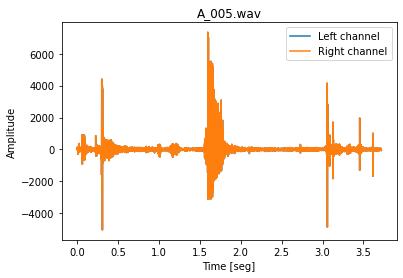

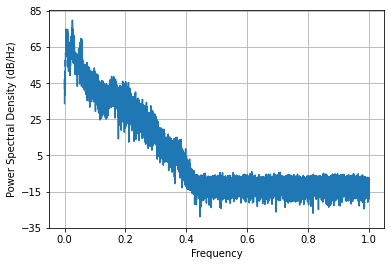

Duración:  3.7178333333333335
number of frames = 79576
number of channels = 2


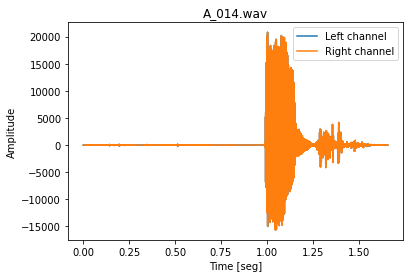

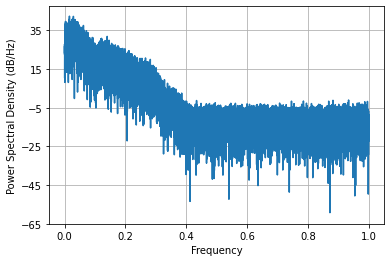

Duración:  1.6578333333333333
number of frames = 105496
number of channels = 1


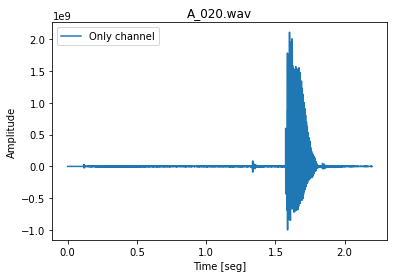

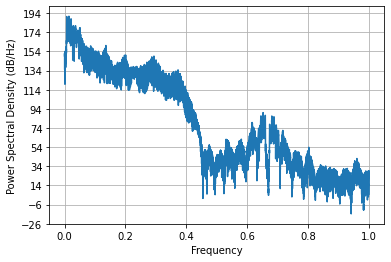

Duración:  2.1978333333333335
number of frames = 48856
number of channels = 2


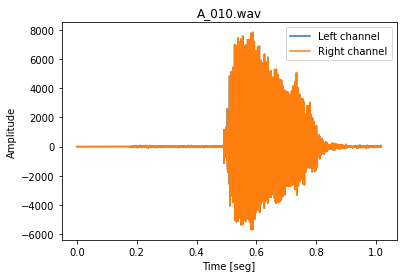

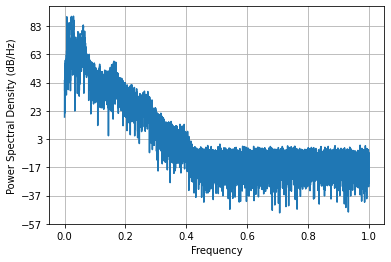

Duración:  1.0178333333333334
number of frames = 95896
number of channels = 2


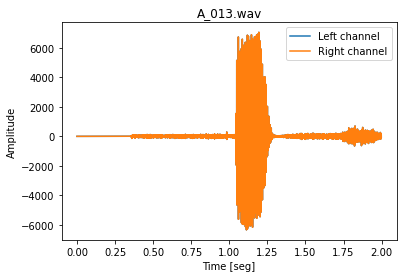

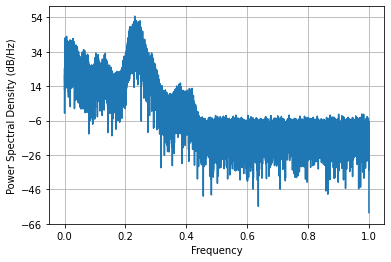

Duración:  1.9978333333333333
number of frames = 117016
number of channels = 1


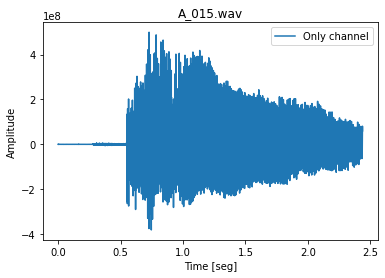

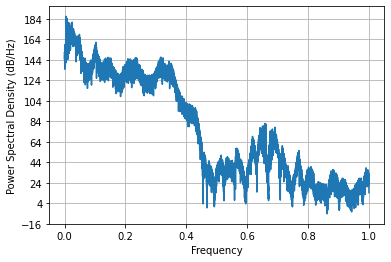

Duración:  2.4378333333333333
number of frames = 79576
number of channels = 1


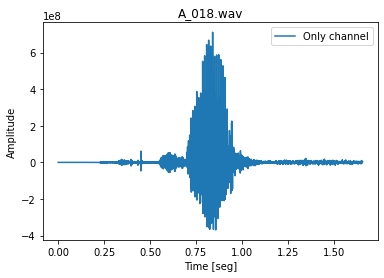

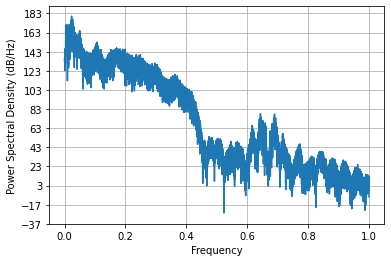

Duración:  1.6578333333333333
number of frames = 86936
number of channels = 2


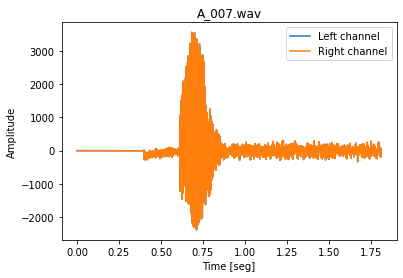

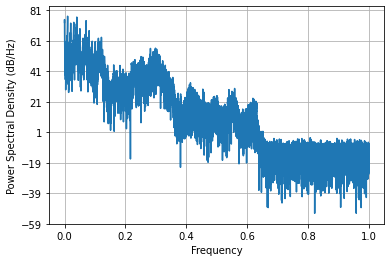

Duración:  1.8111666666666666
number of frames = 57496
number of channels = 2


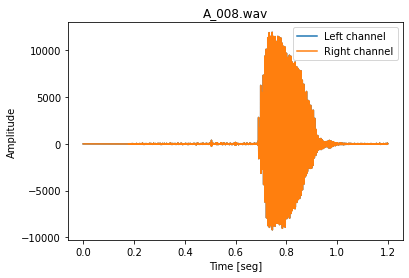

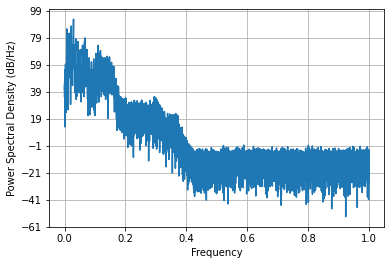

Duración:  1.1978333333333333
number of frames = 83416
number of channels = 1


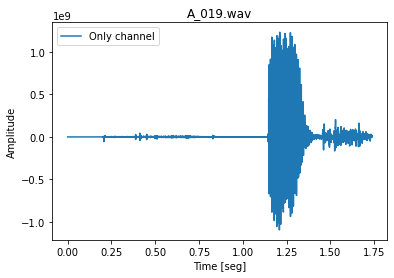

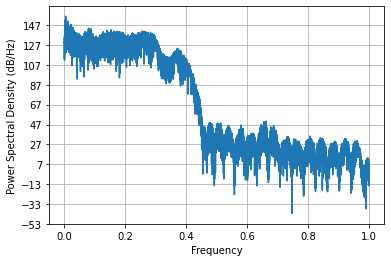

Duración:  1.7378333333333333
number of frames = 113176
number of channels = 1


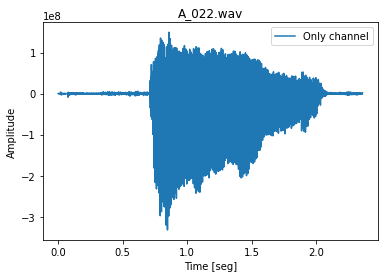

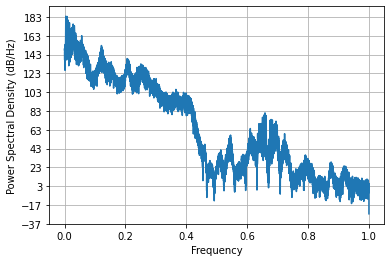

Duración:  2.3578333333333332
number of frames = 98776
number of channels = 1


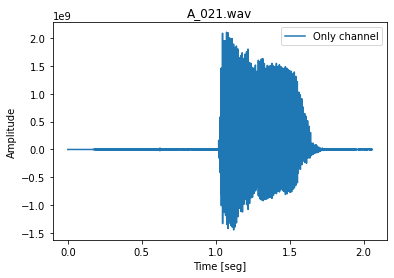

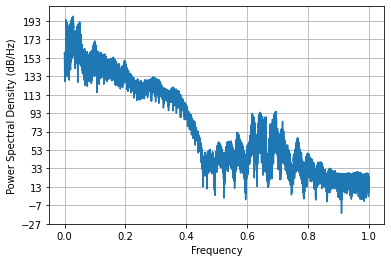

Duración:  2.0578333333333334
number of frames = 77656
number of channels = 1


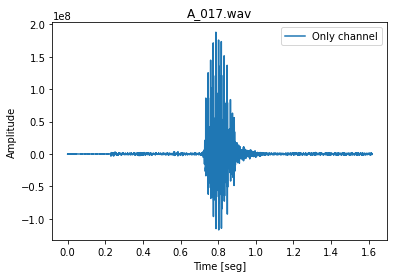

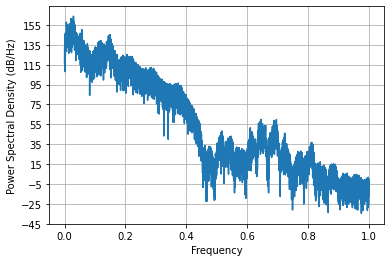

Duración:  1.6178333333333332
number of frames = 131416
number of channels = 2


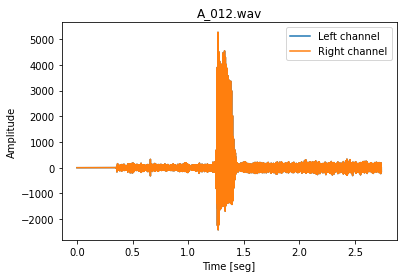

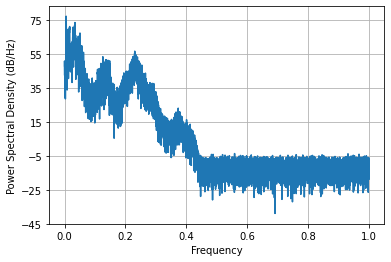

Duración:  2.737833333333333
number of frames = 75736
number of channels = 2


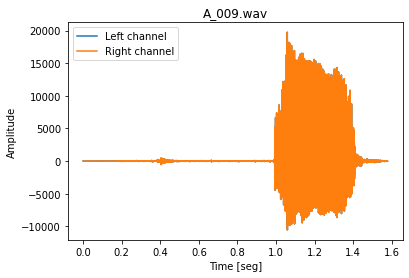

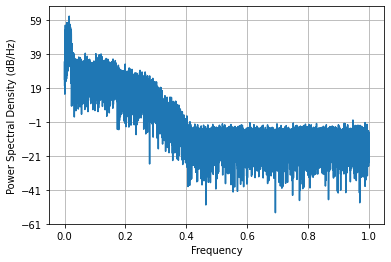

Duración:  1.5778333333333334
number of frames = 53656
number of channels = 2


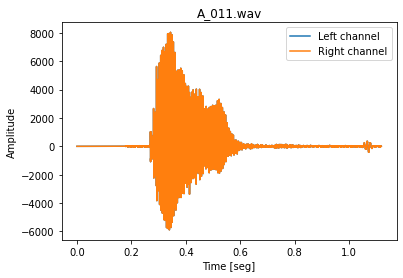

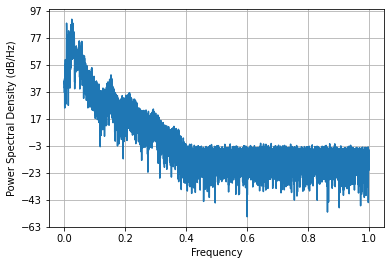

Duración:  1.1178333333333332
number of frames = 98082
number of channels = 2


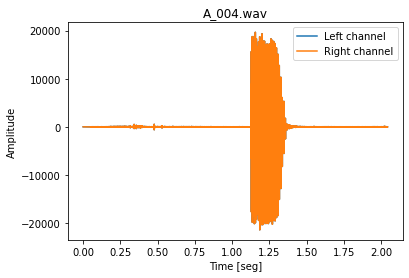

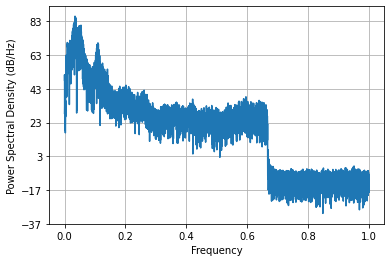

Duración:  2.043375
number of frames = 109128
number of channels = 1


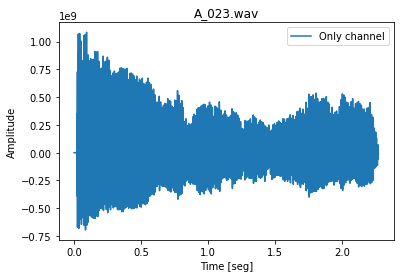

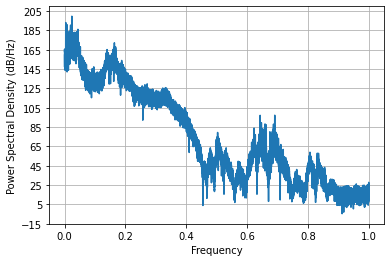

Duración:  2.2735
number of frames = 53661
number of channels = 1


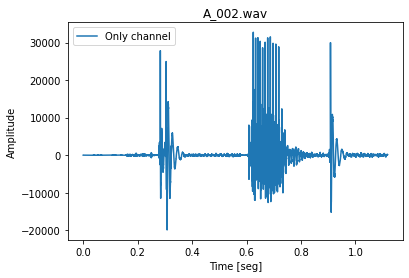

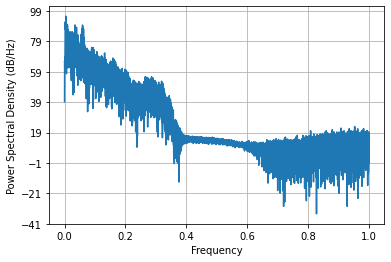

Duración:  1.1179375
number of frames = 78020
number of channels = 2


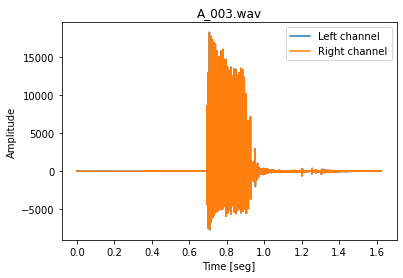

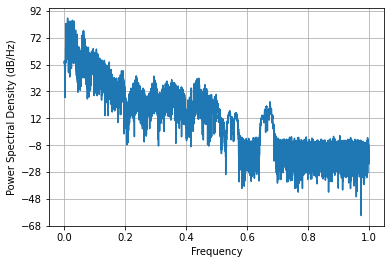

Duración:  1.6254166666666667
number of frames = 74676
number of channels = 2


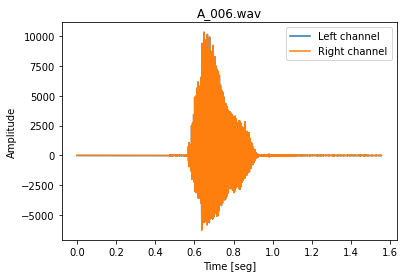

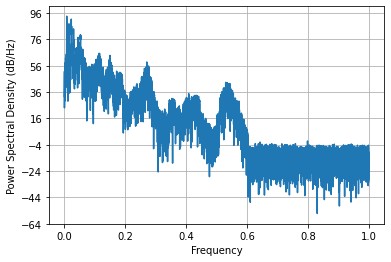

Duración:  1.55575
number of frames = 105375
number of channels = 2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


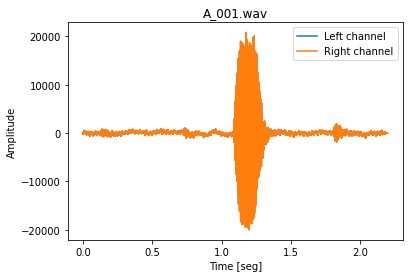

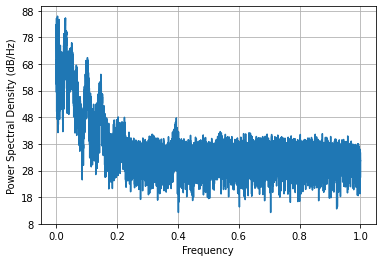

Duración:  2.1953125
number of frames = 69016
number of channels = 1


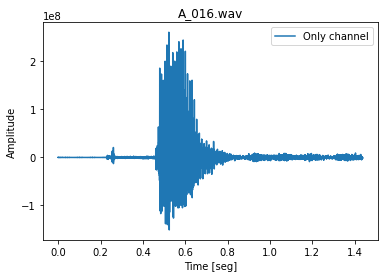

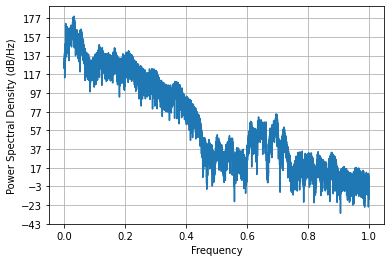

Duración:  1.4378333333333333
number of frames = 113176
number of channels = 1


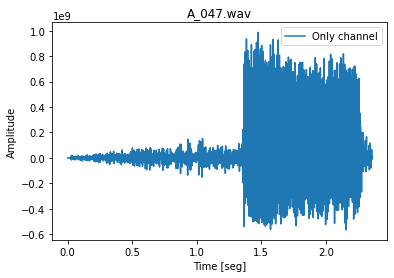

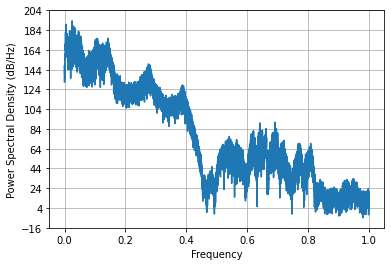

Duración:  2.3578333333333332
number of frames = 65928
number of channels = 1


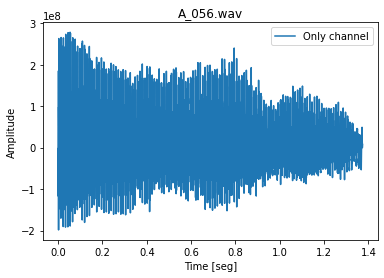

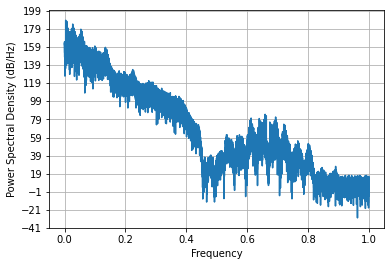

Duración:  1.3735
number of frames = 64216
number of channels = 1


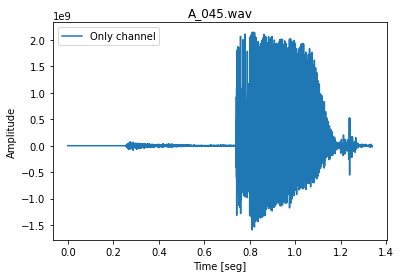

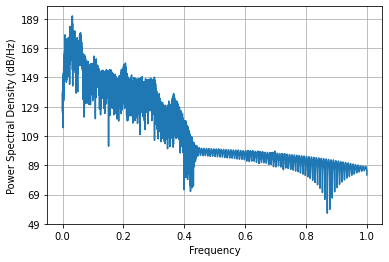

Duración:  1.3378333333333334
number of frames = 98568
number of channels = 1


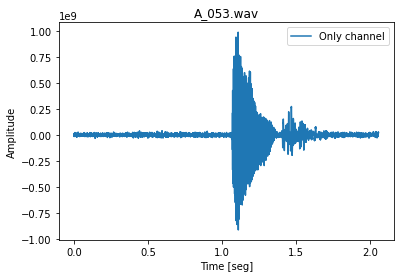

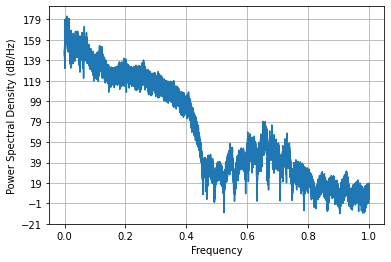

Duración:  2.0535
number of frames = 102446
number of channels = 1


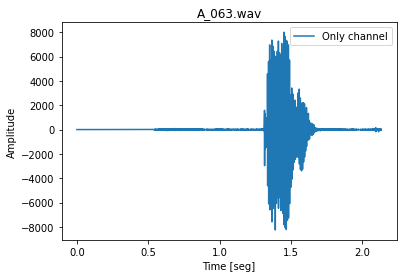

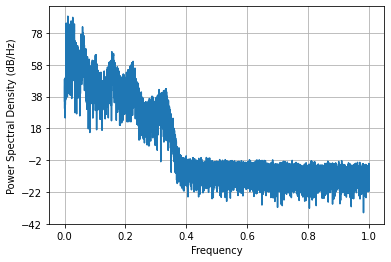

Duración:  2.1342916666666665
number of frames = 102616
number of channels = 1


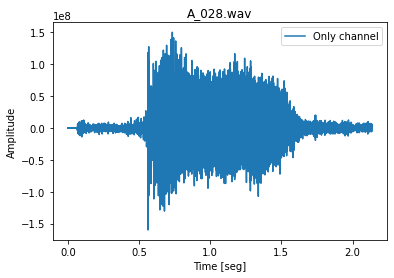

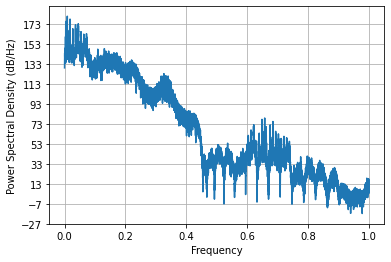

Duración:  2.1378333333333335
number of frames = 113176
number of channels = 1


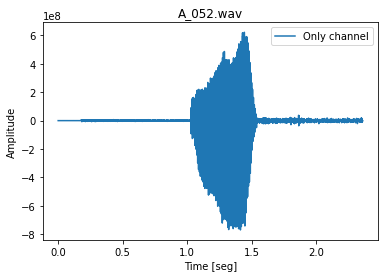

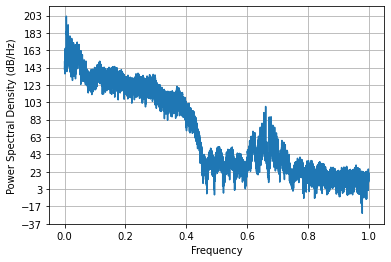

Duración:  2.3578333333333332
number of frames = 59416
number of channels = 1


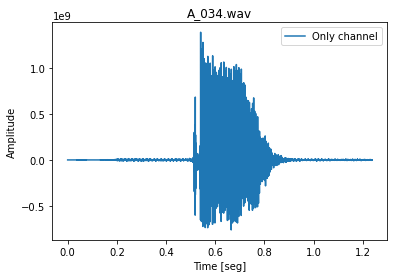

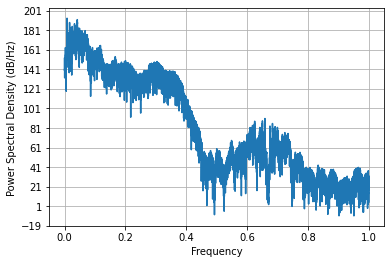

Duración:  1.2378333333333333
number of frames = 63048
number of channels = 1


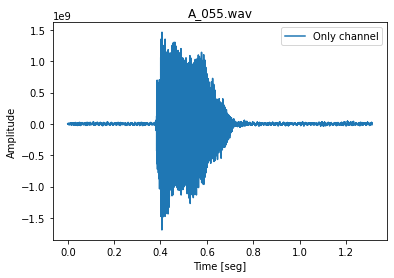

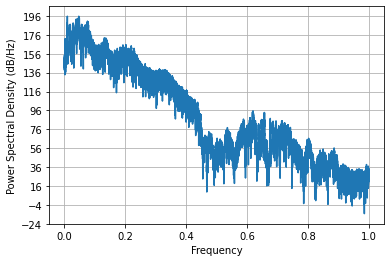

Duración:  1.3135
number of frames = 74568
number of channels = 1


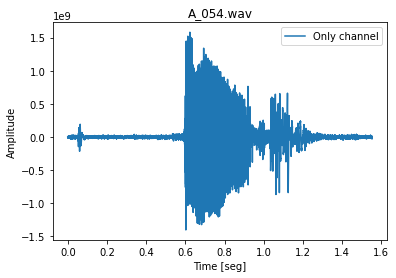

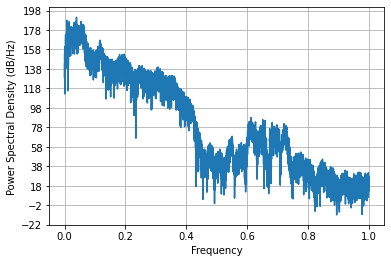

Duración:  1.5535
number of frames = 115096
number of channels = 1


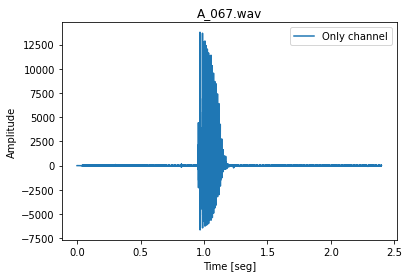

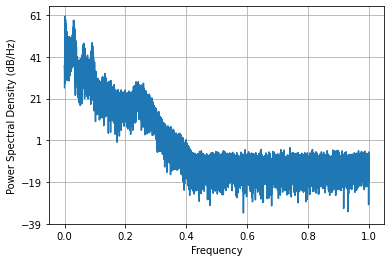

Duración:  2.3978333333333333
number of frames = 64216
number of channels = 1


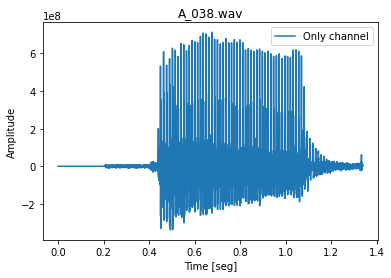

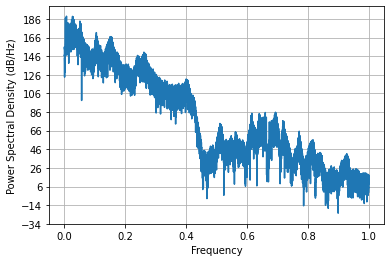

Duración:  1.3378333333333334
number of frames = 66888
number of channels = 1


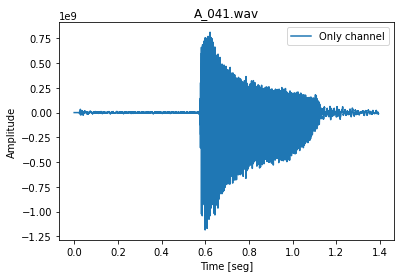

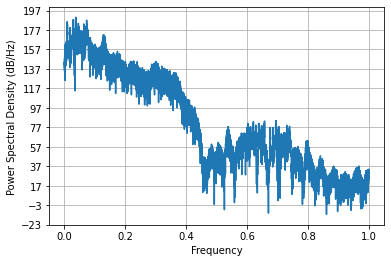

Duración:  1.3935
number of frames = 93016
number of channels = 1


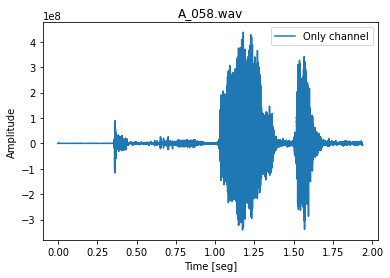

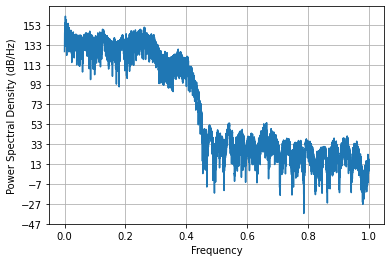

Duración:  1.9378333333333333
number of frames = 62296
number of channels = 1


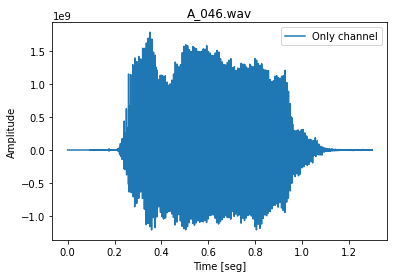

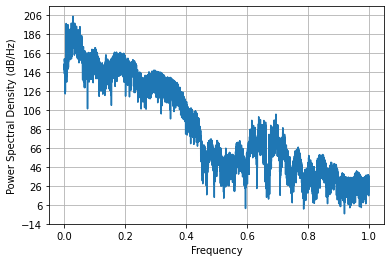

Duración:  1.2978333333333334
number of frames = 120648
number of channels = 1


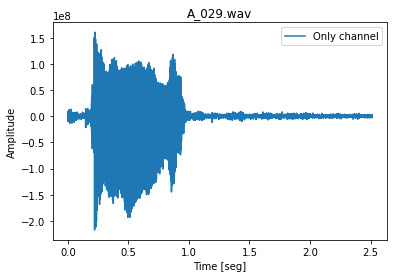

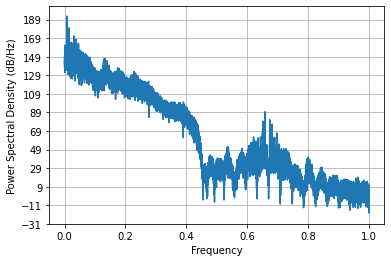

Duración:  2.5135
number of frames = 69768
number of channels = 1


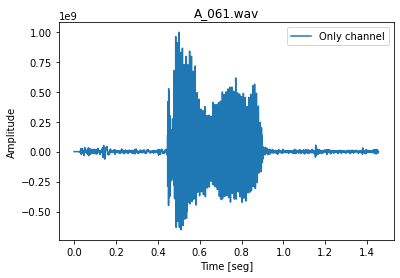

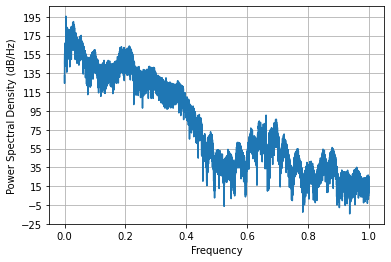

Duración:  1.4535
number of frames = 65176
number of channels = 1


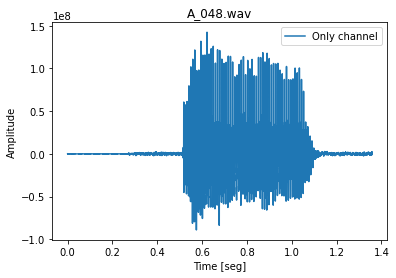

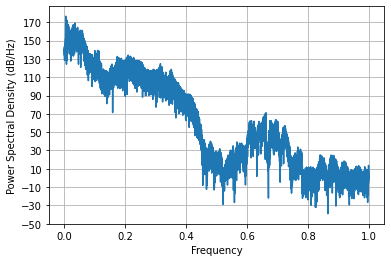

Duración:  1.3578333333333332
number of frames = 64216
number of channels = 1


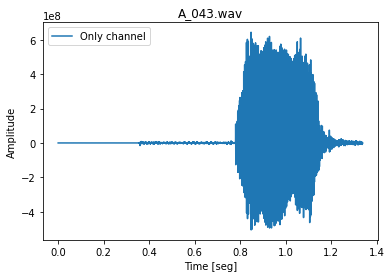

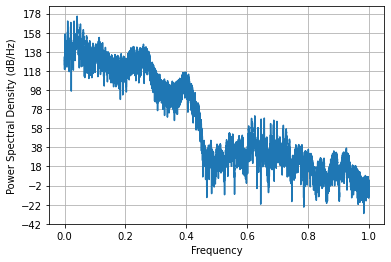

Duración:  1.3378333333333334
number of frames = 60376
number of channels = 1


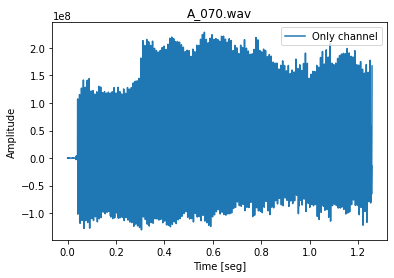

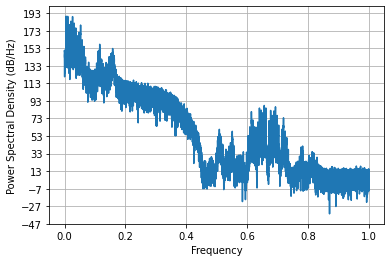

Duración:  1.2578333333333334
number of frames = 60376
number of channels = 1


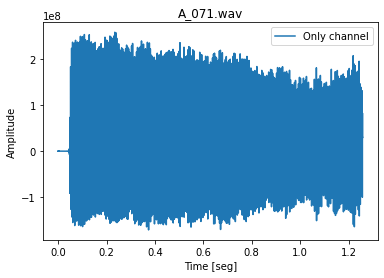

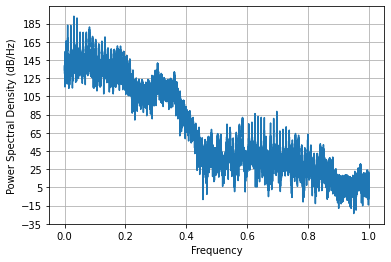

Duración:  1.2578333333333334
number of frames = 156168
number of channels = 1


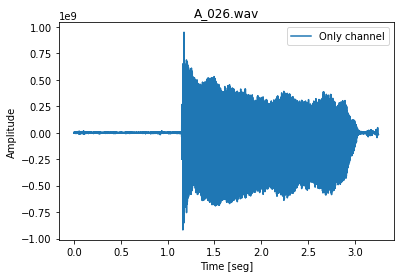

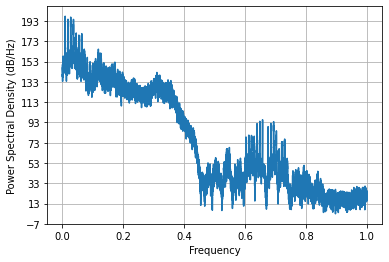

Duración:  3.2535
number of frames = 92808
number of channels = 1


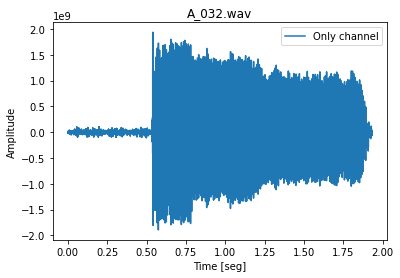

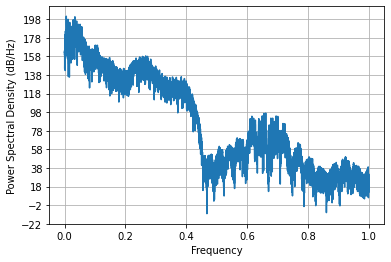

Duración:  1.9335
number of frames = 81496
number of channels = 1


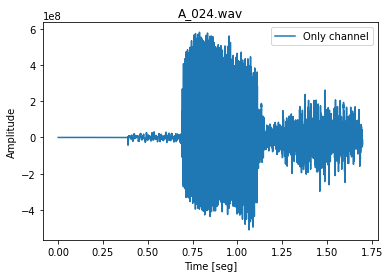

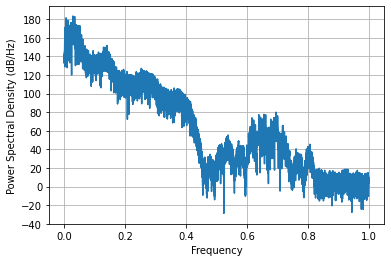

Duración:  1.6978333333333333
number of frames = 82456
number of channels = 1


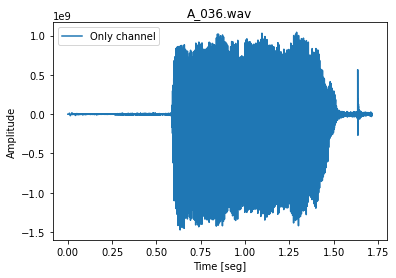

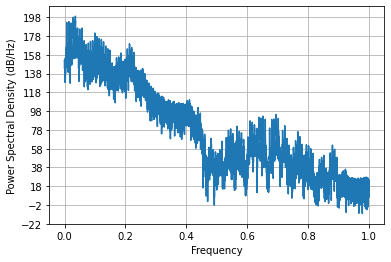

Duración:  1.7178333333333333
number of frames = 84376
number of channels = 1


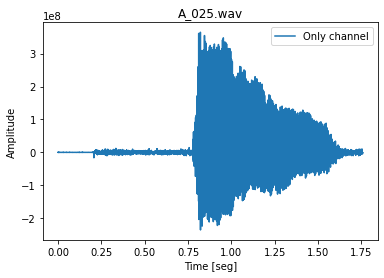

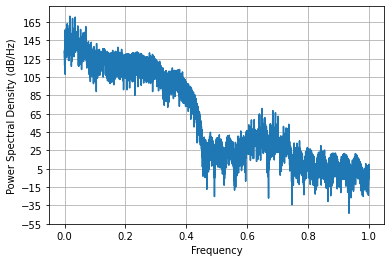

Duración:  1.7578333333333334
number of frames = 123528
number of channels = 1


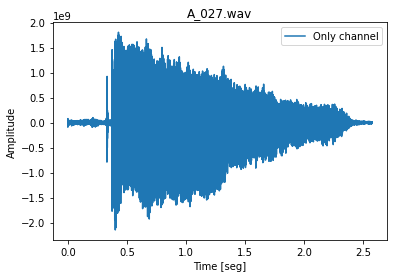

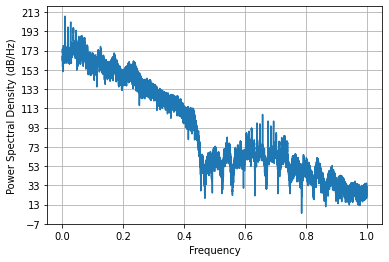

Duración:  2.5735
number of frames = 82456
number of channels = 1


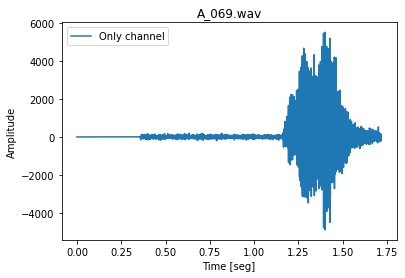

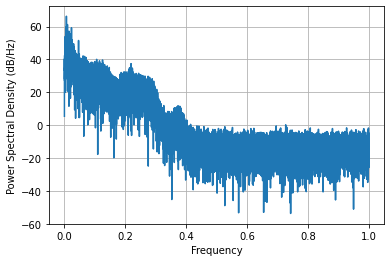

Duración:  1.7178333333333333
number of frames = 122776
number of channels = 1


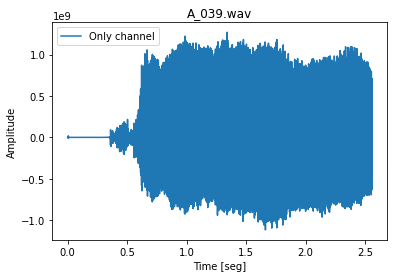

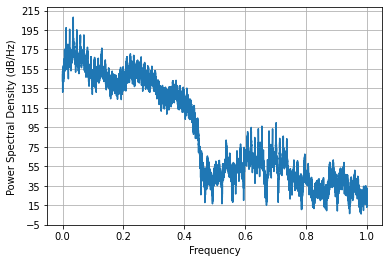

Duración:  2.5578333333333334
number of frames = 48856
number of channels = 1


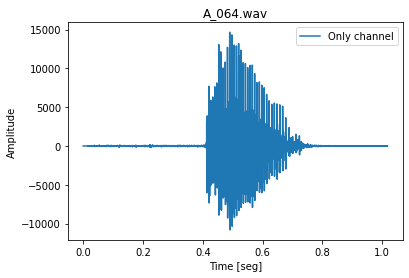

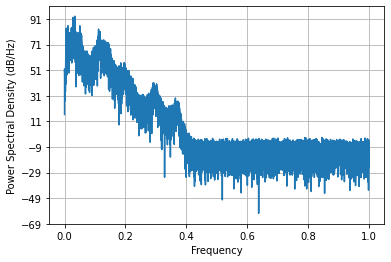

Duración:  1.0178333333333334
number of frames = 122776
number of channels = 1


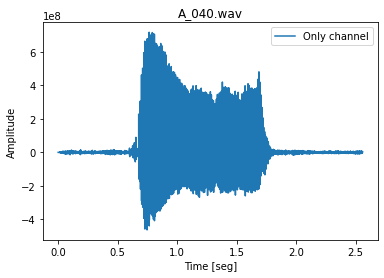

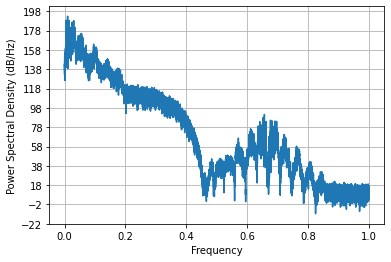

Duración:  2.5578333333333334
number of frames = 94936
number of channels = 1


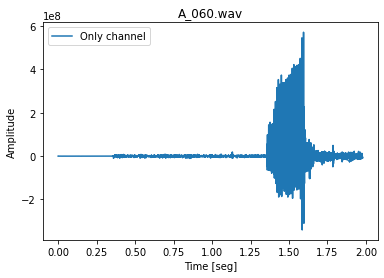

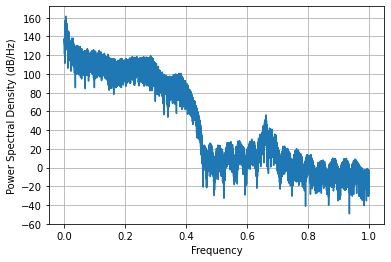

Duración:  1.9778333333333333
number of frames = 267840
number of channels = 1


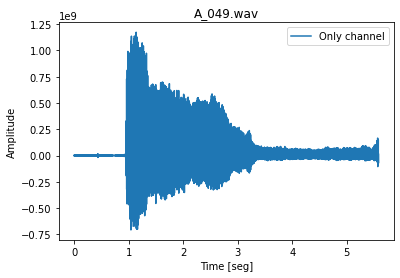

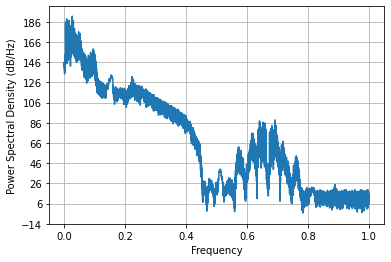

Duración:  5.58
number of frames = 165016
number of channels = 1


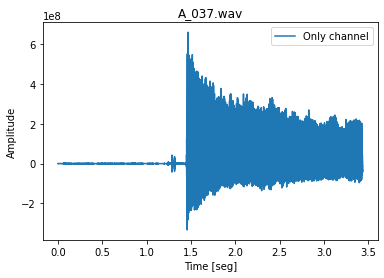

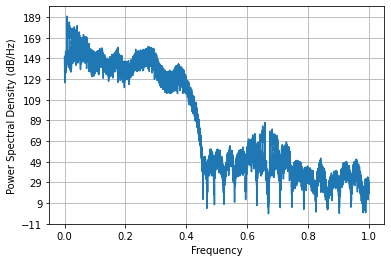

Duración:  3.4378333333333333
number of frames = 167896
number of channels = 1


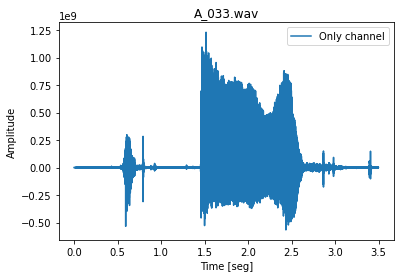

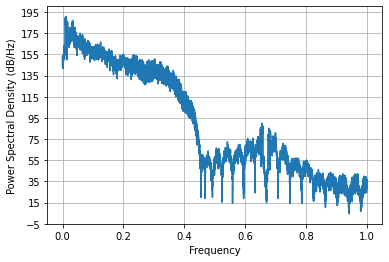

Duración:  3.4978333333333333
number of frames = 50776
number of channels = 1


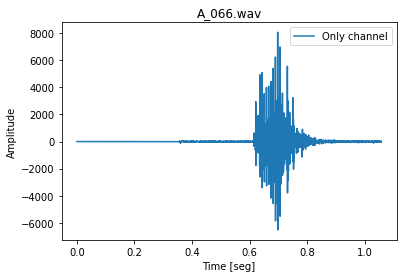

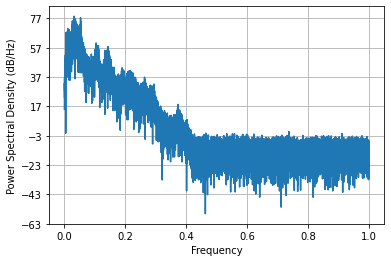

Duración:  1.0578333333333334
number of frames = 63256
number of channels = 1


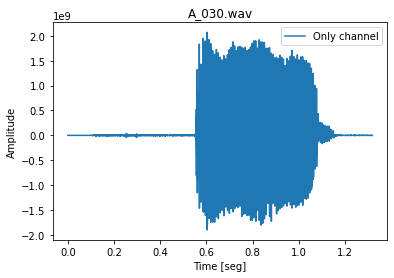

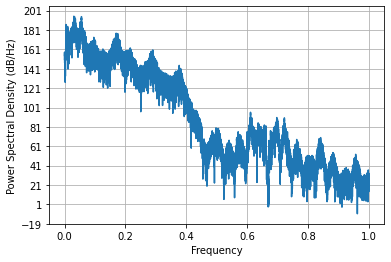

Duración:  1.3178333333333334
number of frames = 110296
number of channels = 1


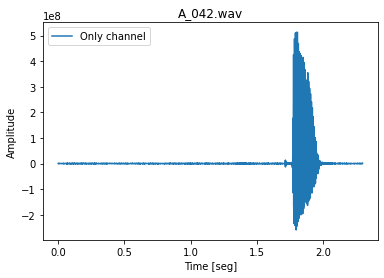

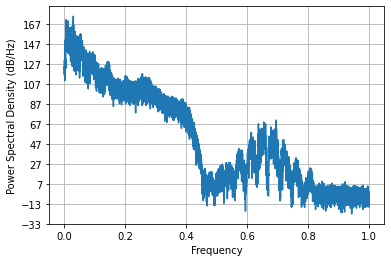

Duración:  2.297833333333333
number of frames = 69976
number of channels = 1


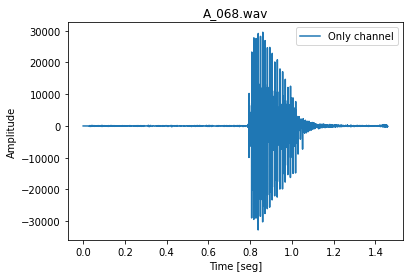

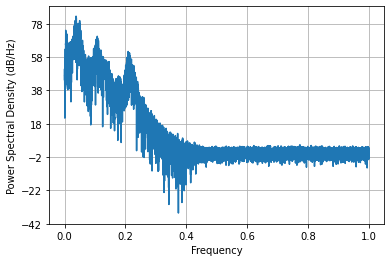

Duración:  1.4578333333333333
number of frames = 89928
number of channels = 1


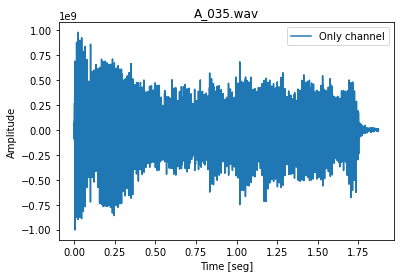

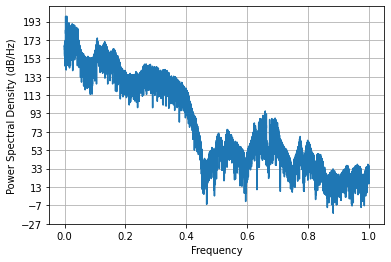

Duración:  1.8735
number of frames = 52488
number of channels = 1


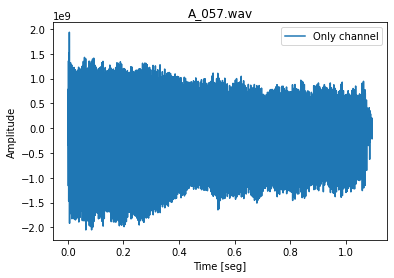

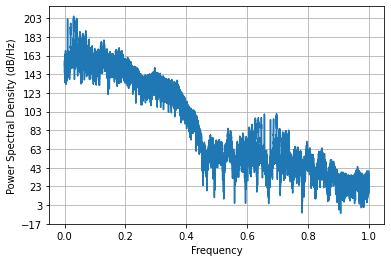

Duración:  1.0935
number of frames = 93016
number of channels = 1


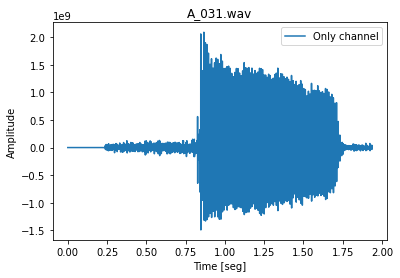

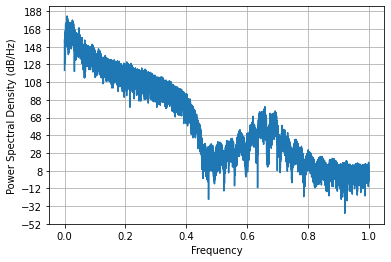

Duración:  1.9378333333333333
number of frames = 58456
number of channels = 1


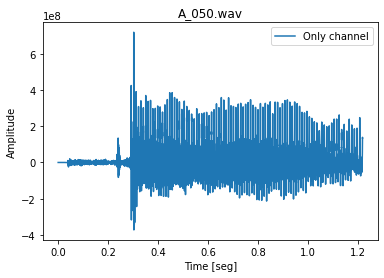

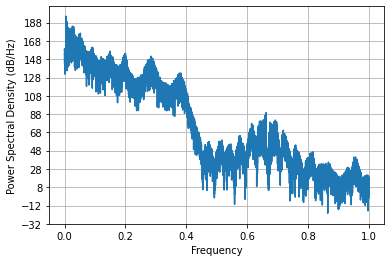

Duración:  1.2178333333333333
number of frames = 57496
number of channels = 1


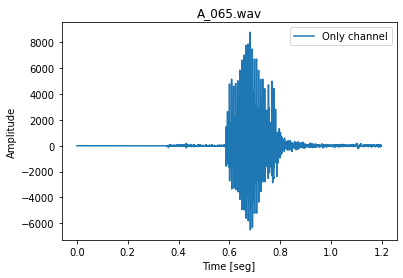

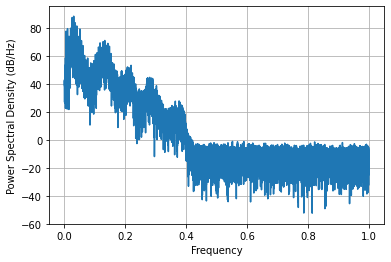

Duración:  1.1978333333333333
number of frames = 56536
number of channels = 1


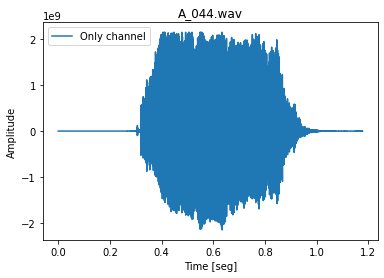

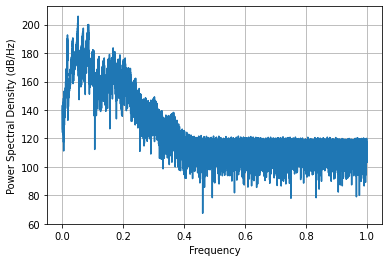

Duración:  1.1778333333333333
number of frames = 66888
number of channels = 1


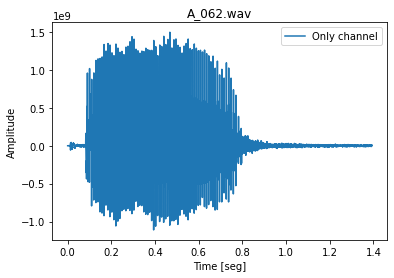

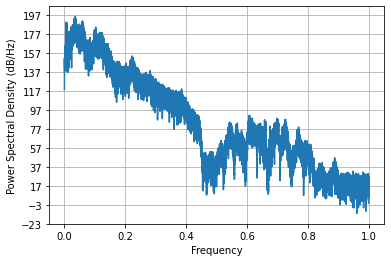

Duración:  1.3935
number of frames = 190728
number of channels = 1


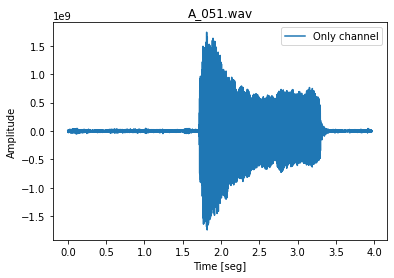

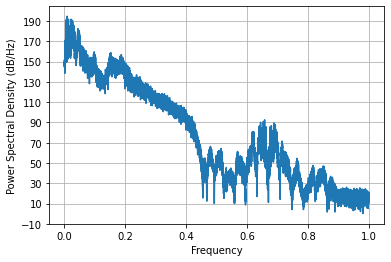

Duración:  3.9735
number of frames = 148696
number of channels = 1


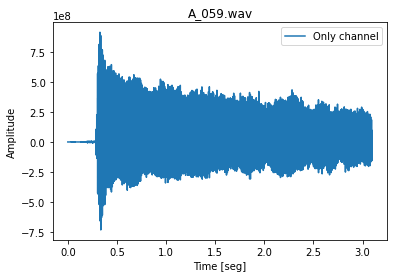

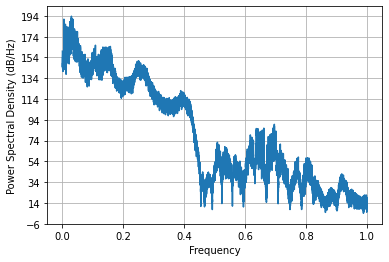

Duración:  3.0978333333333334
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not underst

In [21]:
for a in A_records:
    visualize_wav_info(path_A, a)

Visualizamos la información para las muestras de la clase **E**.

number of frames = 110296
number of channels = 1


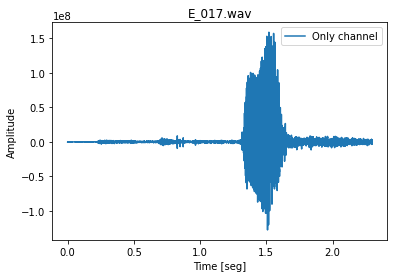

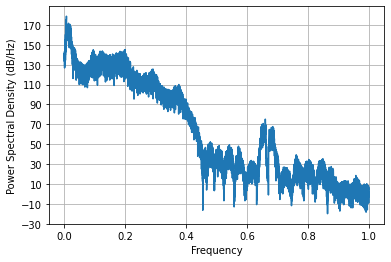

Duración:  2.297833333333333
number of frames = 61336
number of channels = 2


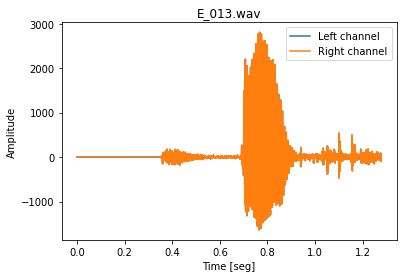

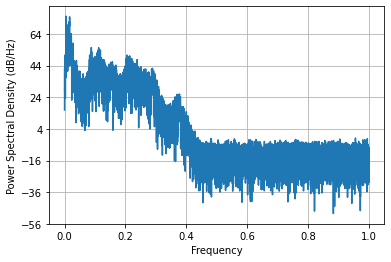

Duración:  1.2778333333333334
number of frames = 101425
number of channels = 2


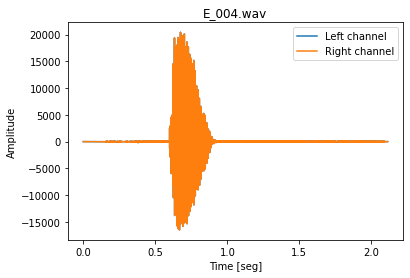

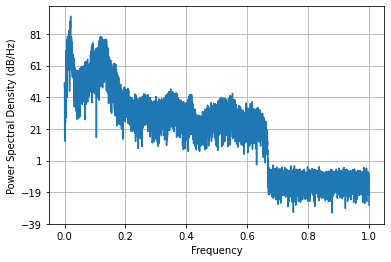

Duración:  2.113020833333333
number of frames = 56536
number of channels = 2


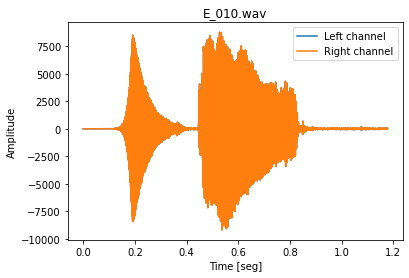

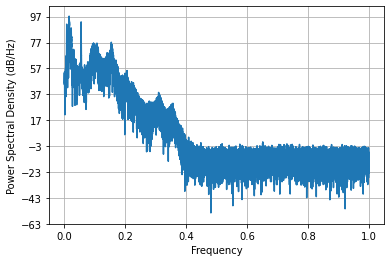

Duración:  1.1778333333333333
number of frames = 119896
number of channels = 1


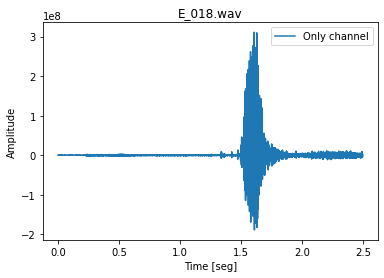

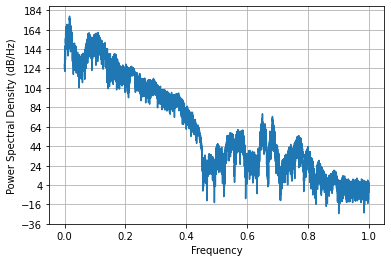

Duración:  2.4978333333333333
number of frames = 117976
number of channels = 1


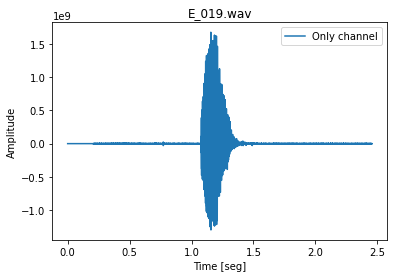

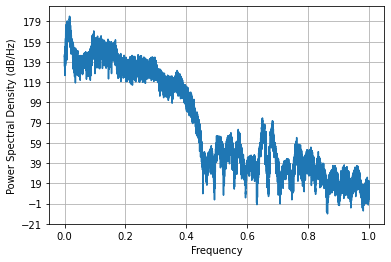

Duración:  2.4578333333333333
number of frames = 115101
number of channels = 1


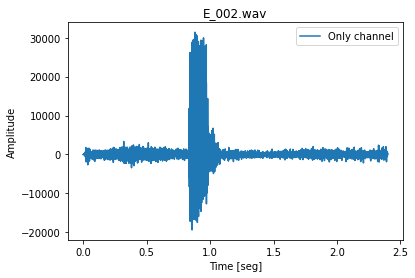

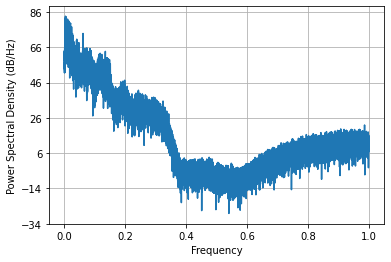

Duración:  2.3979375
number of frames = 57496
number of channels = 2


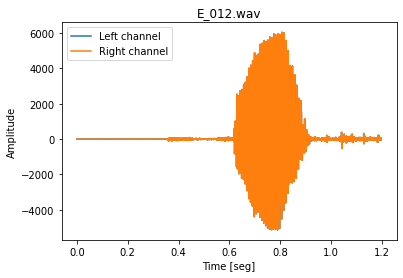

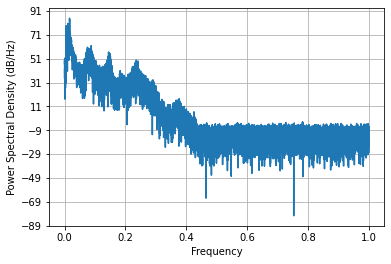

Duración:  1.1978333333333333
number of frames = 66136
number of channels = 2


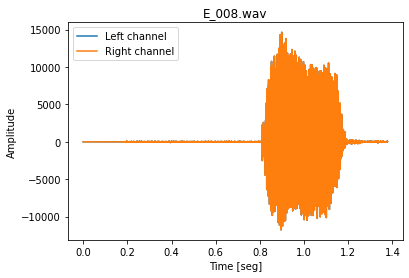

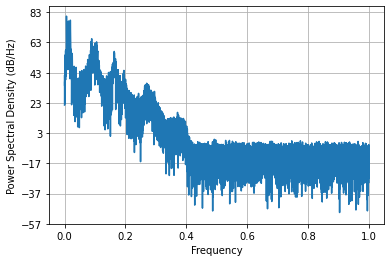

Duración:  1.3778333333333332
number of frames = 115096
number of channels = 1


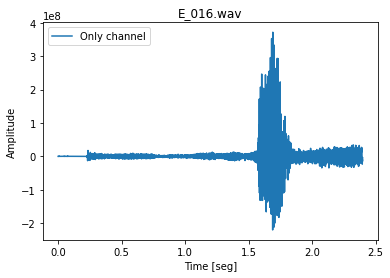

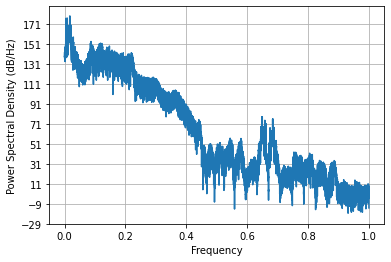

Duración:  2.3978333333333333
number of frames = 81363
number of channels = 2


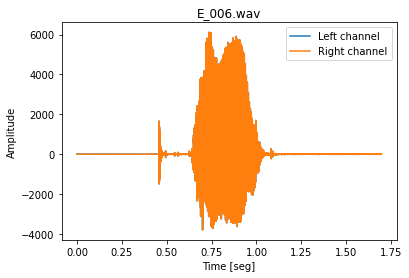

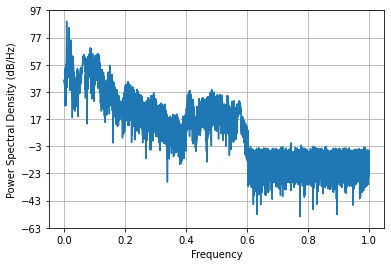

Duración:  1.6950625
number of frames = 133336
number of channels = 2


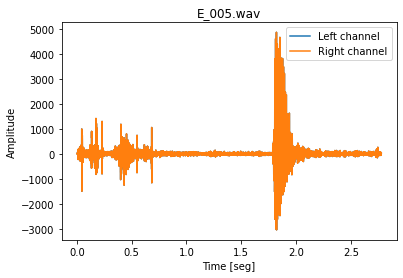

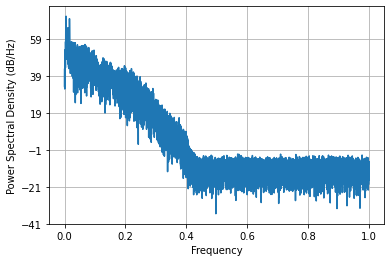

Duración:  2.777833333333333
number of frames = 131072
number of channels = 2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


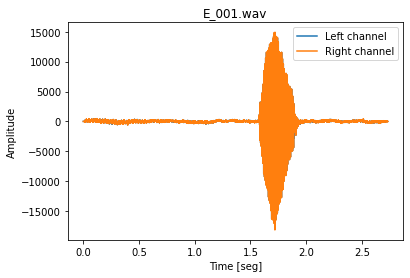

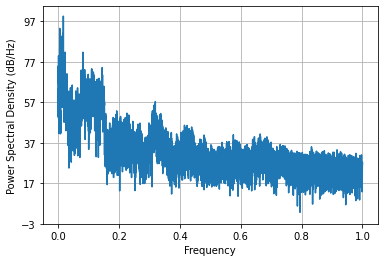

Duración:  2.7306666666666666
number of frames = 79576
number of channels = 2


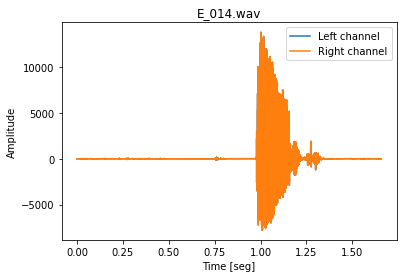

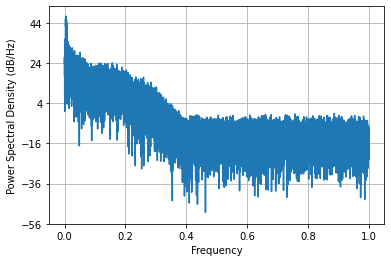

Duración:  1.6578333333333333
number of frames = 51736
number of channels = 2


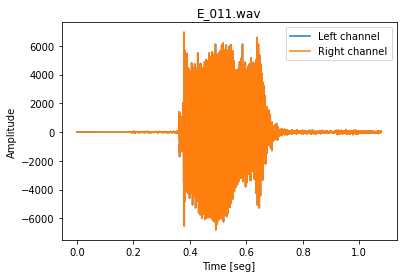

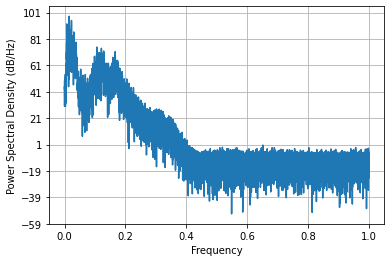

Duración:  1.0778333333333334
number of frames = 162136
number of channels = 1


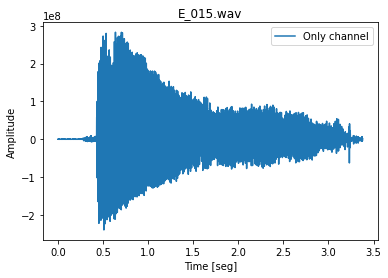

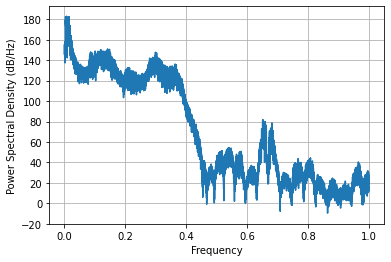

Duración:  3.3778333333333332
number of frames = 82478
number of channels = 2


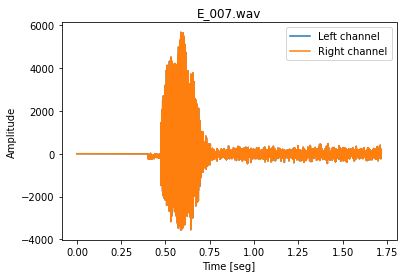

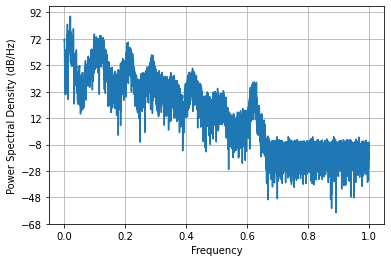

Duración:  1.7182916666666668
number of frames = 83416
number of channels = 1


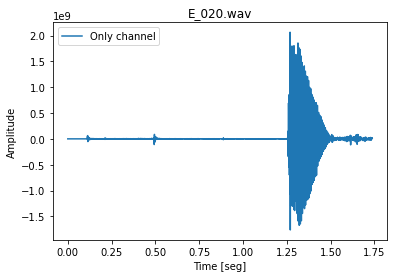

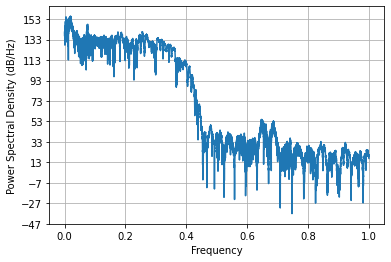

Duración:  1.7378333333333333
number of frames = 54616
number of channels = 2


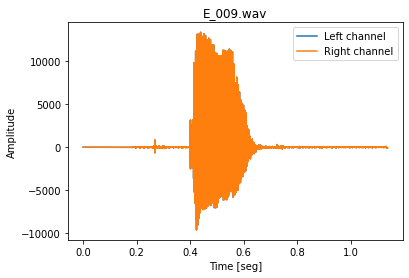

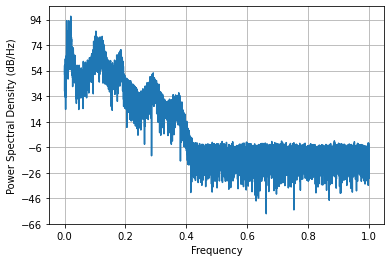

Duración:  1.1378333333333333
number of frames = 64968
number of channels = 1


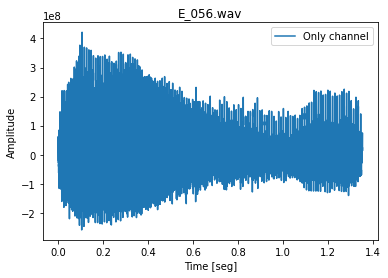

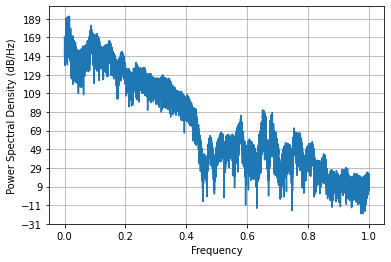

Duración:  1.3535
number of frames = 77448
number of channels = 1


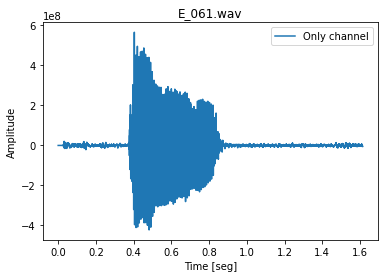

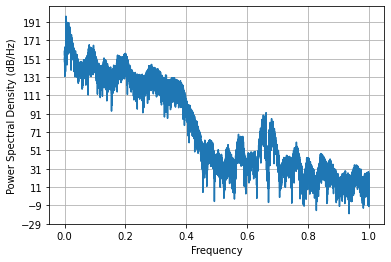

Duración:  1.6135
number of frames = 88216
number of channels = 1


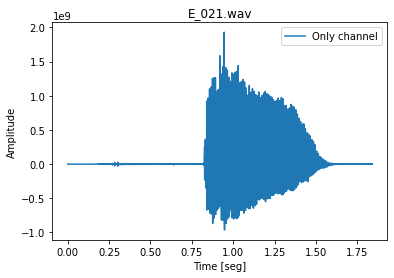

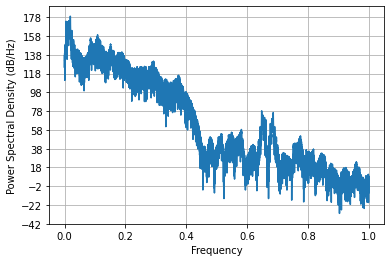

Duración:  1.8378333333333334
number of frames = 59416
number of channels = 1


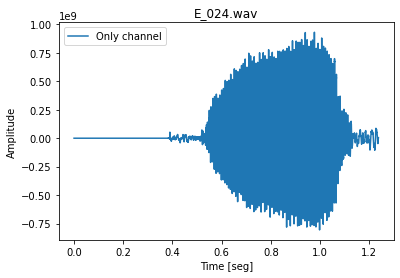

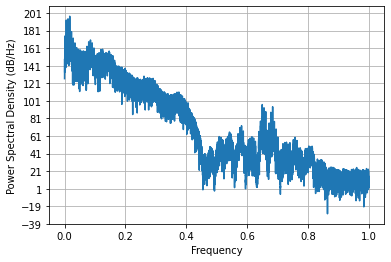

Duración:  1.2378333333333333
number of frames = 205128
number of channels = 1


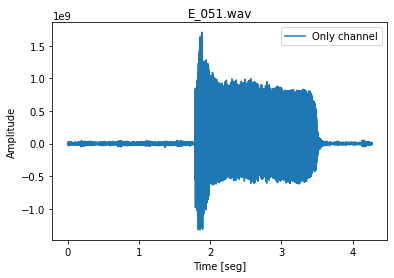

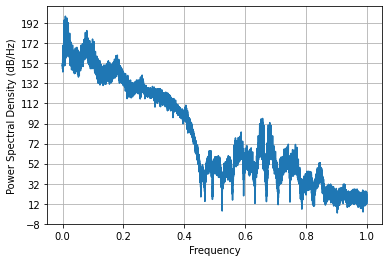

Duración:  4.2735
number of frames = 77656
number of channels = 1


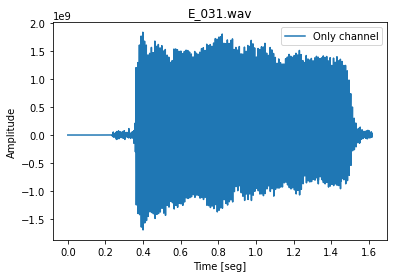

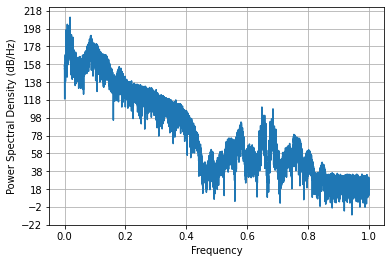

Duración:  1.6178333333333332
number of frames = 63256
number of channels = 1


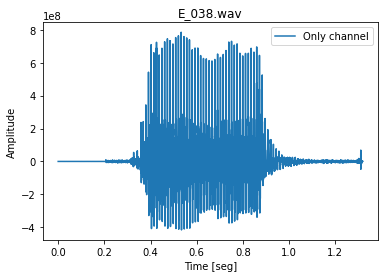

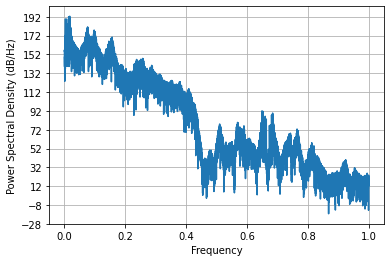

Duración:  1.3178333333333334
number of frames = 116056
number of channels = 1


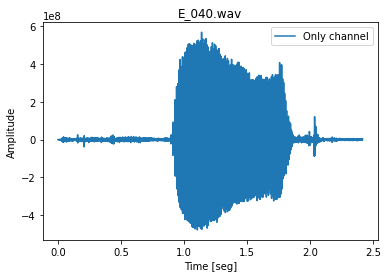

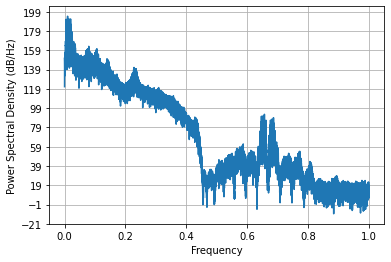

Duración:  2.4178333333333333
number of frames = 67096
number of channels = 1


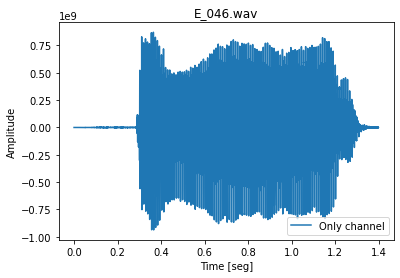

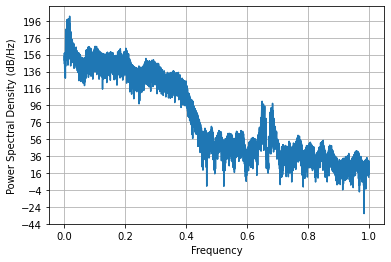

Duración:  1.3978333333333333
number of frames = 84376
number of channels = 1


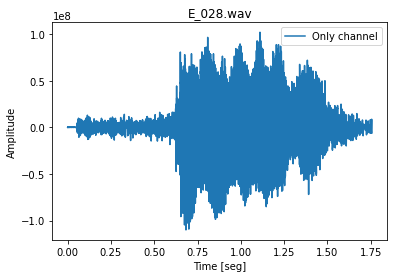

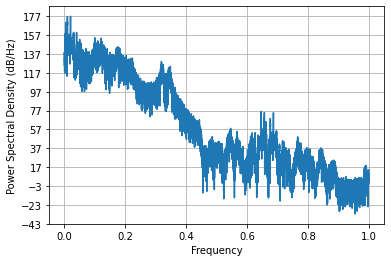

Duración:  1.7578333333333334
number of frames = 101656
number of channels = 1


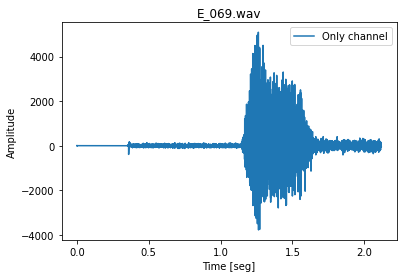

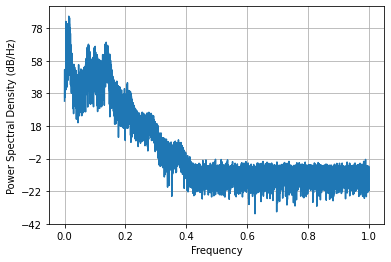

Duración:  2.1178333333333335
number of frames = 117016
number of channels = 1


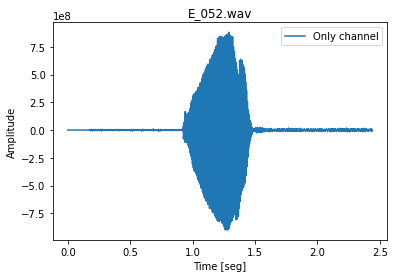

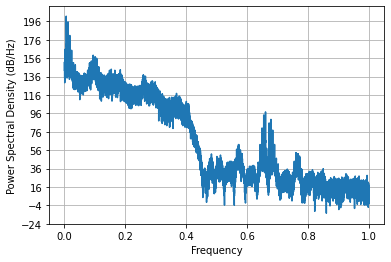

Duración:  2.4378333333333333
number of frames = 111048
number of channels = 1


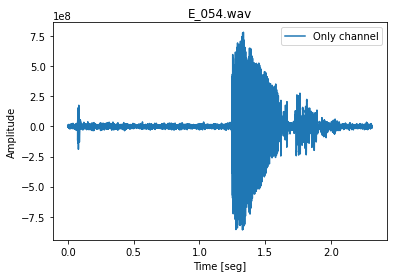

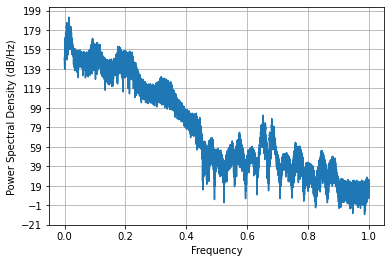

Duración:  2.3135
number of frames = 71688
number of channels = 1


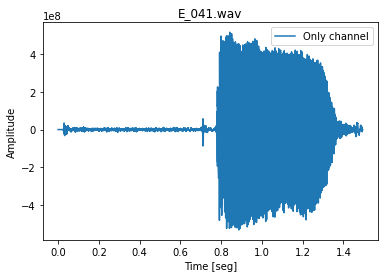

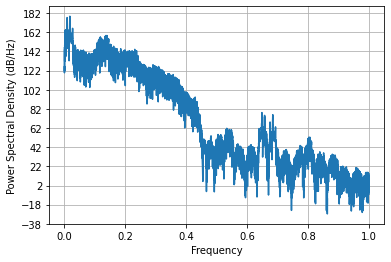

Duración:  1.4935
number of frames = 98776
number of channels = 1


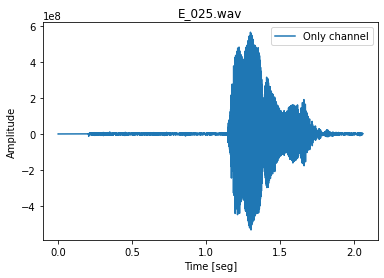

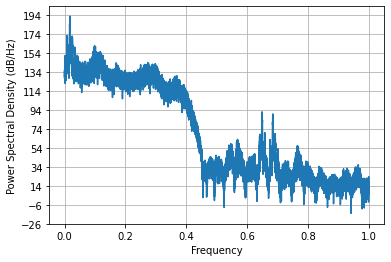

Duración:  2.0578333333333334
number of frames = 93016
number of channels = 1


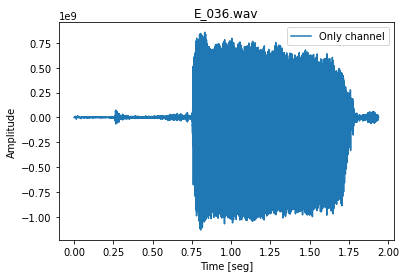

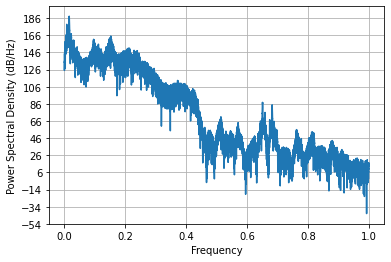

Duración:  1.9378333333333333
number of frames = 61336
number of channels = 1


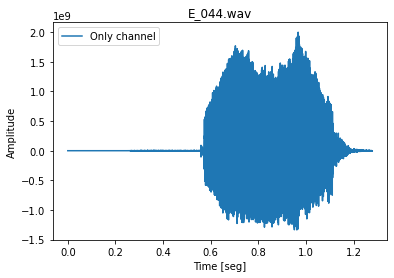

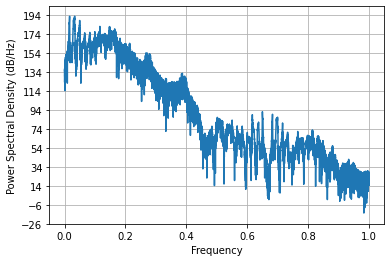

Duración:  1.2778333333333334
number of frames = 115096
number of channels = 1


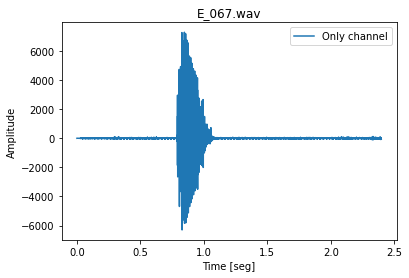

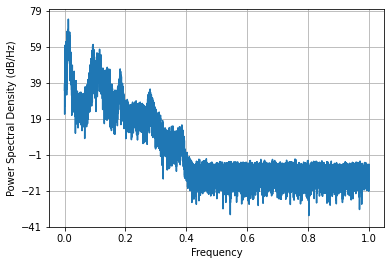

Duración:  2.3978333333333333
number of frames = 108168
number of channels = 1


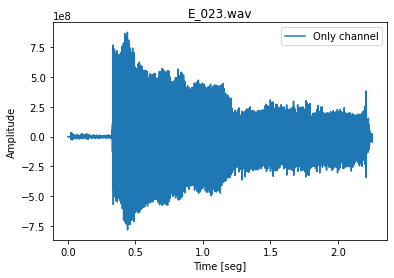

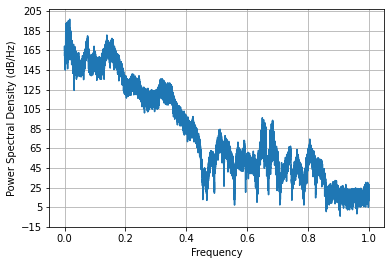

Duración:  2.2535
number of frames = 79368
number of channels = 1


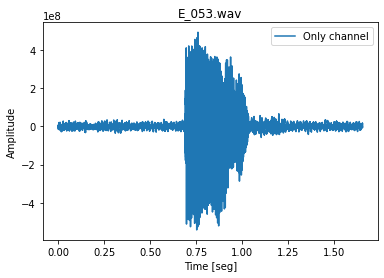

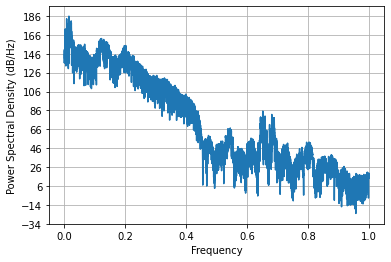

Duración:  1.6535
number of frames = 118728
number of channels = 1


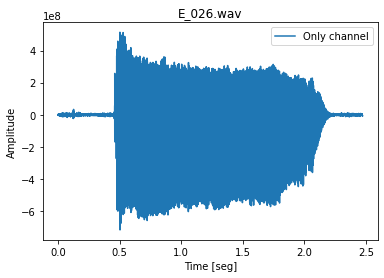

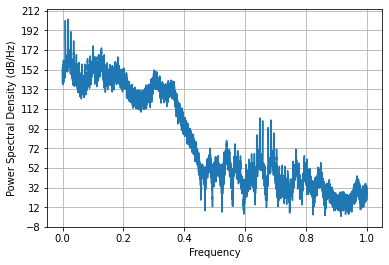

Duración:  2.4735
number of frames = 173656
number of channels = 1


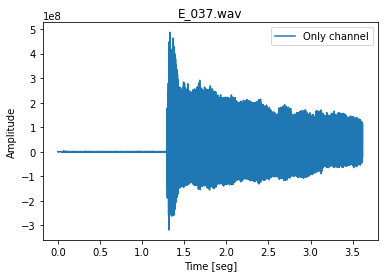

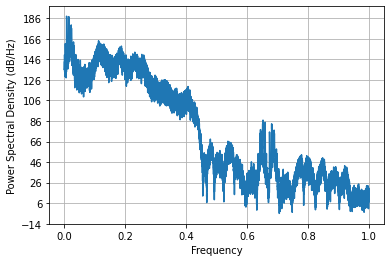

Duración:  3.6178333333333335
number of frames = 54408
number of channels = 1


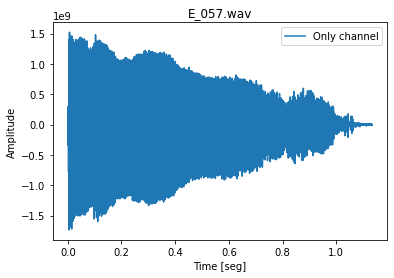

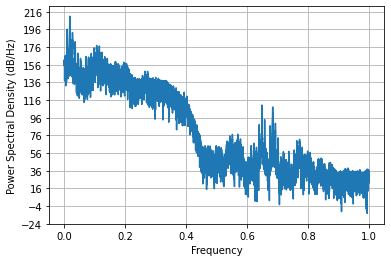

Duración:  1.1335
number of frames = 75528
number of channels = 1


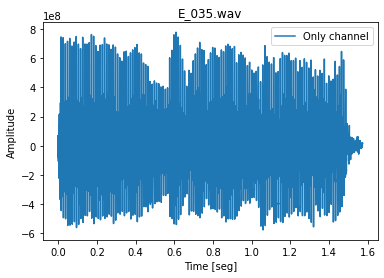

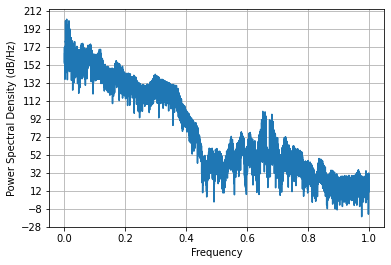

Duración:  1.5735
number of frames = 56536
number of channels = 1


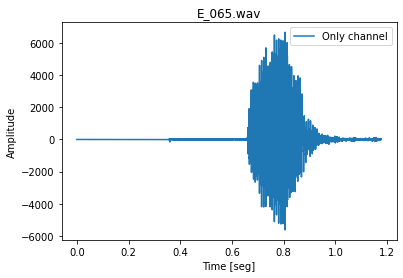

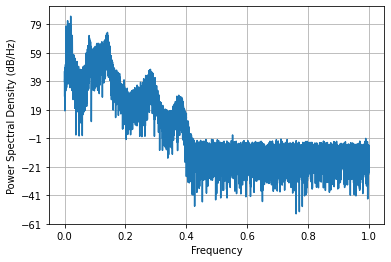

Duración:  1.1778333333333333
number of frames = 79368
number of channels = 1


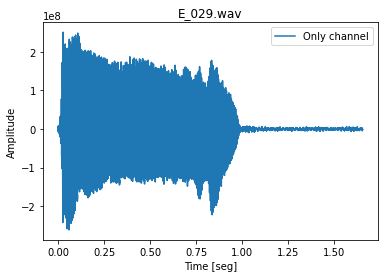

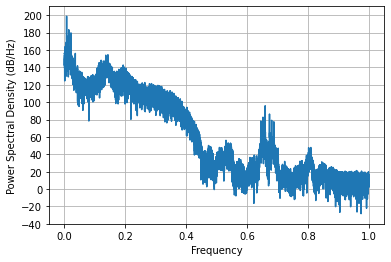

Duración:  1.6535
number of frames = 115096
number of channels = 1


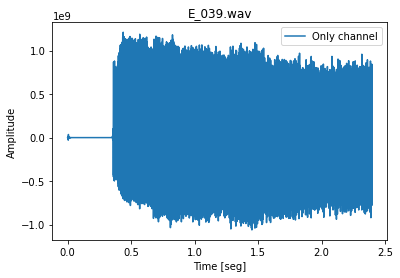

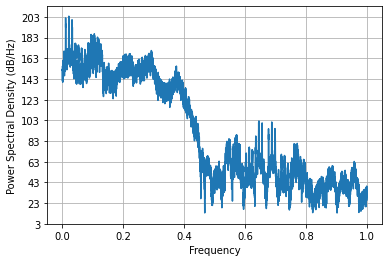

Duración:  2.3978333333333333
number of frames = 175576
number of channels = 1


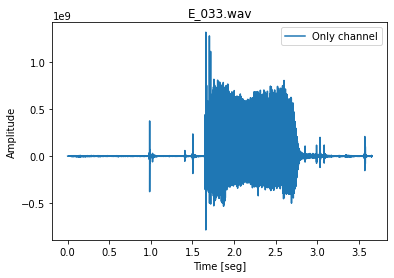

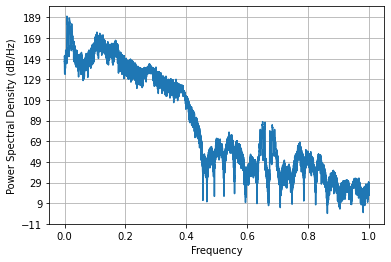

Duración:  3.6578333333333335
number of frames = 80536
number of channels = 1


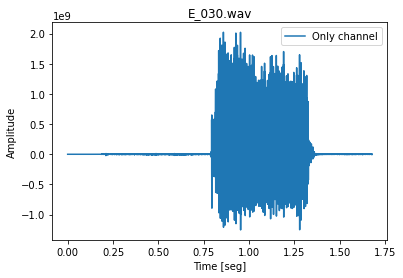

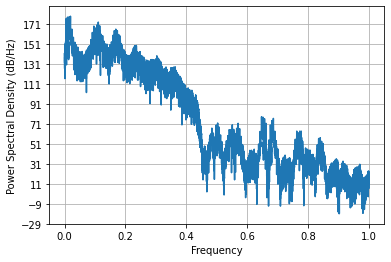

Duración:  1.6778333333333333
number of frames = 72856
number of channels = 1


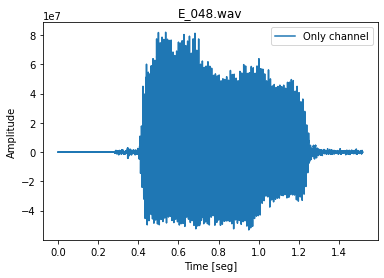

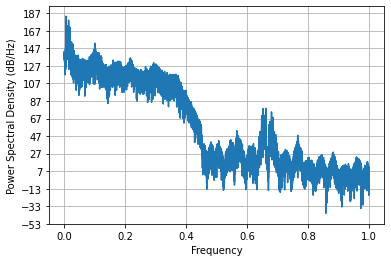

Duración:  1.5178333333333334
number of frames = 117976
number of channels = 1


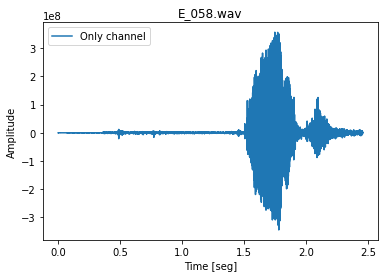

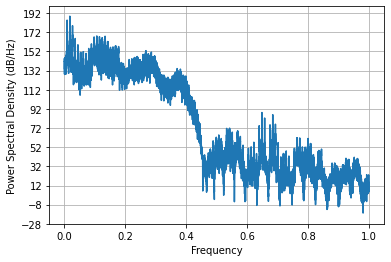

Duración:  2.4578333333333333
number of frames = 74776
number of channels = 1


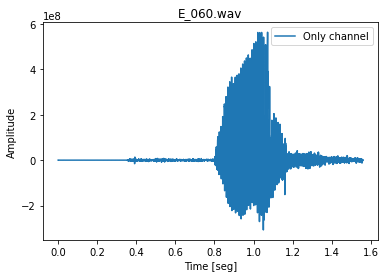

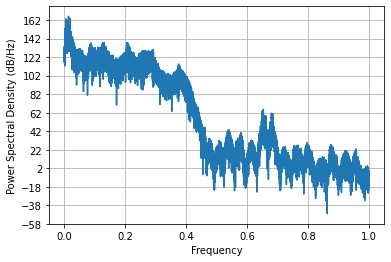

Duración:  1.5578333333333334
number of frames = 113176
number of channels = 1


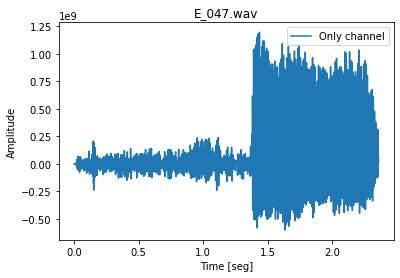

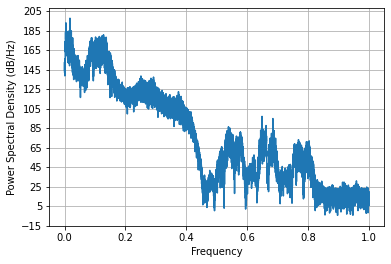

Duración:  2.3578333333333332
number of frames = 62640
number of channels = 1


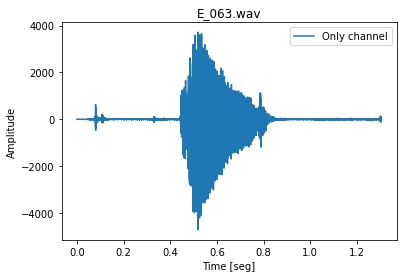

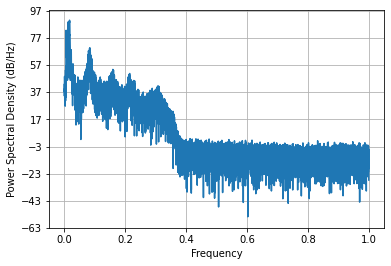

Duración:  1.305
number of frames = 66136
number of channels = 1


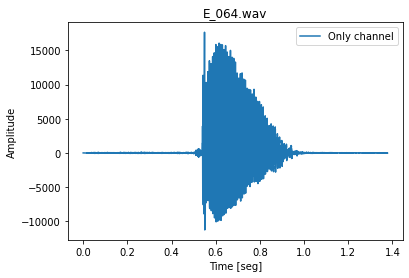

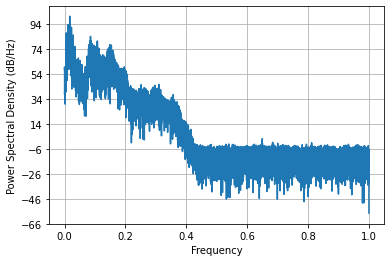

Duración:  1.3778333333333332
number of frames = 55576
number of channels = 1


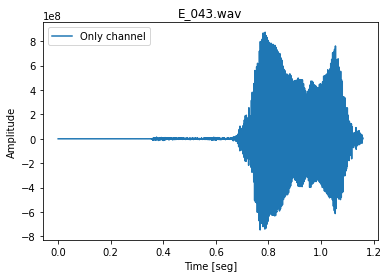

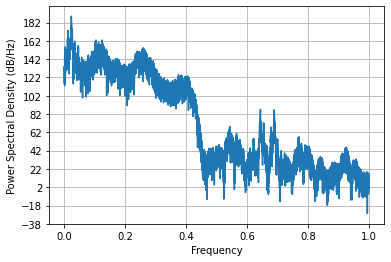

Duración:  1.1578333333333333
number of frames = 62088
number of channels = 1


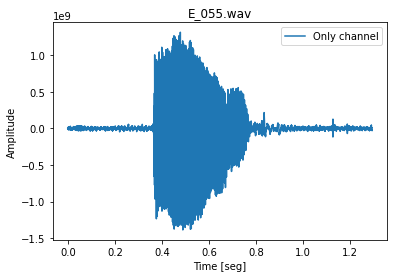

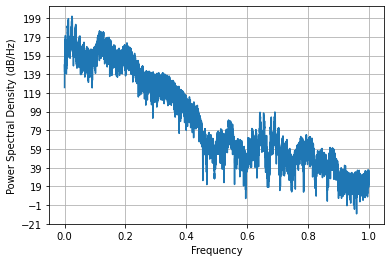

Duración:  1.2935
number of frames = 48856
number of channels = 1


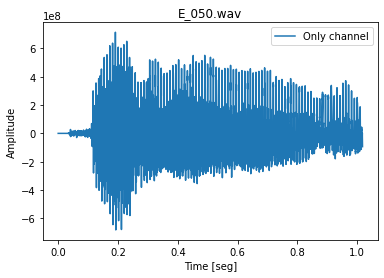

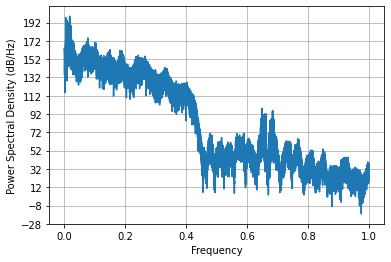

Duración:  1.0178333333333334
number of frames = 70728
number of channels = 1


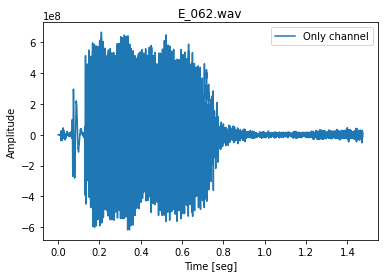

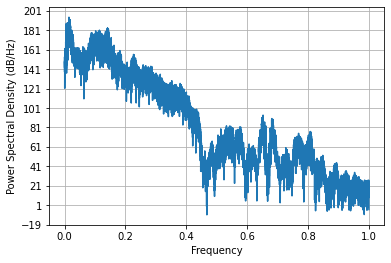

Duración:  1.4735
number of frames = 157336
number of channels = 1


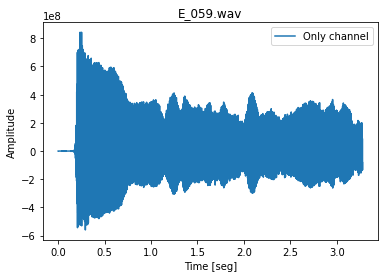

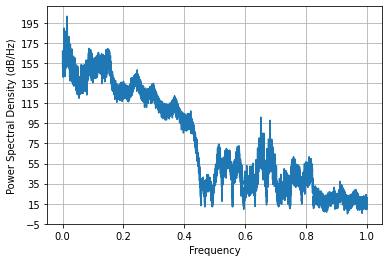

Duración:  3.277833333333333
number of frames = 62296
number of channels = 1


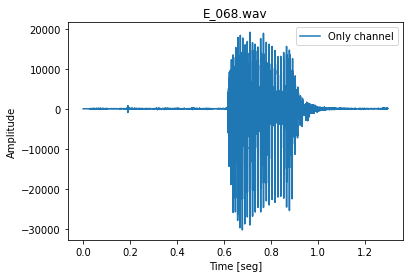

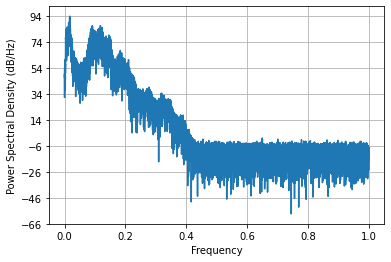

Duración:  1.2978333333333334
number of frames = 73816
number of channels = 1


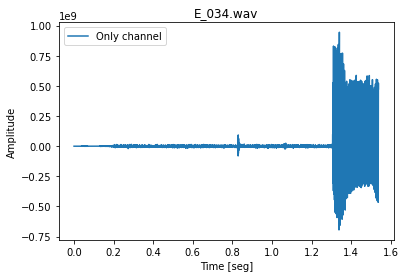

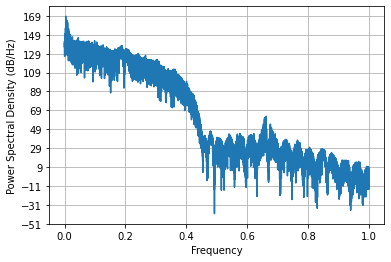

Duración:  1.5378333333333334
number of frames = 67096
number of channels = 1


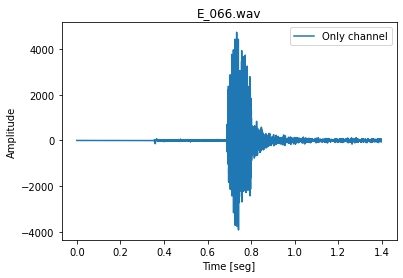

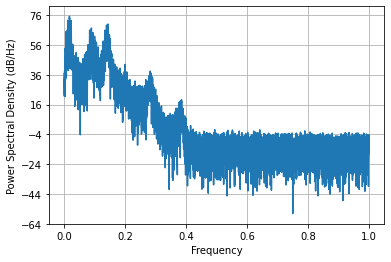

Duración:  1.3978333333333333
number of frames = 84168
number of channels = 1


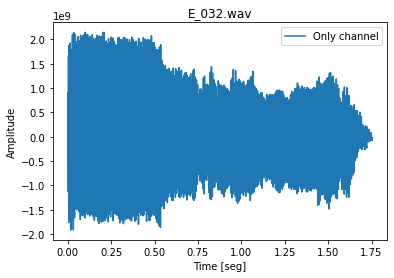

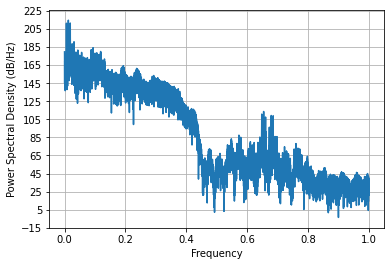

Duración:  1.7535
number of frames = 86296
number of channels = 1


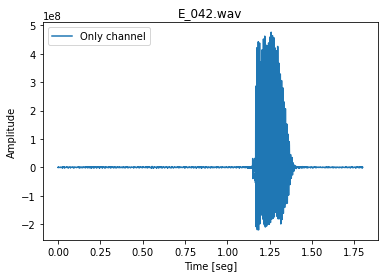

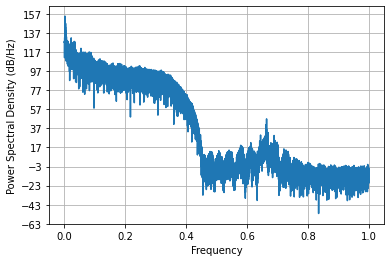

Duración:  1.7978333333333334
number of frames = 123528
number of channels = 1


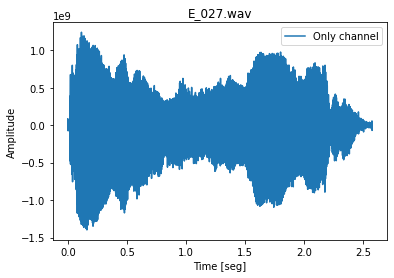

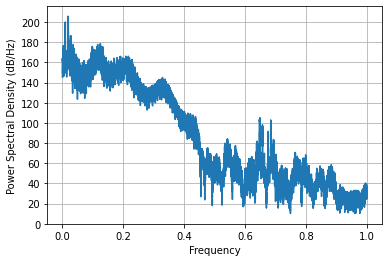

Duración:  2.5735
number of frames = 60376
number of channels = 1


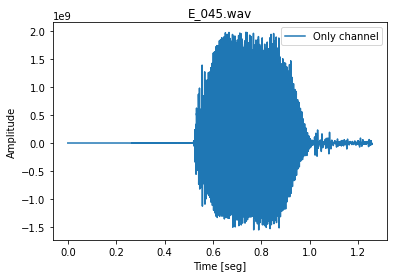

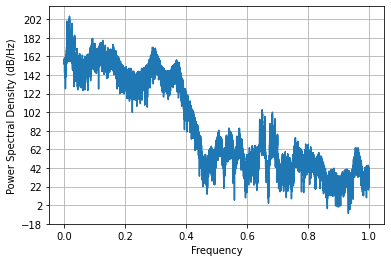

Duración:  1.2578333333333334
number of frames = 113176
number of channels = 1


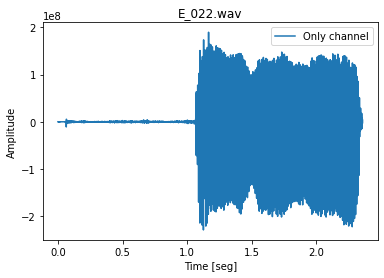

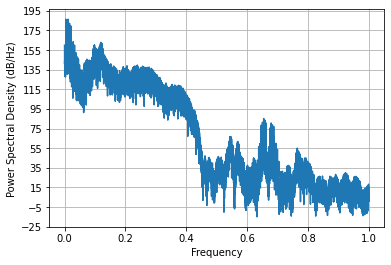

Duración:  2.3578333333333332
number of frames = 271680
number of channels = 1


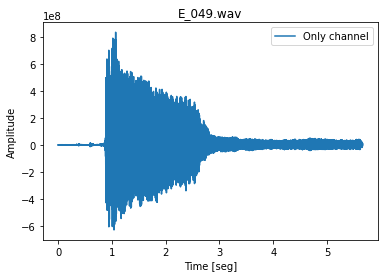

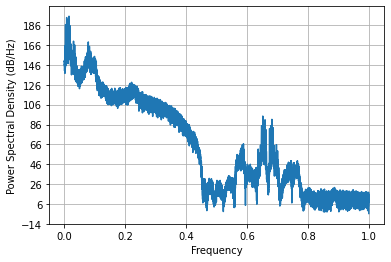

Duración:  5.66
number of frames = 61336
number of channels = 1


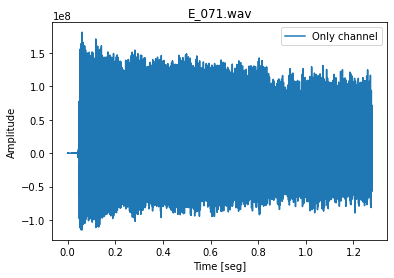

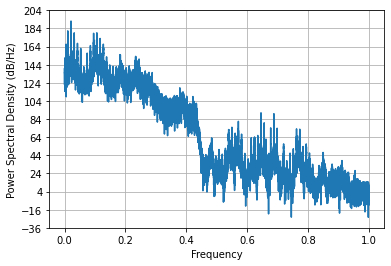

Duración:  1.2778333333333334
number of frames = 54616
number of channels = 1


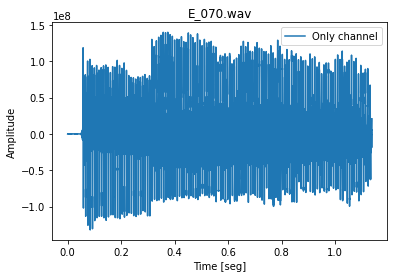

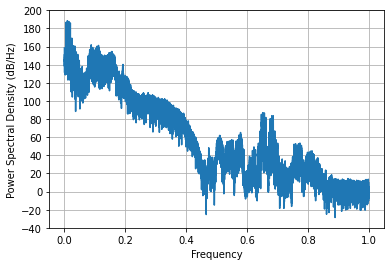

Duración:  1.1378333333333333
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not underst

In [22]:
for e in E_records:
    visualize_wav_info(path_E, e)

Visualizamos la información para las muestras de la clase **I**.

number of frames = 96856
number of channels = 1


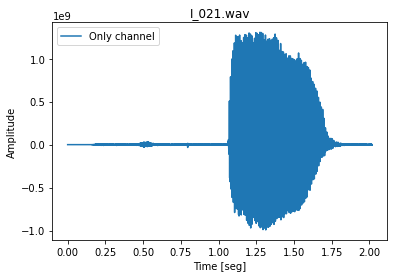

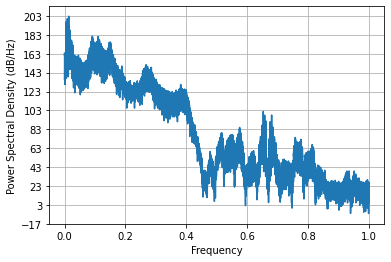

Duración:  2.0178333333333334
number of frames = 126408
number of channels = 1


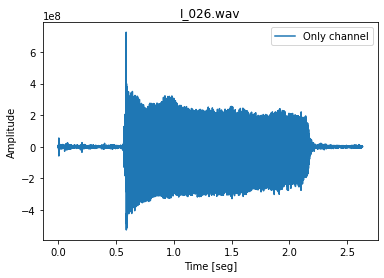

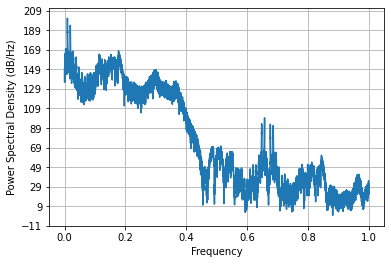

Duración:  2.6335
number of frames = 49816
number of channels = 1


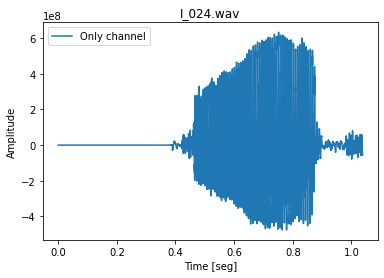

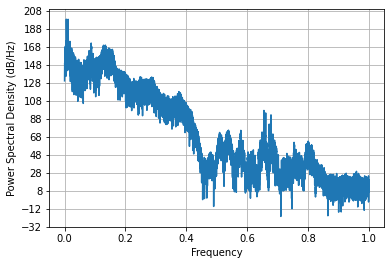

Duración:  1.0378333333333334
number of frames = 56536
number of channels = 2


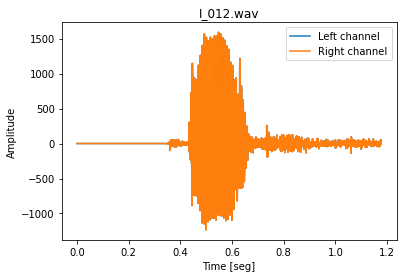

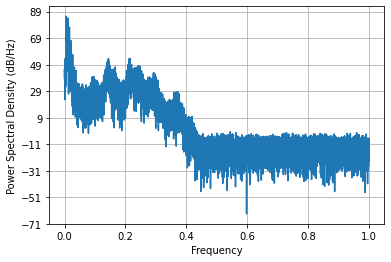

Duración:  1.1778333333333333
number of frames = 80536
number of channels = 1


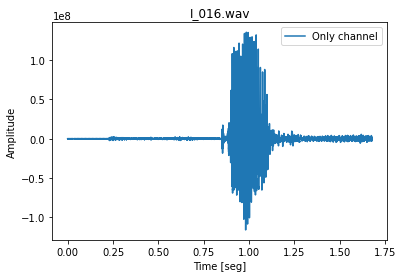

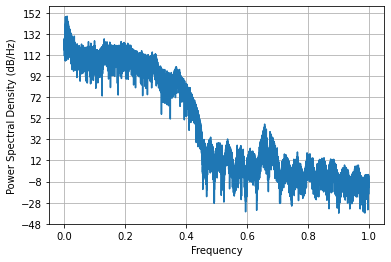

Duración:  1.6778333333333333
number of frames = 106456
number of channels = 1


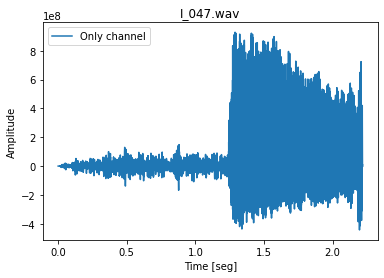

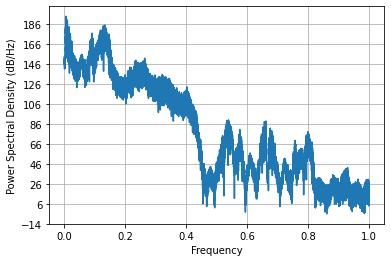

Duración:  2.2178333333333335
number of frames = 133128
number of channels = 1


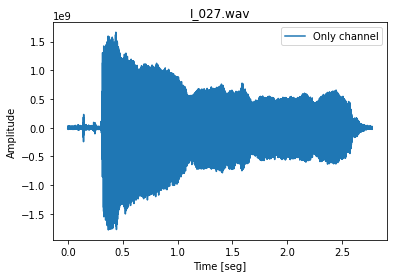

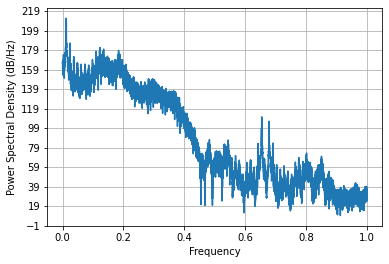

Duración:  2.7735
number of frames = 74776
number of channels = 1


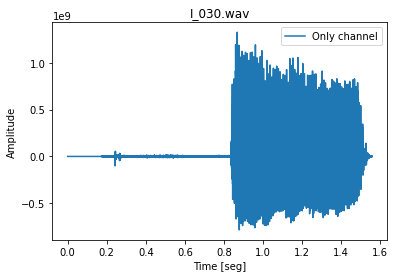

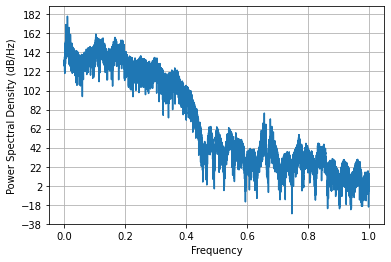

Duración:  1.5578333333333334
number of frames = 62296
number of channels = 1


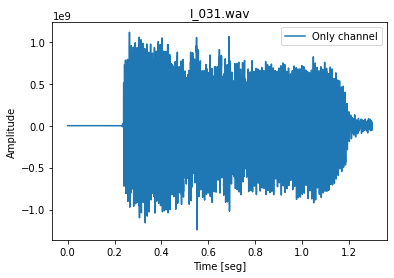

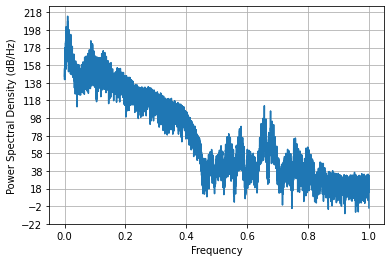

Duración:  1.2978333333333334
number of frames = 75736
number of channels = 1


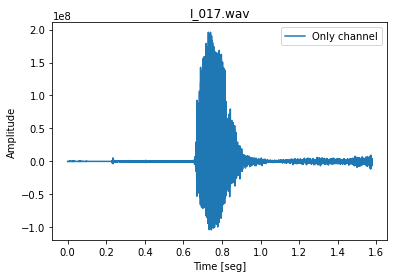

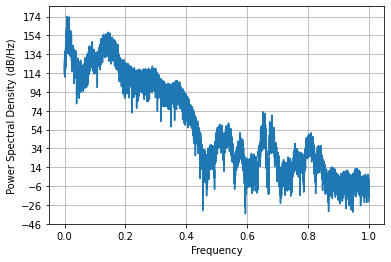

Duración:  1.5778333333333334
number of frames = 70936
number of channels = 2


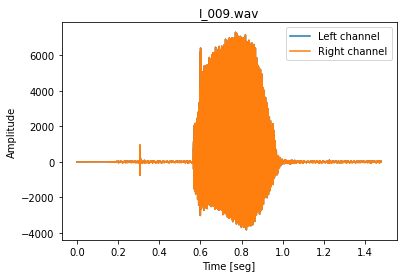

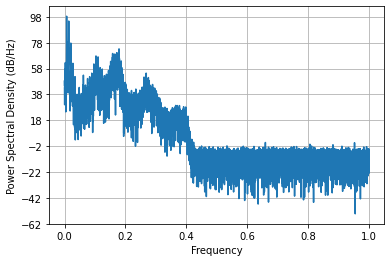

Duración:  1.4778333333333333
number of frames = 93976
number of channels = 1


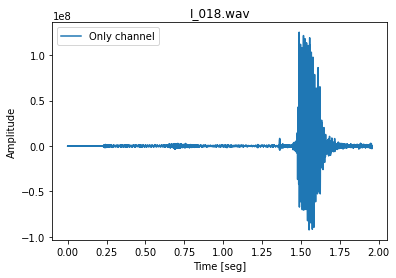

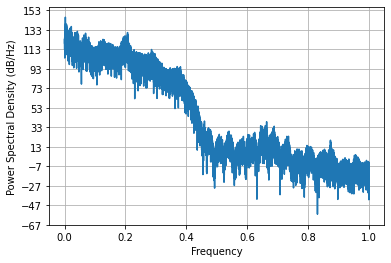

Duración:  1.9578333333333333
number of frames = 148696
number of channels = 1


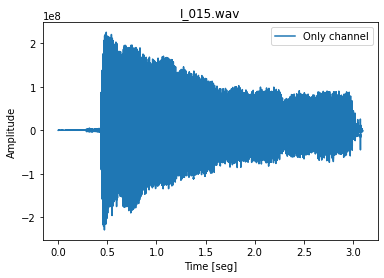

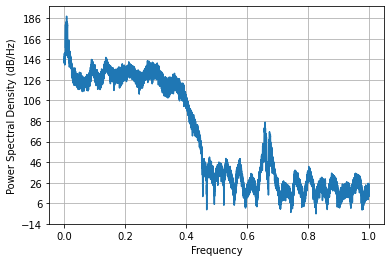

Duración:  3.0978333333333334
number of frames = 83416
number of channels = 1


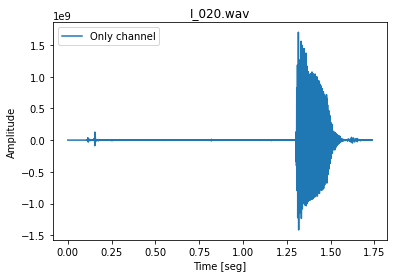

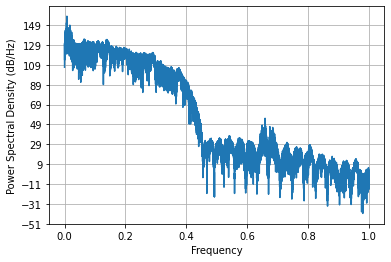

Duración:  1.7378333333333333
number of frames = 88221
number of channels = 1


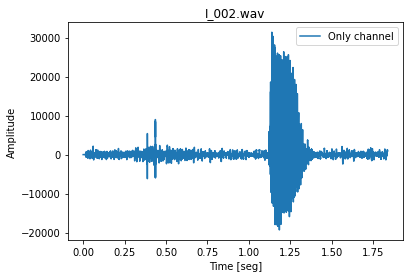

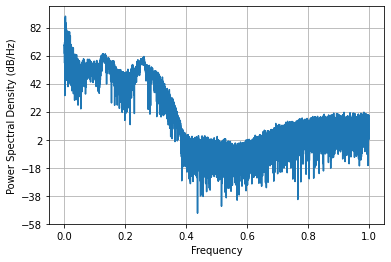

Duración:  1.8379375
number of frames = 85128
number of channels = 1


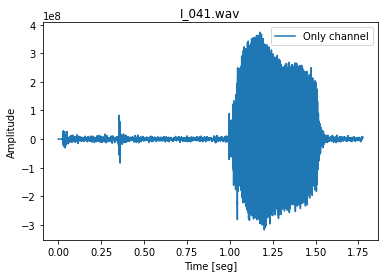

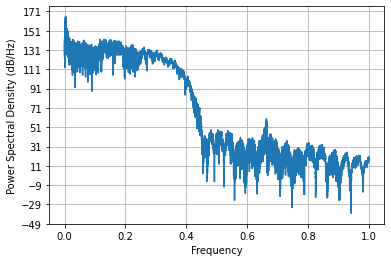

Duración:  1.7735
number of frames = 112216
number of channels = 1


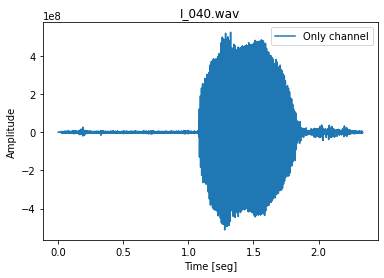

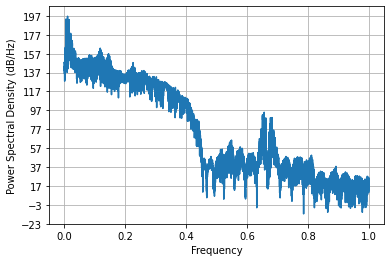

Duración:  2.337833333333333
number of frames = 48856
number of channels = 1


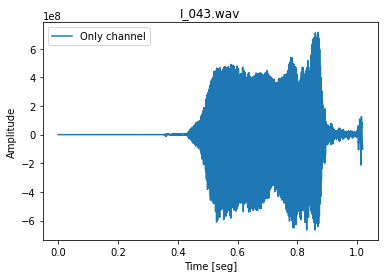

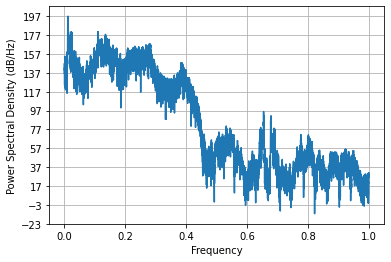

Duración:  1.0178333333333334
number of frames = 69976
number of channels = 1


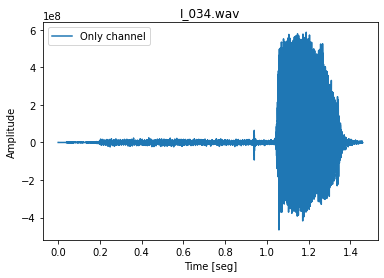

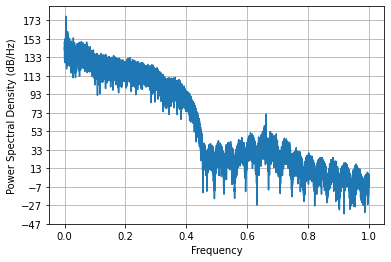

Duración:  1.4578333333333333
number of frames = 66136
number of channels = 1


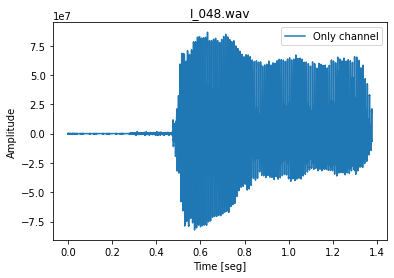

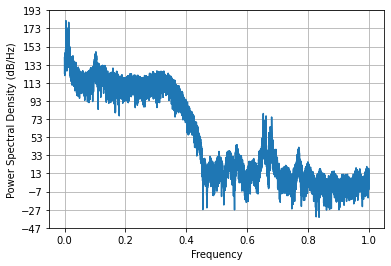

Duración:  1.3778333333333332
number of frames = 50776
number of channels = 2


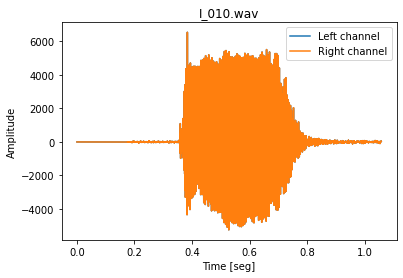

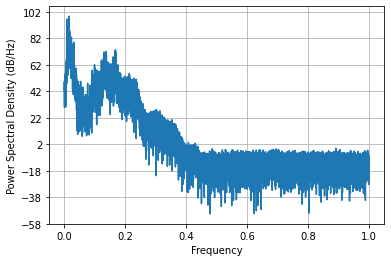

Duración:  1.0578333333333334
number of frames = 170776
number of channels = 1


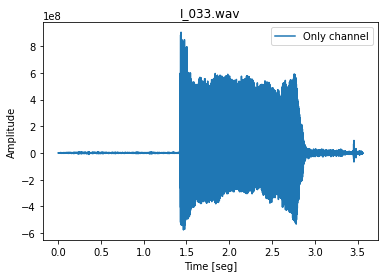

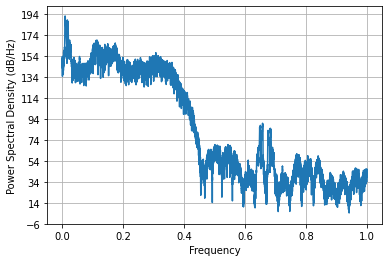

Duración:  3.5578333333333334
number of frames = 121856
number of channels = 2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


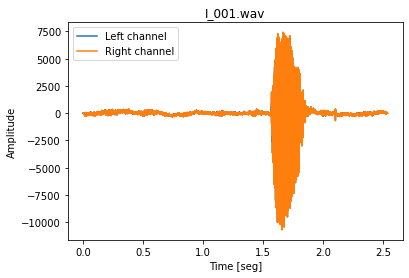

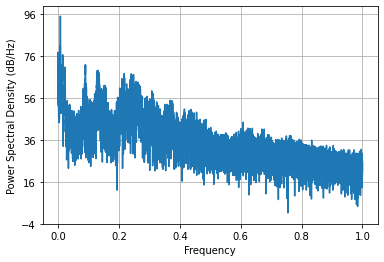

Duración:  2.538666666666667
number of frames = 93016
number of channels = 1


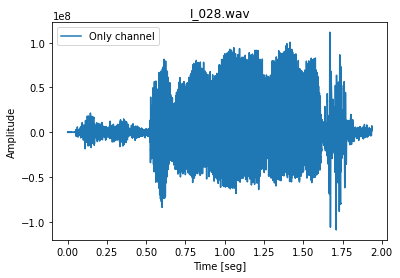

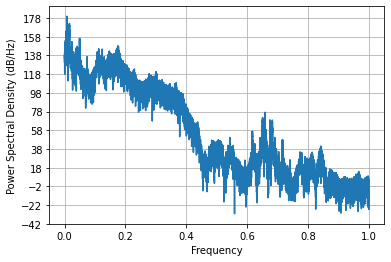

Duración:  1.9378333333333333
number of frames = 57496
number of channels = 1


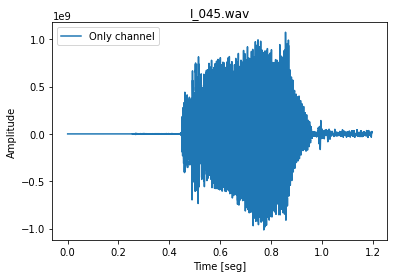

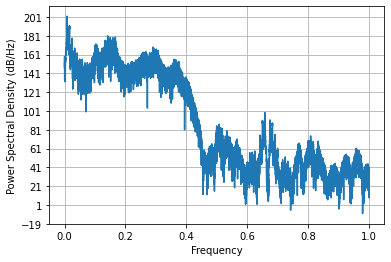

Duración:  1.1978333333333333
number of frames = 90888
number of channels = 1


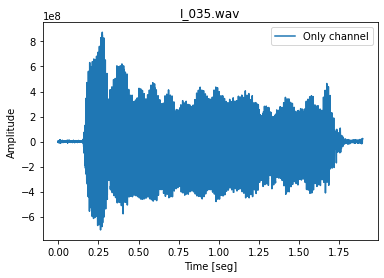

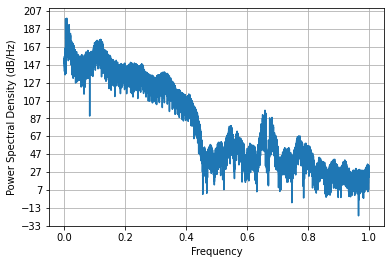

Duración:  1.8935
number of frames = 132376
number of channels = 2


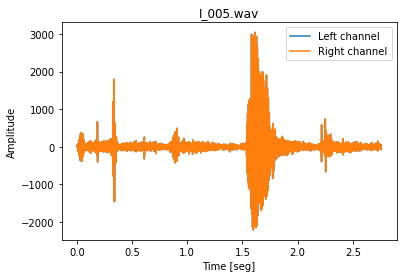

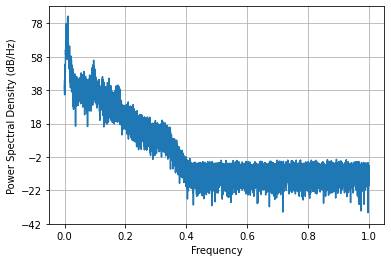

Duración:  2.757833333333333
number of frames = 49816
number of channels = 1


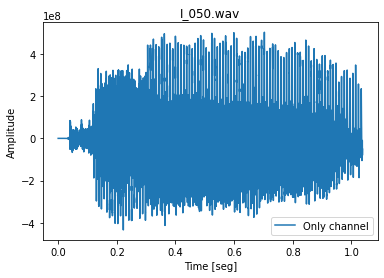

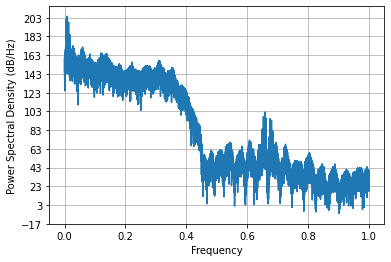

Duración:  1.0378333333333334
number of frames = 71896
number of channels = 1


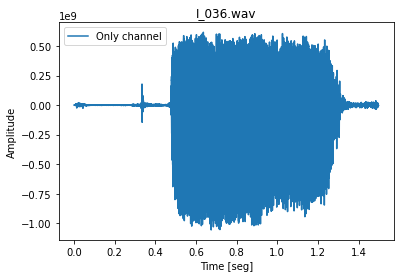

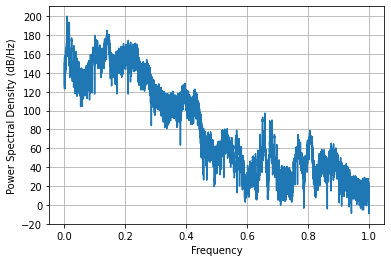

Duración:  1.4978333333333333
number of frames = 64216
number of channels = 1


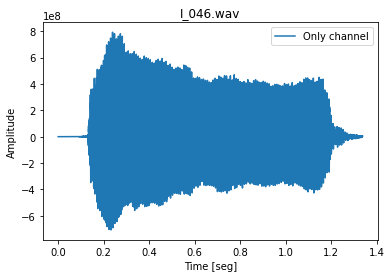

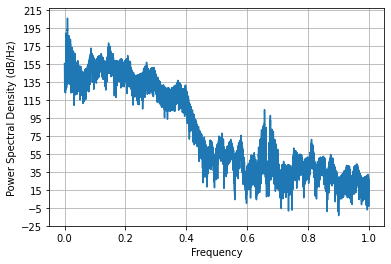

Duración:  1.3378333333333334
number of frames = 90136
number of channels = 1


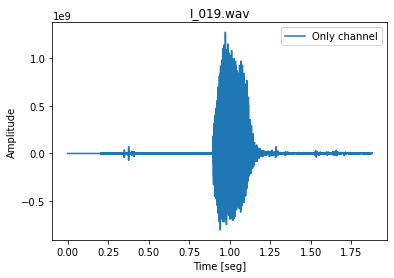

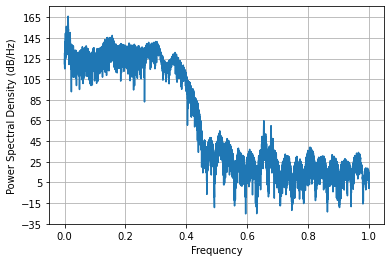

Duración:  1.8778333333333332
number of frames = 90280
number of channels = 2


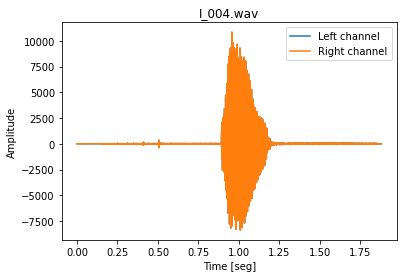

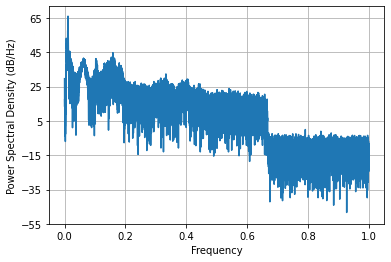

Duración:  1.8808333333333334
number of frames = 116056
number of channels = 1


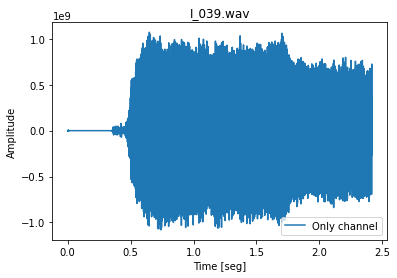

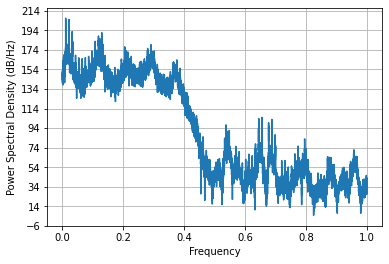

Duración:  2.4178333333333333
number of frames = 85336
number of channels = 2


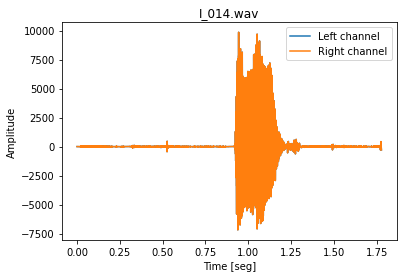

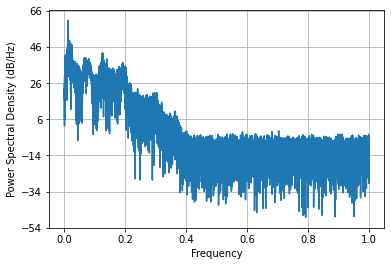

Duración:  1.7778333333333334
number of frames = 43096
number of channels = 1


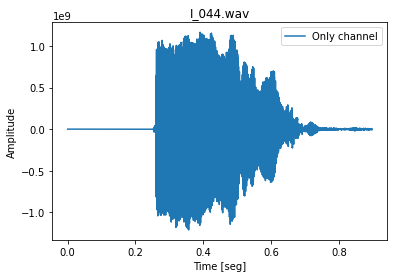

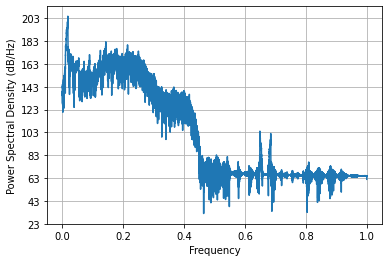

Duración:  0.8978333333333334
number of frames = 50776
number of channels = 1


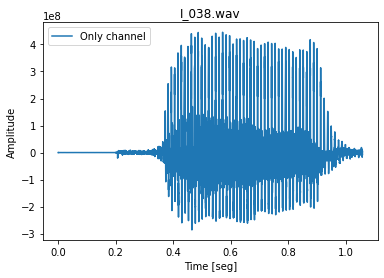

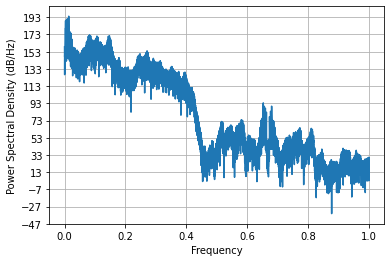

Duración:  1.0578333333333334
number of frames = 69016
number of channels = 2


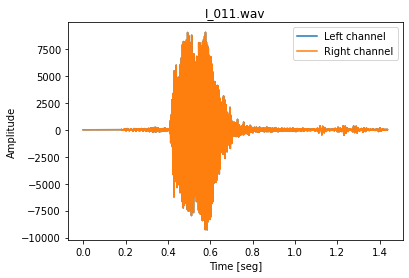

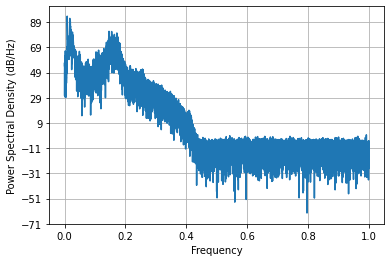

Duración:  1.4378333333333333
number of frames = 96648
number of channels = 1


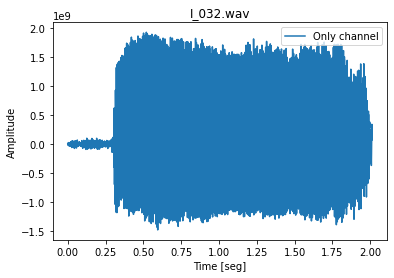

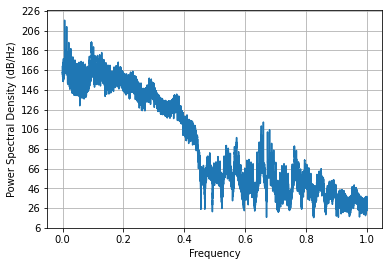

Duración:  2.0135
number of frames = 86296
number of channels = 2


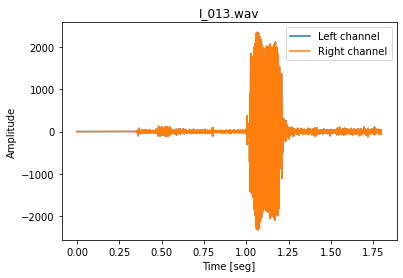

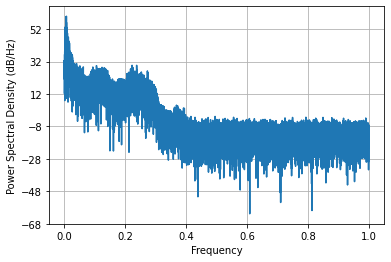

Duración:  1.7978333333333334
number of frames = 97816
number of channels = 1


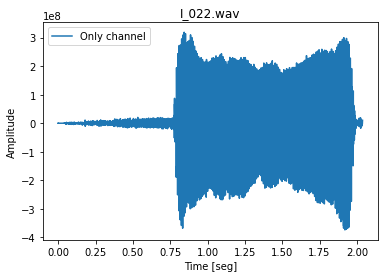

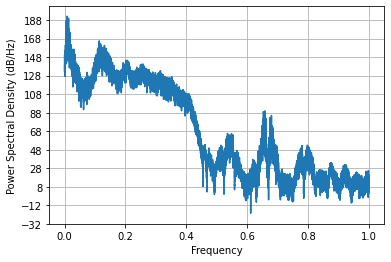

Duración:  2.0378333333333334
number of frames = 83416
number of channels = 1


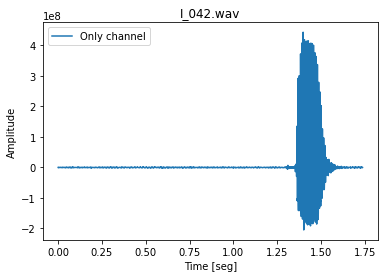

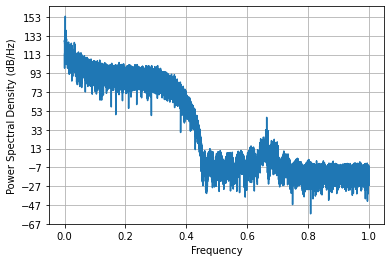

Duración:  1.7378333333333333
number of frames = 54616
number of channels = 2


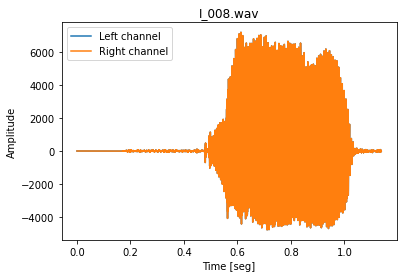

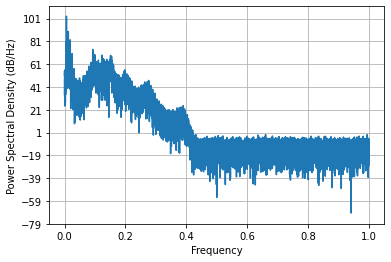

Duración:  1.1378333333333333
number of frames = 162136
number of channels = 1


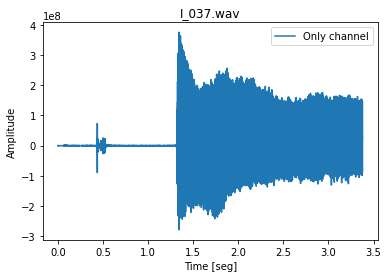

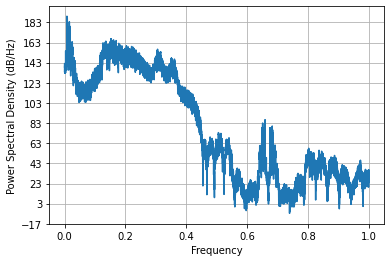

Duración:  3.3778333333333332
number of frames = 88968
number of channels = 1


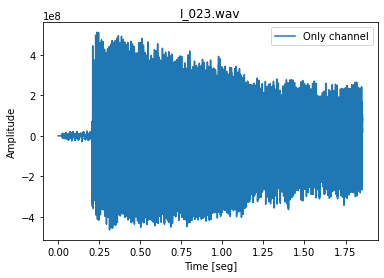

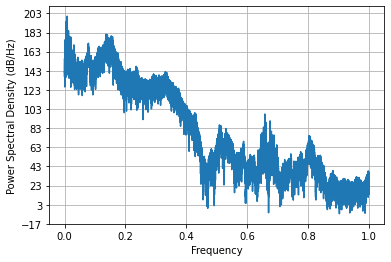

Duración:  1.8535
number of frames = 103654
number of channels = 2


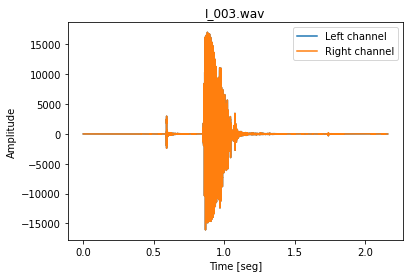

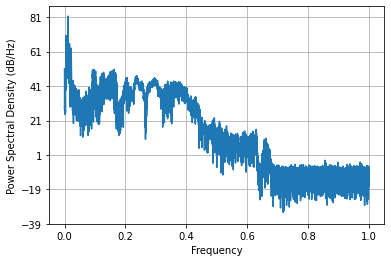

Duración:  2.1594583333333333
number of frames = 63048
number of channels = 1


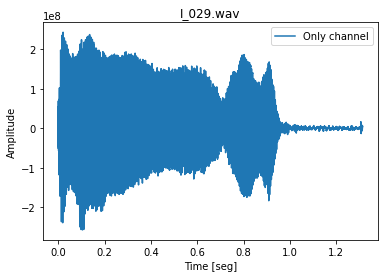

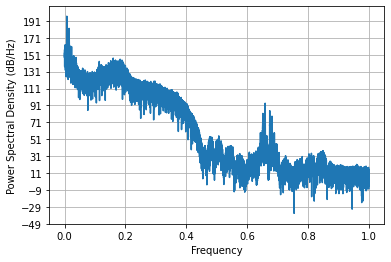

Duración:  1.3135
number of frames = 74676
number of channels = 2


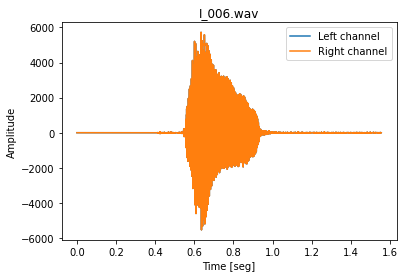

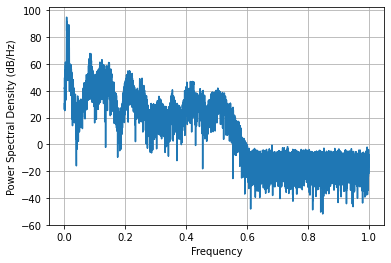

Duración:  1.55575
number of frames = 83416
number of channels = 1


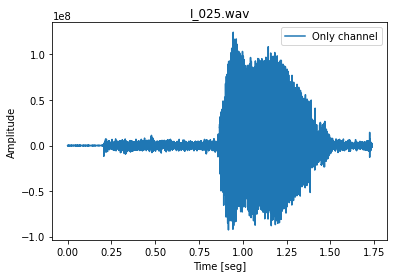

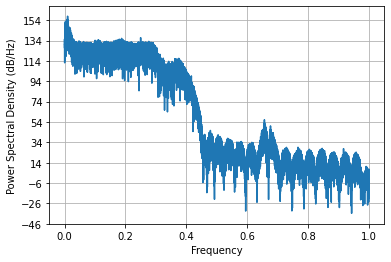

Duración:  1.7378333333333333
number of frames = 92509
number of channels = 2


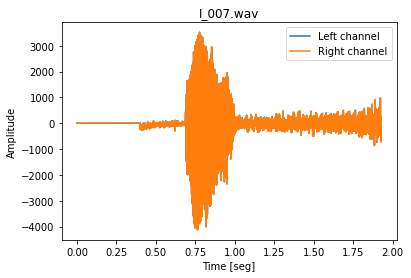

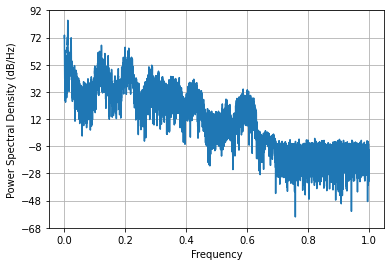

Duración:  1.9272708333333333
number of frames = 113176
number of channels = 1


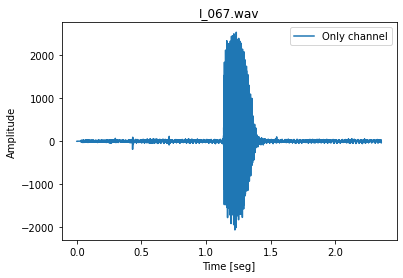

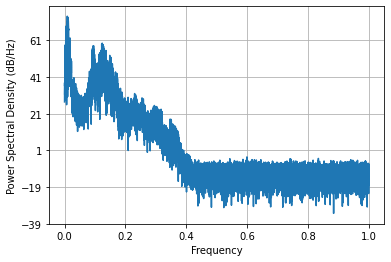

Duración:  2.3578333333333332
number of frames = 66888
number of channels = 1


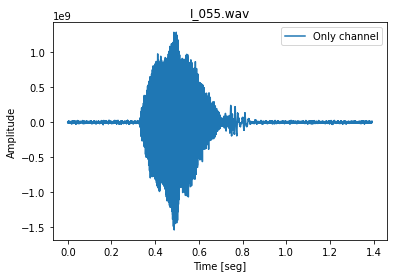

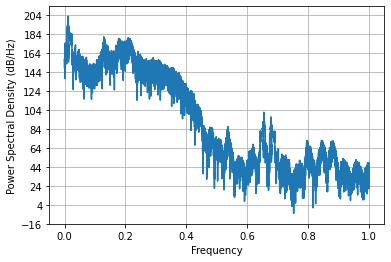

Duración:  1.3935
number of frames = 93768
number of channels = 1


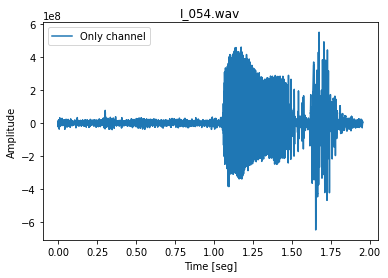

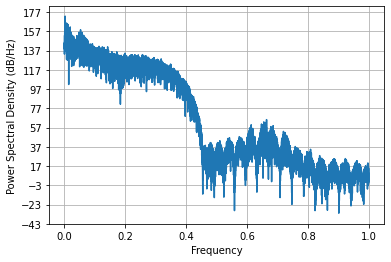

Duración:  1.9535
number of frames = 97816
number of channels = 1


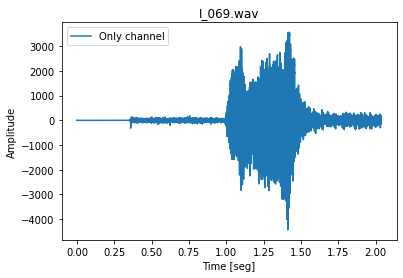

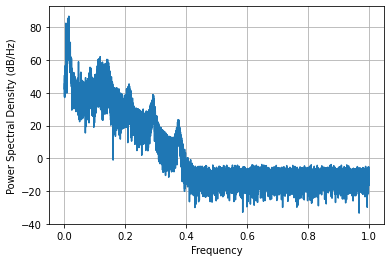

Duración:  2.0378333333333334
number of frames = 147736
number of channels = 1


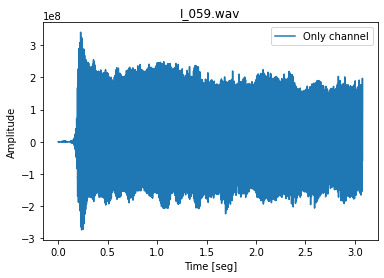

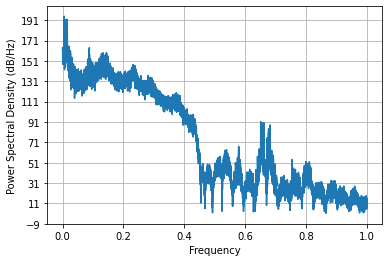

Duración:  3.0778333333333334
number of frames = 57496
number of channels = 1


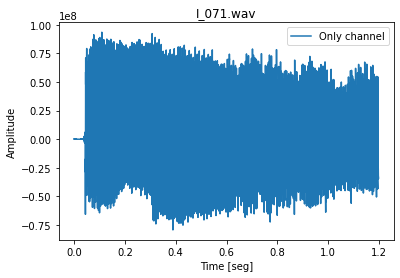

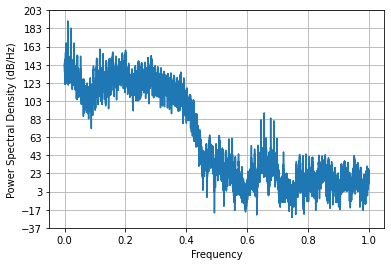

Duración:  1.1978333333333333
number of frames = 65726
number of channels = 1


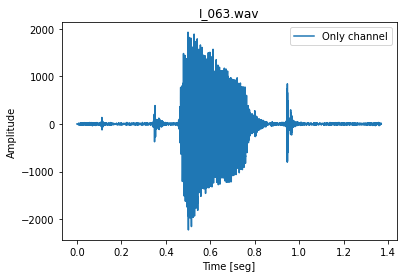

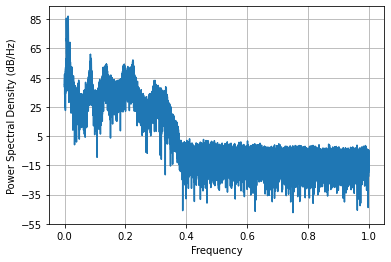

Duración:  1.3692916666666666
number of frames = 113176
number of channels = 1


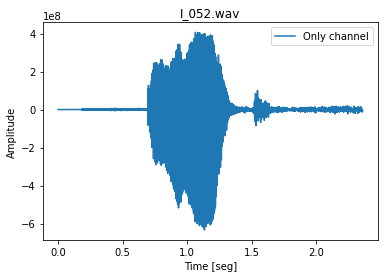

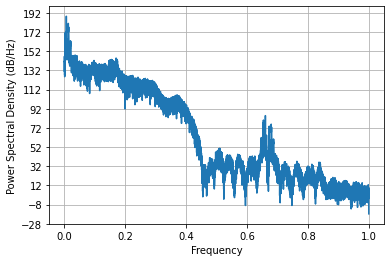

Duración:  2.3578333333333332
number of frames = 71896
number of channels = 1


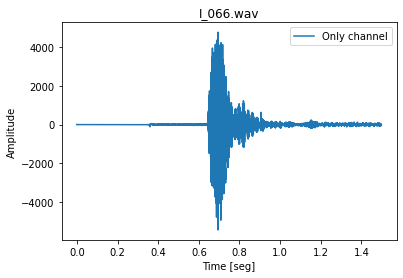

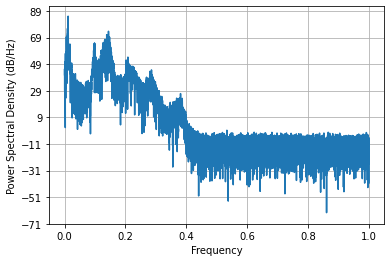

Duración:  1.4978333333333333
number of frames = 64008
number of channels = 1


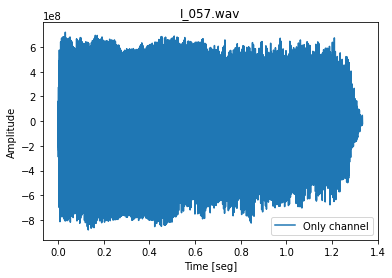

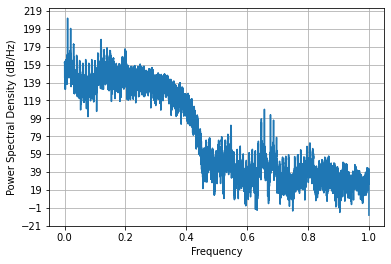

Duración:  1.3335
number of frames = 80328
number of channels = 1


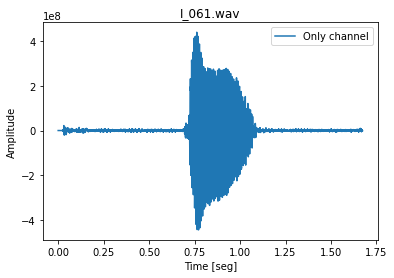

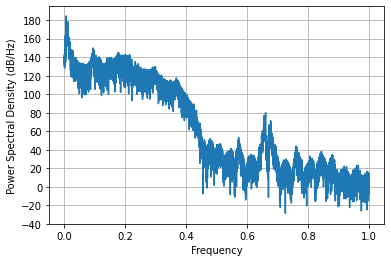

Duración:  1.6735
number of frames = 53656
number of channels = 1


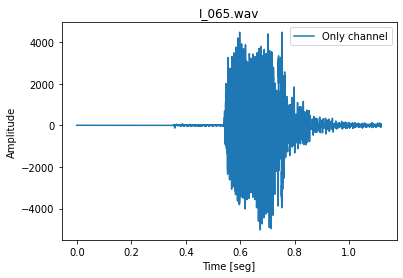

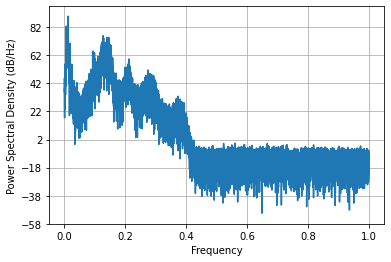

Duración:  1.1178333333333332
number of frames = 94936
number of channels = 1


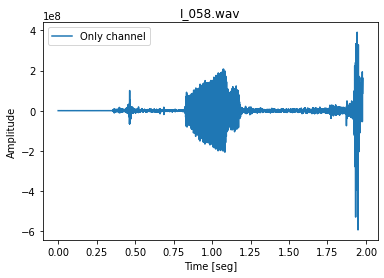

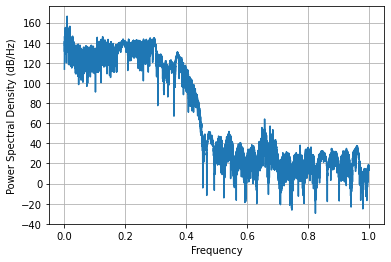

Duración:  1.9778333333333333
number of frames = 54408
number of channels = 1


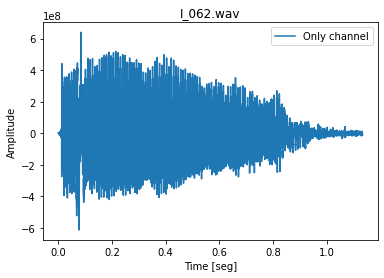

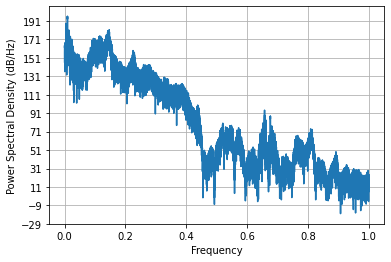

Duración:  1.1335
number of frames = 64008
number of channels = 1


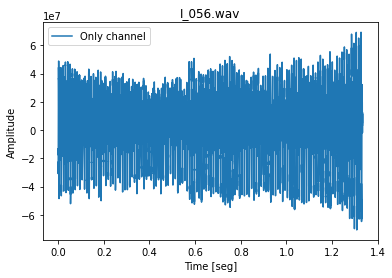

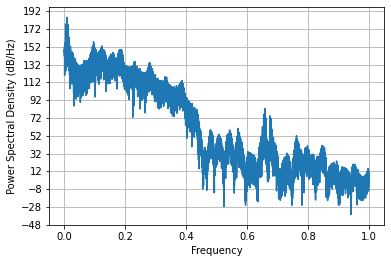

Duración:  1.3335
number of frames = 70936
number of channels = 1


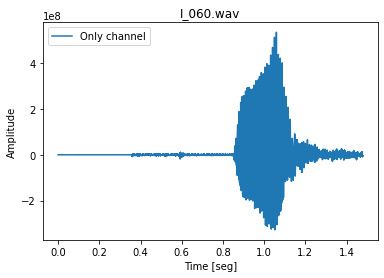

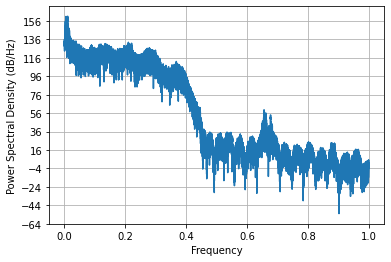

Duración:  1.4778333333333333
number of frames = 65176
number of channels = 1


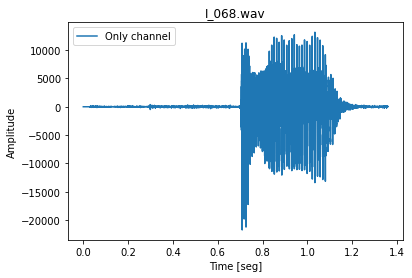

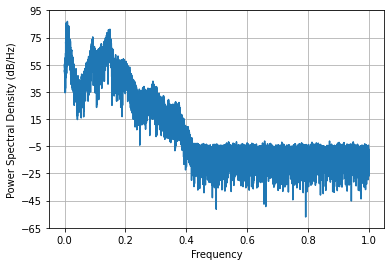

Duración:  1.3578333333333332
number of frames = 85128
number of channels = 1


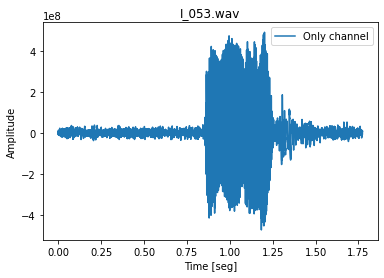

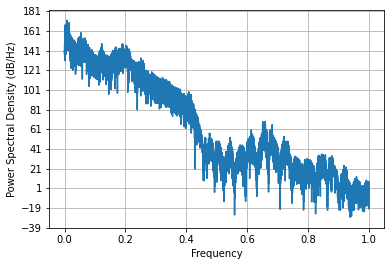

Duración:  1.7735
number of frames = 62296
number of channels = 1


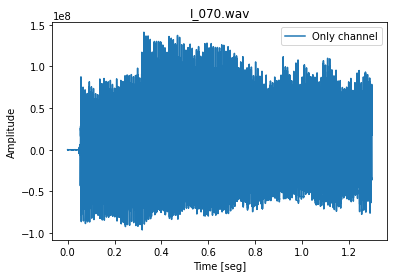

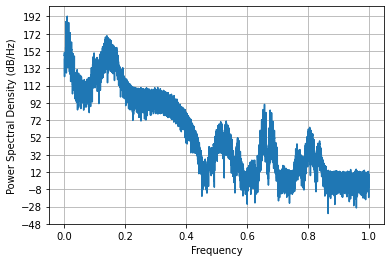

Duración:  1.2978333333333334
number of frames = 152328
number of channels = 1


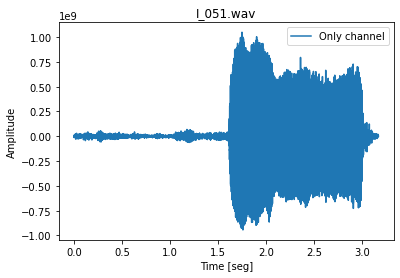

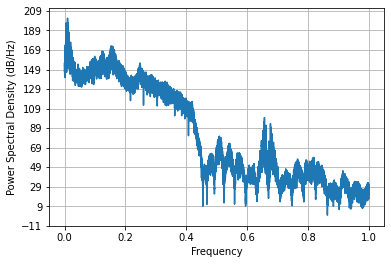

Duración:  3.1735
number of frames = 69976
number of channels = 1


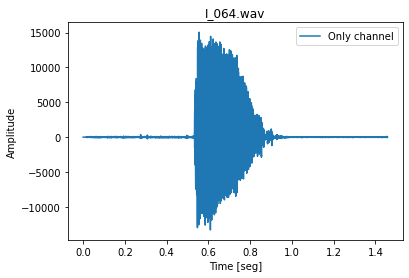

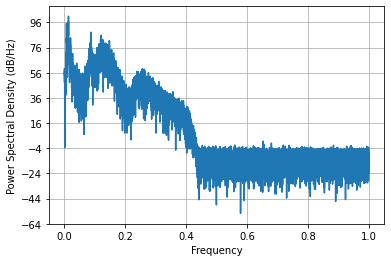

Duración:  1.4578333333333333
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not underst

In [23]:
for i in I_records:
    visualize_wav_info(path_I, i)

Visualizamos la información para las muestras de la clase **O**.

number of frames = 76696
number of channels = 1


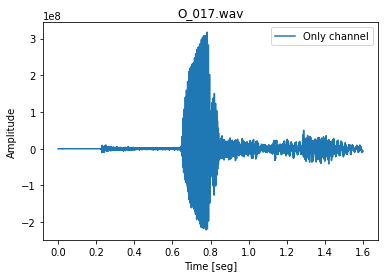

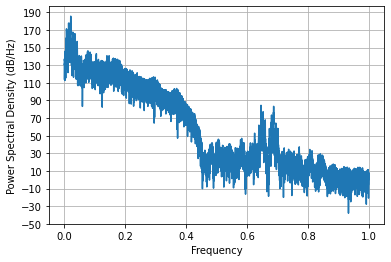

Duración:  1.5978333333333334
number of frames = 55728
number of channels = 2


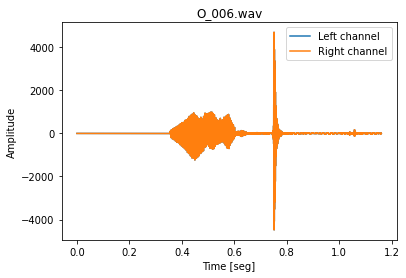

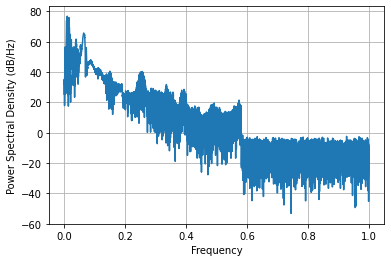

Duración:  1.161
number of frames = 99736
number of channels = 1


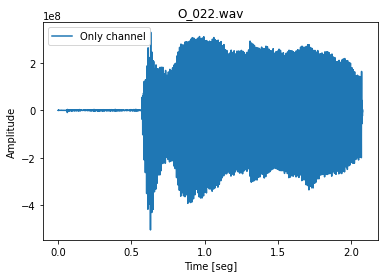

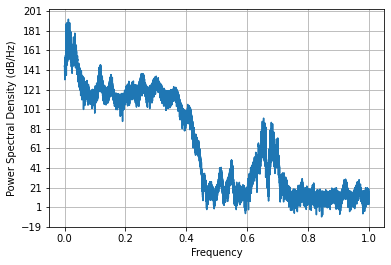

Duración:  2.0778333333333334
number of frames = 59416
number of channels = 2


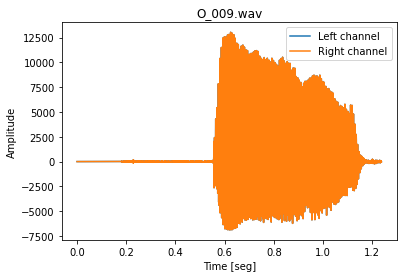

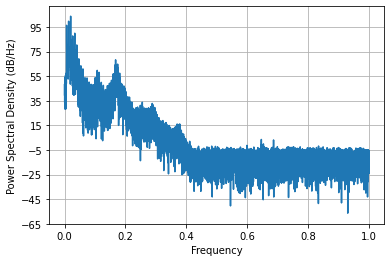

Duración:  1.2378333333333333
number of frames = 83416
number of channels = 1


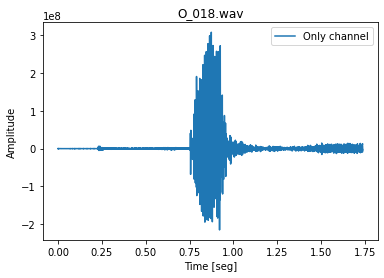

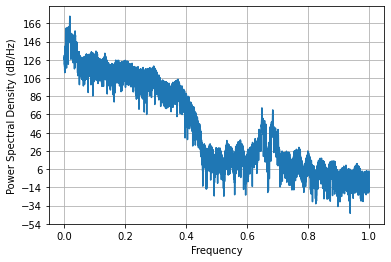

Duración:  1.7378333333333333
number of frames = 70941
number of channels = 1


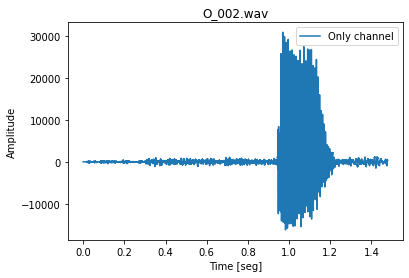

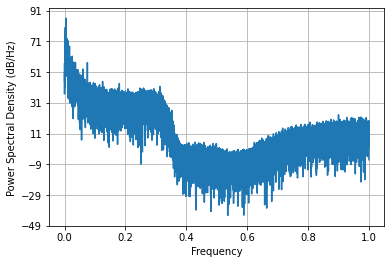

Duración:  1.4779375
number of frames = 90888
number of channels = 1


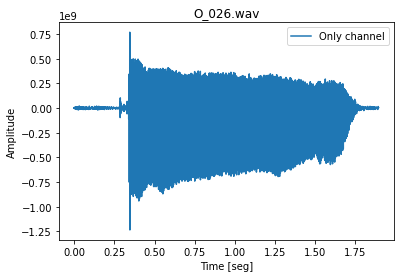

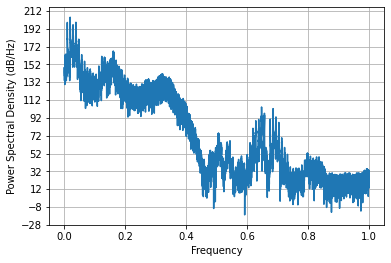

Duración:  1.8935
number of frames = 74568
number of channels = 1


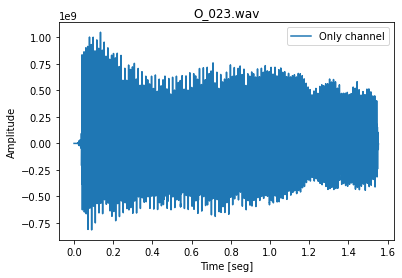

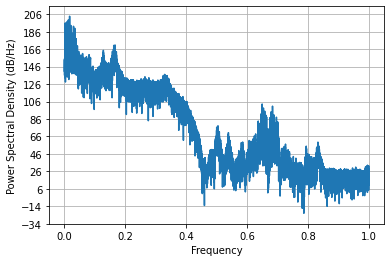

Duración:  1.5535
number of frames = 79134
number of channels = 2


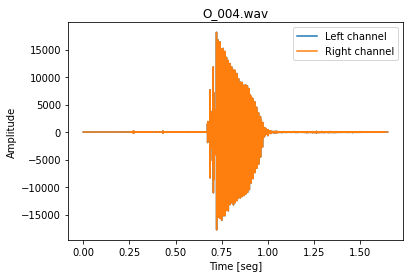

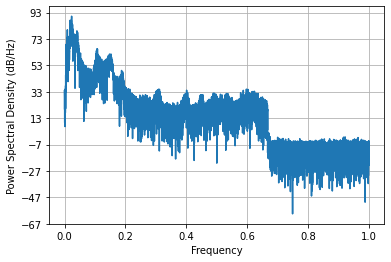

Duración:  1.648625
number of frames = 115712
number of channels = 2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


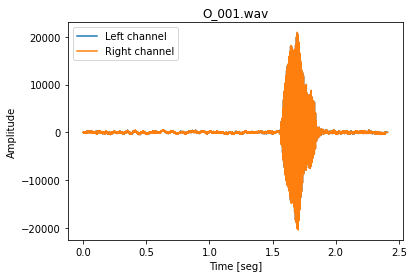

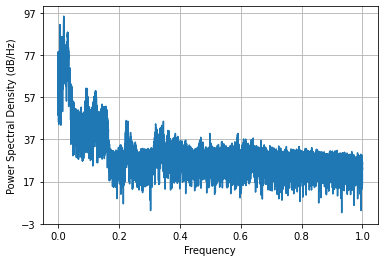

Duración:  2.4106666666666667
number of frames = 86296
number of channels = 2


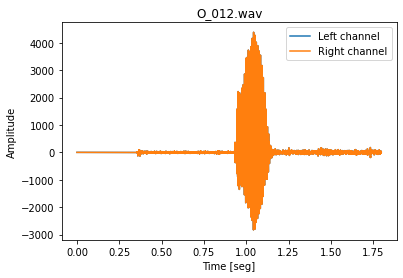

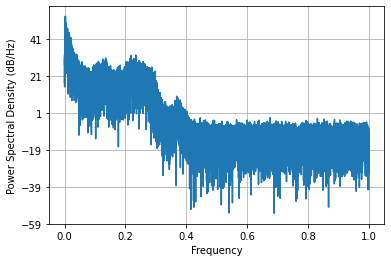

Duración:  1.7978333333333334
number of frames = 133128
number of channels = 1


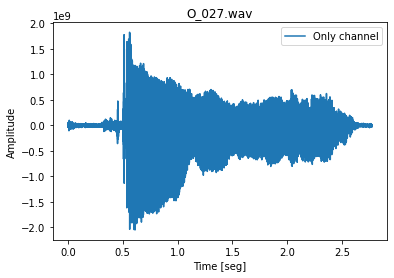

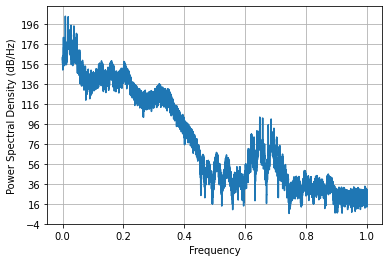

Duración:  2.7735
number of frames = 85336
number of channels = 1


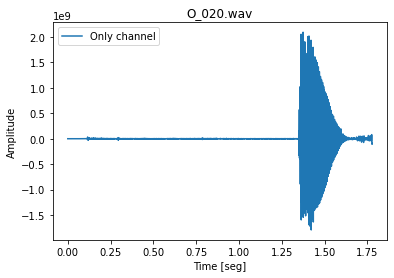

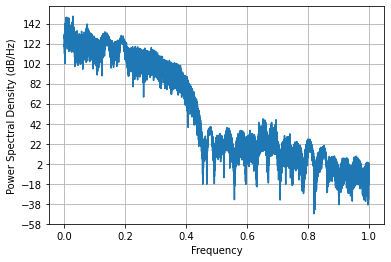

Duración:  1.7778333333333334
number of frames = 49816
number of channels = 2


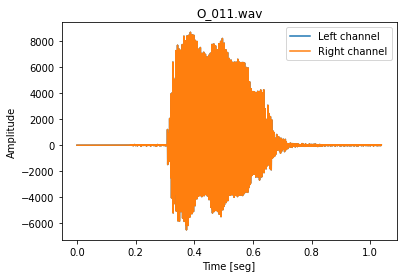

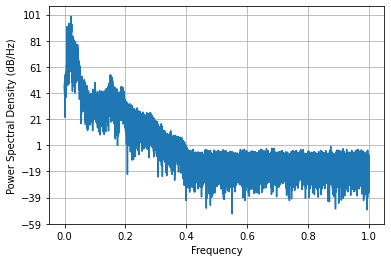

Duración:  1.0378333333333334
number of frames = 96856
number of channels = 1


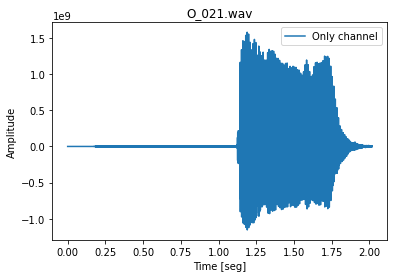

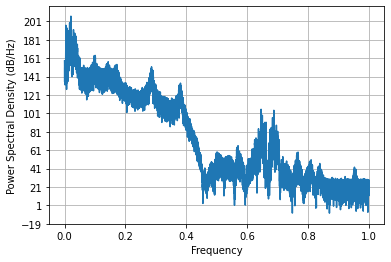

Duración:  2.0178333333333334
number of frames = 151576
number of channels = 1


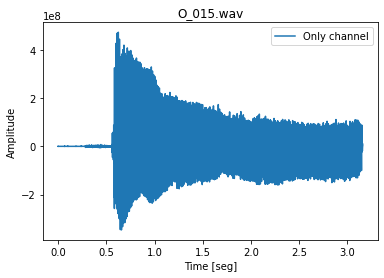

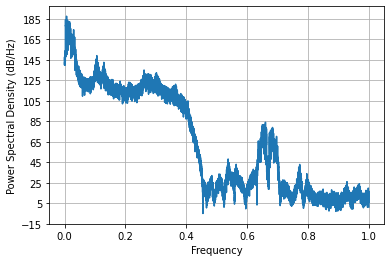

Duración:  3.1578333333333335
number of frames = 56536
number of channels = 2


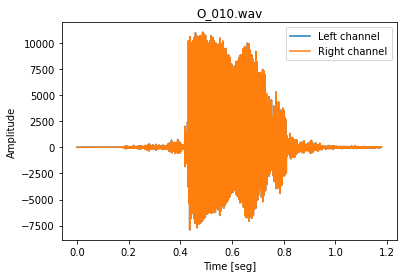

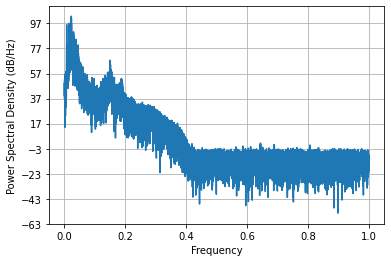

Duración:  1.1778333333333333
number of frames = 108113
number of channels = 2


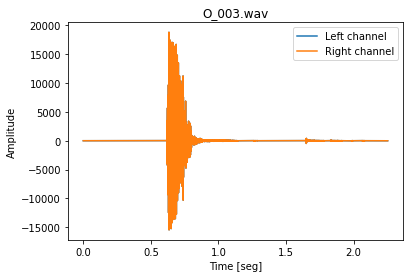

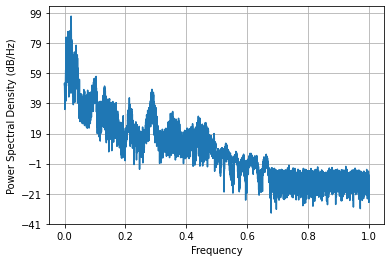

Duración:  2.2523541666666667
number of frames = 124696
number of channels = 2


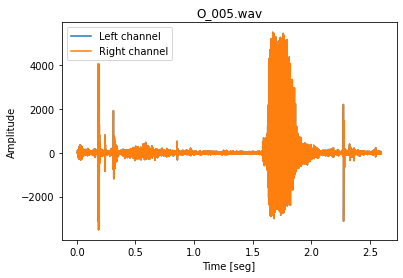

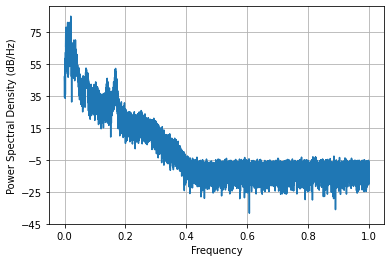

Duración:  2.5978333333333334
number of frames = 93016
number of channels = 1


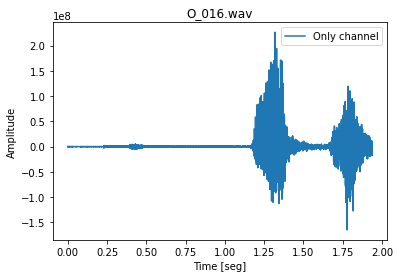

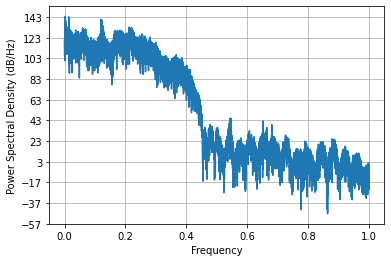

Duración:  1.9378333333333333
number of frames = 105883
number of channels = 2


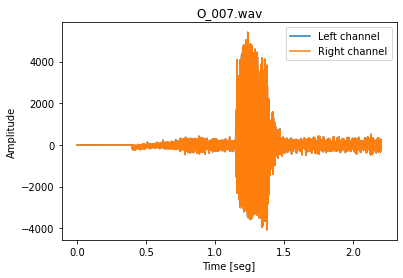

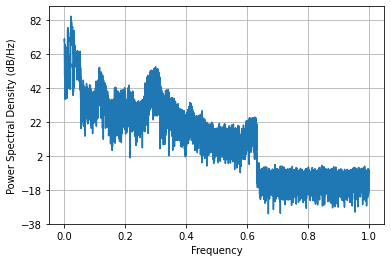

Duración:  2.2058958333333334
number of frames = 85336
number of channels = 1


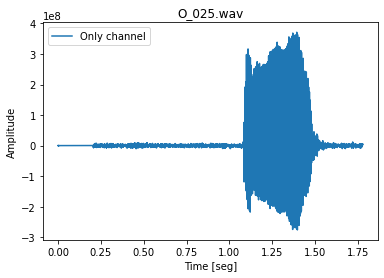

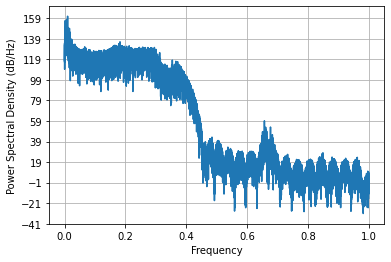

Duración:  1.7778333333333334
number of frames = 66136
number of channels = 2


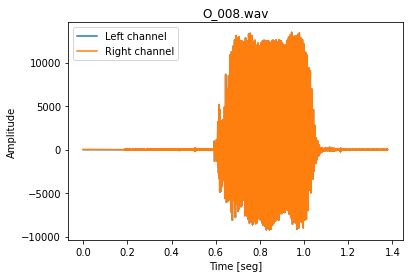

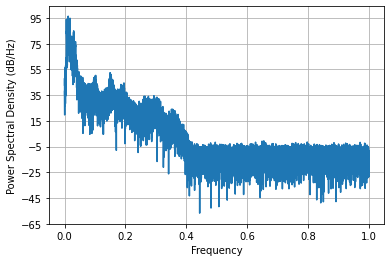

Duración:  1.3778333333333332
number of frames = 54616
number of channels = 1


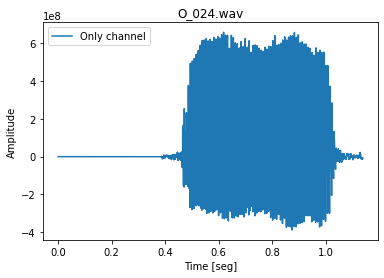

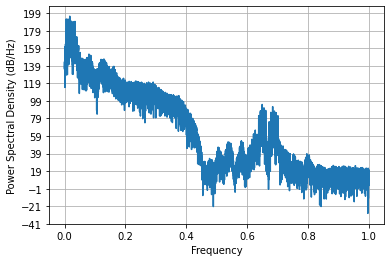

Duración:  1.1378333333333333
number of frames = 86296
number of channels = 1


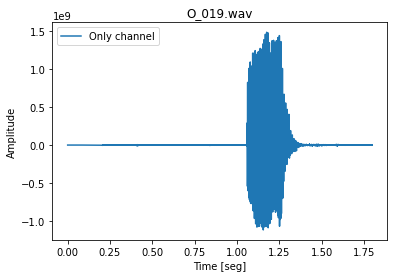

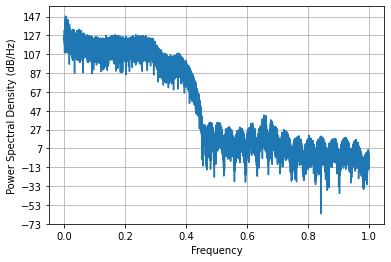

Duración:  1.7978333333333334
number of frames = 57496
number of channels = 2


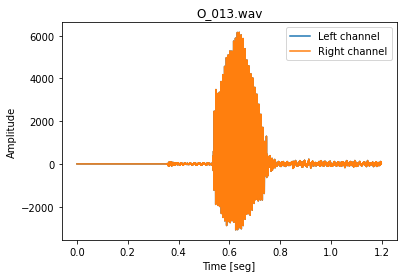

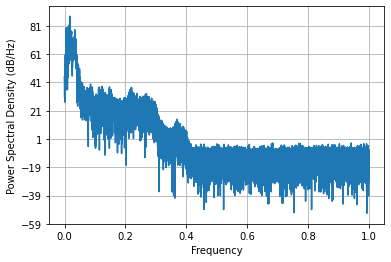

Duración:  1.1978333333333333
number of frames = 73816
number of channels = 1


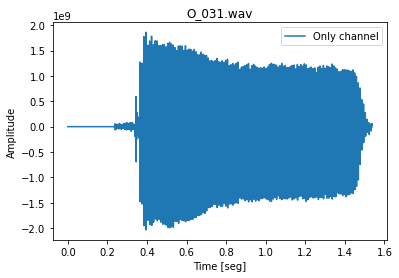

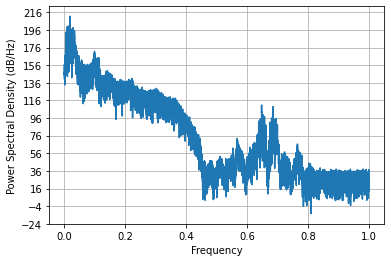

Duración:  1.5378333333333334
number of frames = 124696
number of channels = 1


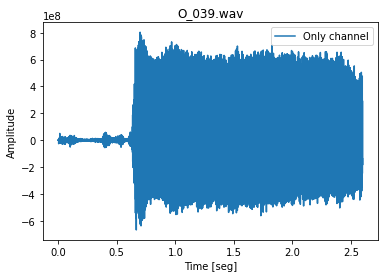

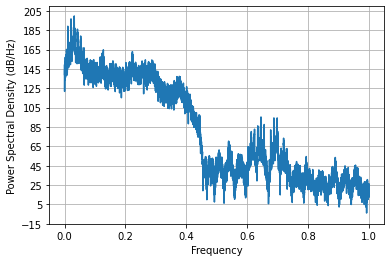

Duración:  2.5978333333333334
number of frames = 52696
number of channels = 1


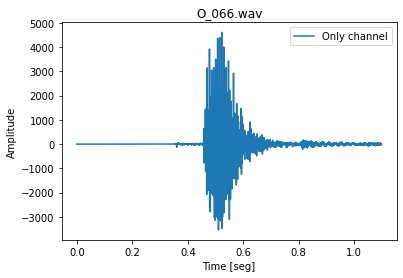

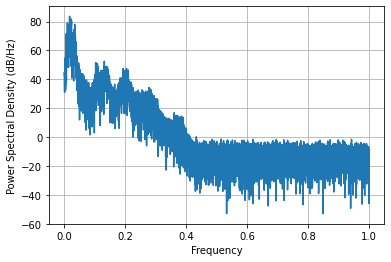

Duración:  1.0978333333333334
number of frames = 83208
number of channels = 1


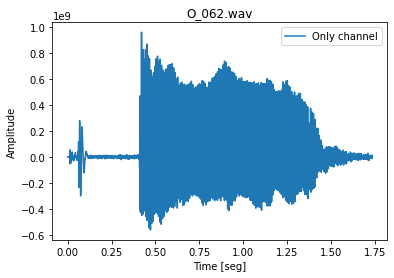

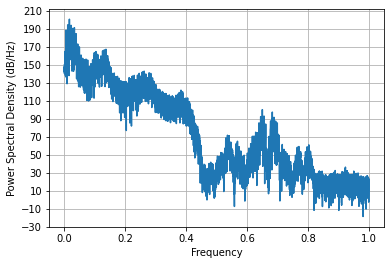

Duración:  1.7335
number of frames = 118936
number of channels = 1


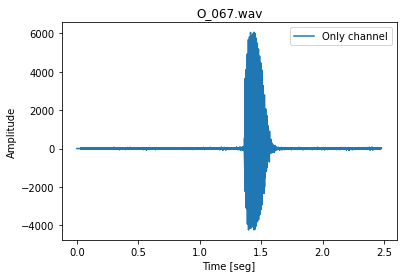

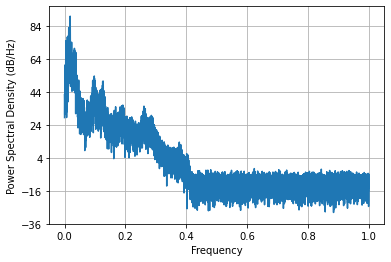

Duración:  2.4778333333333333
number of frames = 65928
number of channels = 1


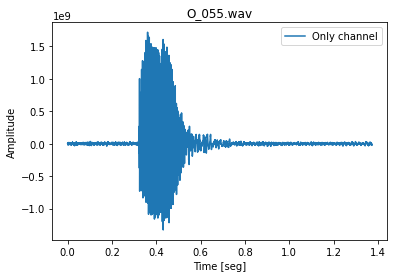

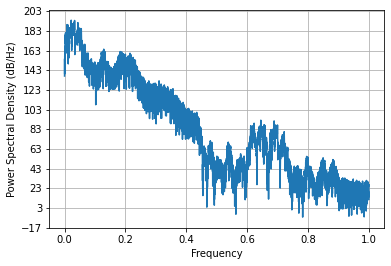

Duración:  1.3735
number of frames = 62296
number of channels = 1


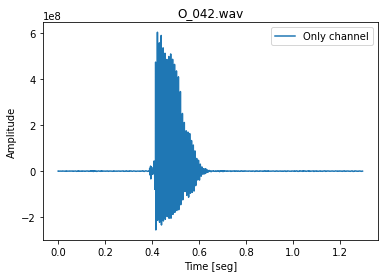

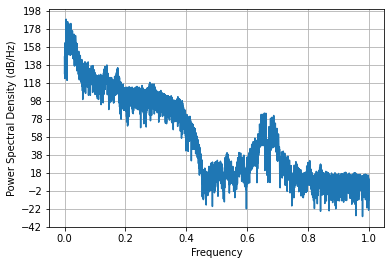

Duración:  1.2978333333333334
number of frames = 68056
number of channels = 1


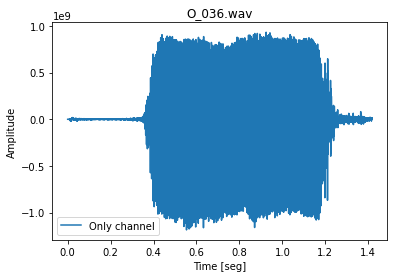

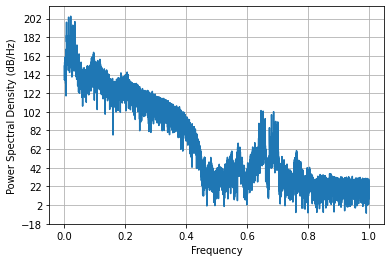

Duración:  1.4178333333333333
number of frames = 45016
number of channels = 1


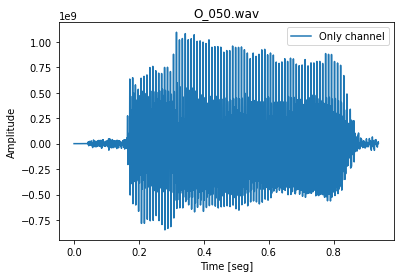

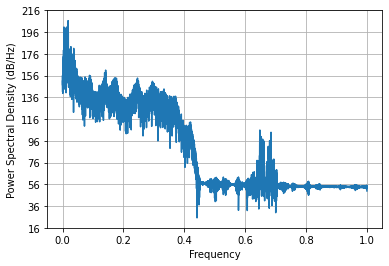

Duración:  0.9378333333333333
number of frames = 276480
number of channels = 1


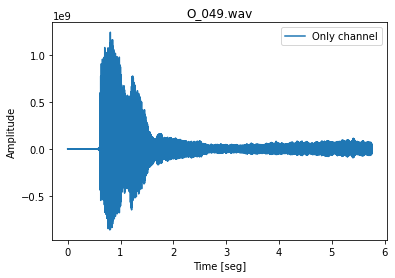

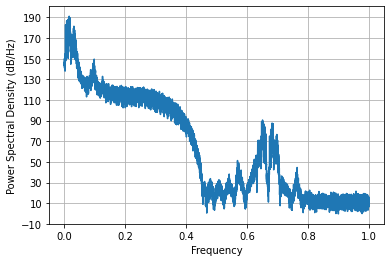

Duración:  5.76
number of frames = 64216
number of channels = 1


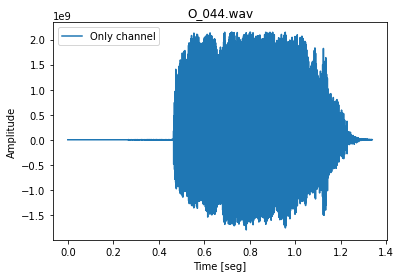

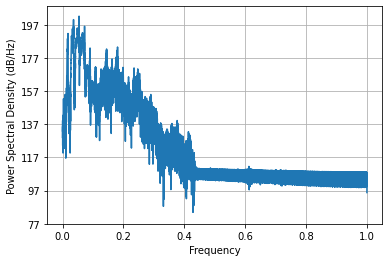

Duración:  1.3378333333333334
number of frames = 46936
number of channels = 1


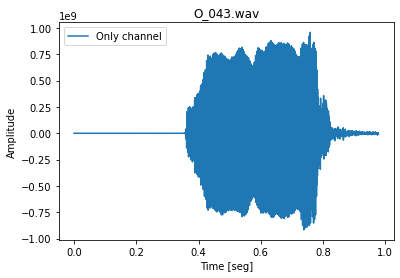

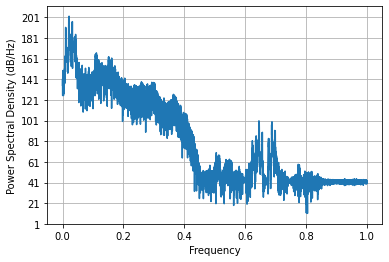

Duración:  0.9778333333333333
number of frames = 50914
number of channels = 1


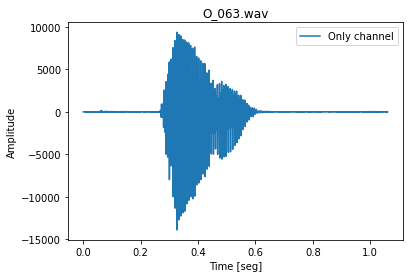

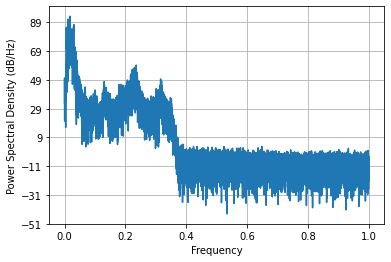

Duración:  1.0607083333333334
number of frames = 119896
number of channels = 1


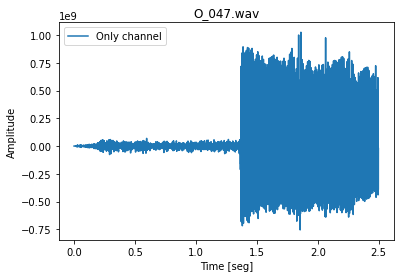

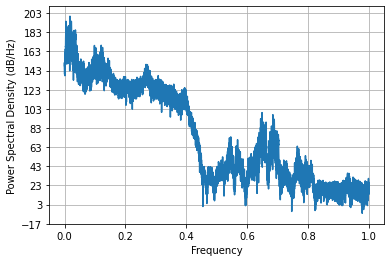

Duración:  2.4978333333333333
number of frames = 60168
number of channels = 1


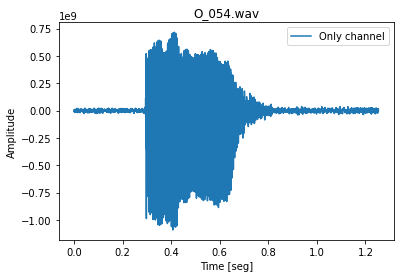

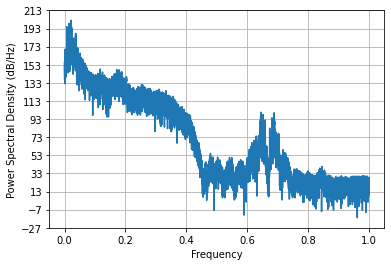

Duración:  1.2535
number of frames = 65176
number of channels = 1


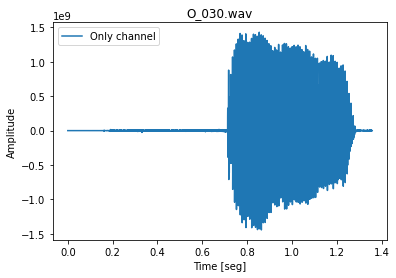

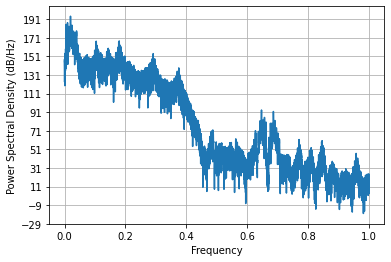

Duración:  1.3578333333333332
number of frames = 153496
number of channels = 1


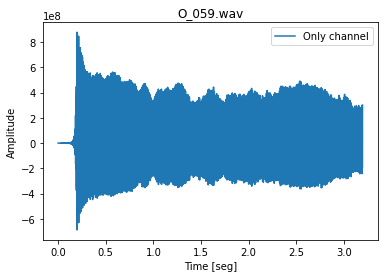

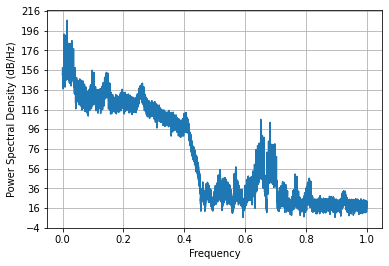

Duración:  3.1978333333333335
number of frames = 78408
number of channels = 1


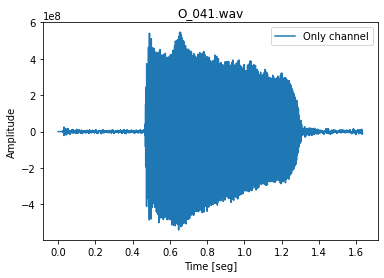

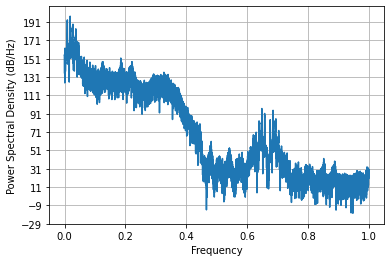

Duración:  1.6335
number of frames = 49816
number of channels = 1


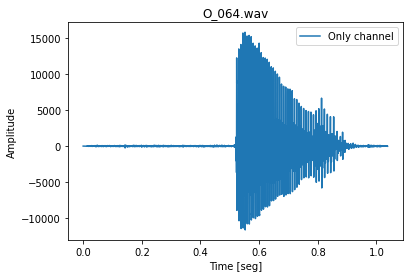

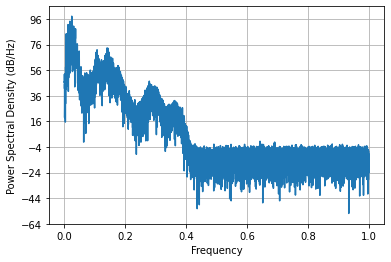

Duración:  1.0378333333333334
number of frames = 64008
number of channels = 1


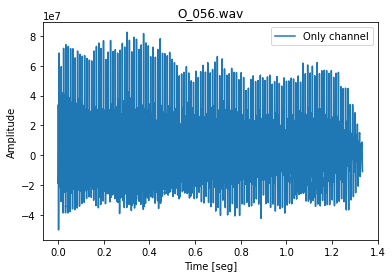

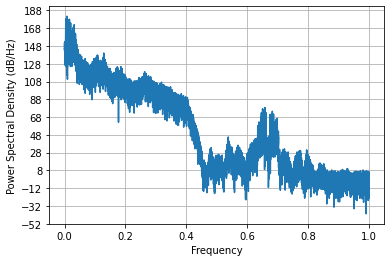

Duración:  1.3335
number of frames = 107416
number of channels = 1


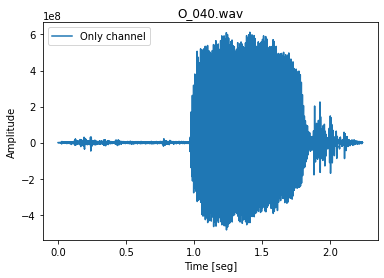

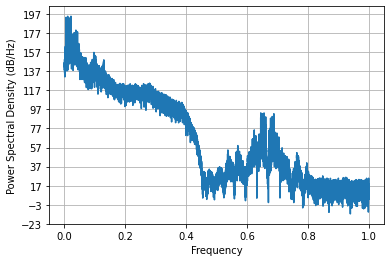

Duración:  2.237833333333333
number of frames = 71688
number of channels = 1


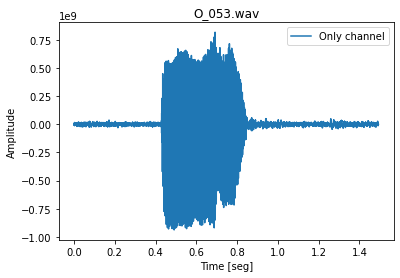

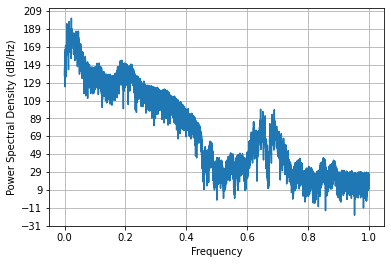

Duración:  1.4935
number of frames = 74776
number of channels = 1


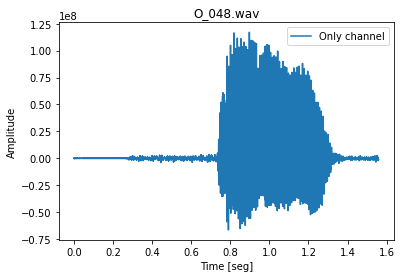

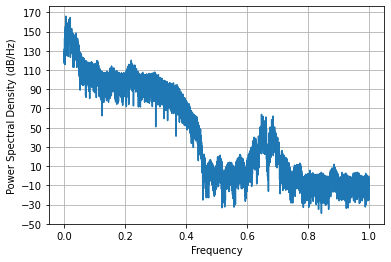

Duración:  1.5578333333333334
number of frames = 72856
number of channels = 1


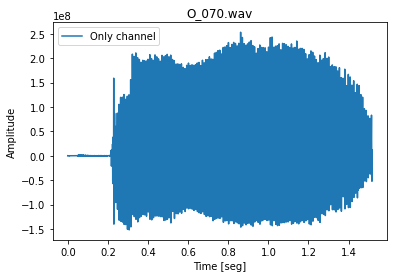

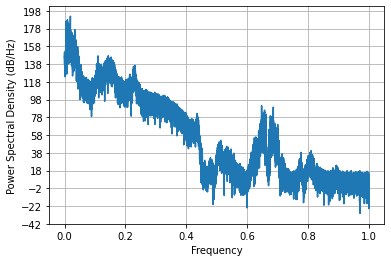

Duración:  1.5178333333333334
number of frames = 60376
number of channels = 1


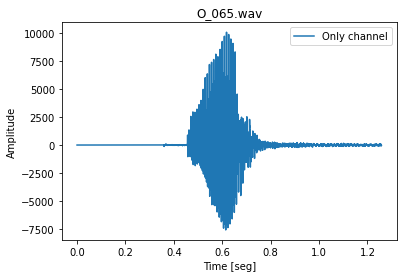

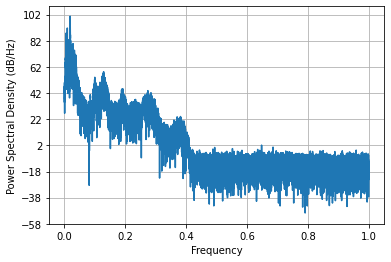

Duración:  1.2578333333333334
number of frames = 98568
number of channels = 1


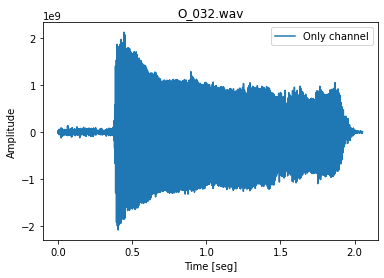

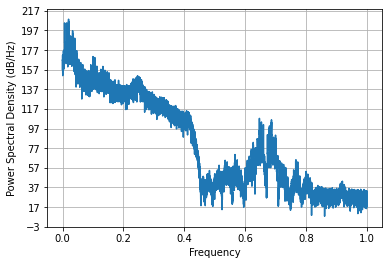

Duración:  2.0535
number of frames = 74776
number of channels = 1


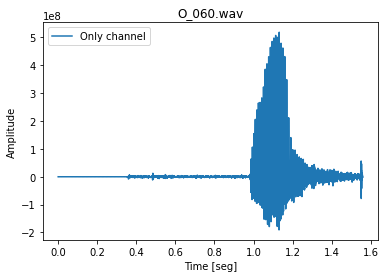

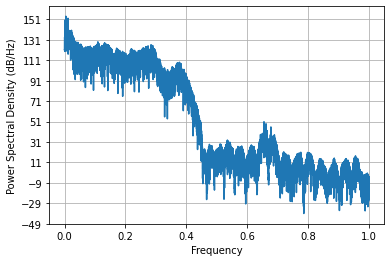

Duración:  1.5578333333333334
number of frames = 80536
number of channels = 1


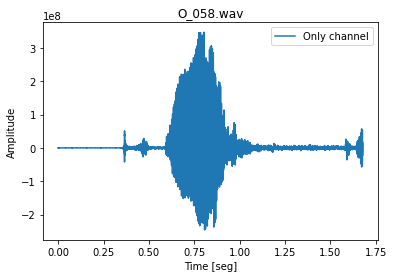

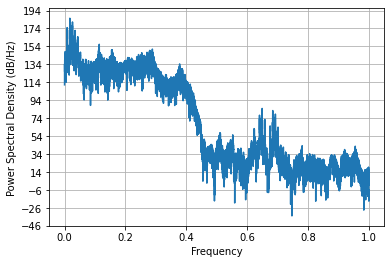

Duración:  1.6778333333333333
number of frames = 88008
number of channels = 1


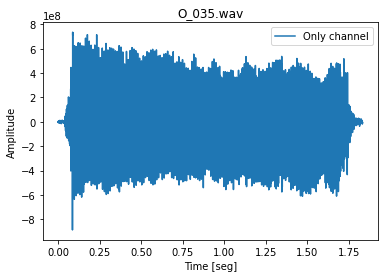

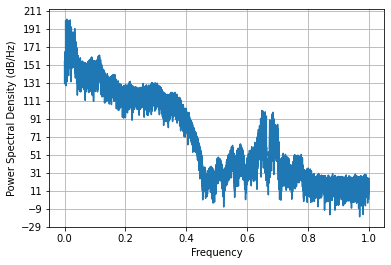

Duración:  1.8335
number of frames = 117976
number of channels = 1


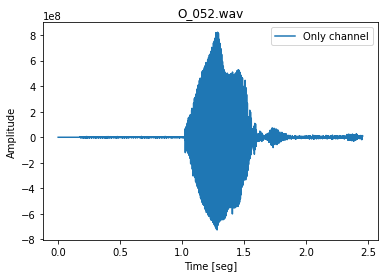

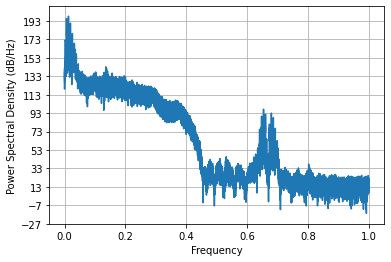

Duración:  2.4578333333333333
number of frames = 67096
number of channels = 1


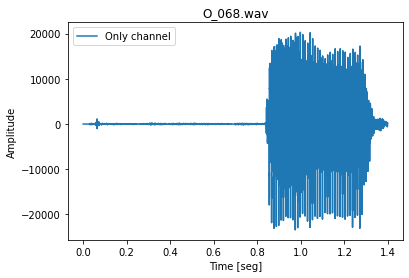

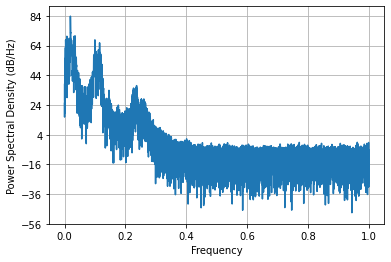

Duración:  1.3978333333333333
number of frames = 51736
number of channels = 1


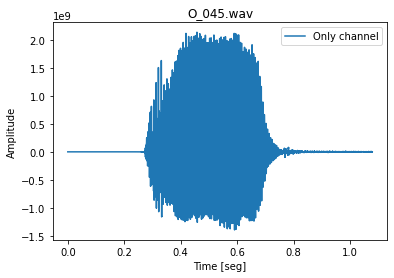

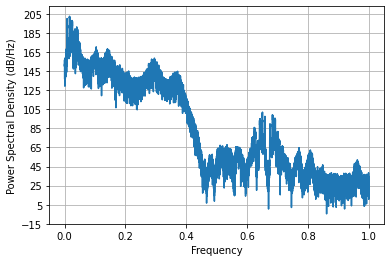

Duración:  1.0778333333333334
number of frames = 165016
number of channels = 1


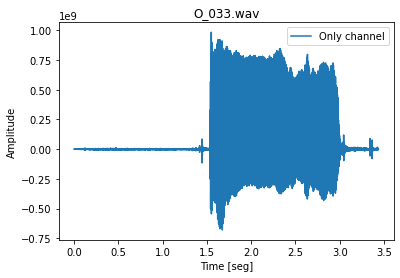

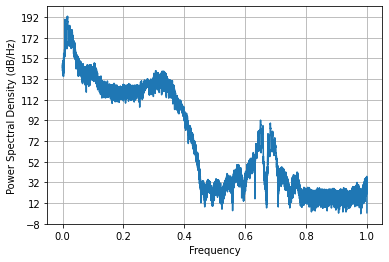

Duración:  3.4378333333333333
number of frames = 169608
number of channels = 1


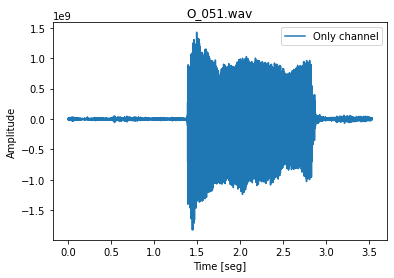

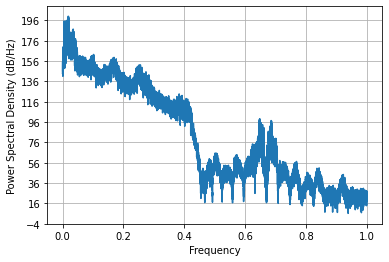

Duración:  3.5335
number of frames = 112216
number of channels = 1


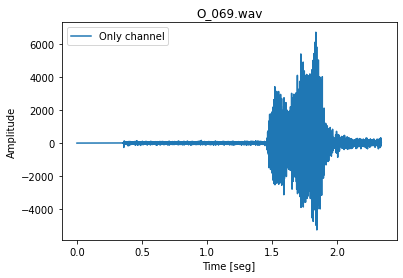

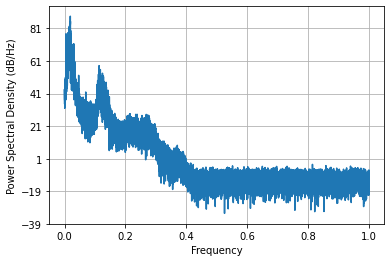

Duración:  2.337833333333333
number of frames = 142936
number of channels = 1


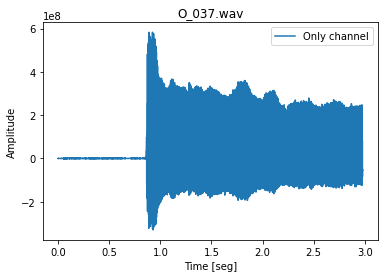

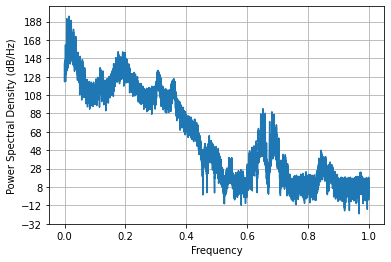

Duración:  2.9778333333333333
number of frames = 77448
number of channels = 1


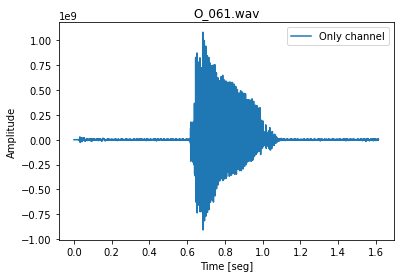

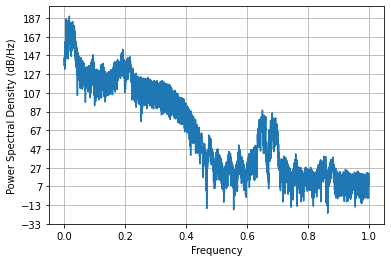

Duración:  1.6135
number of frames = 60376
number of channels = 1


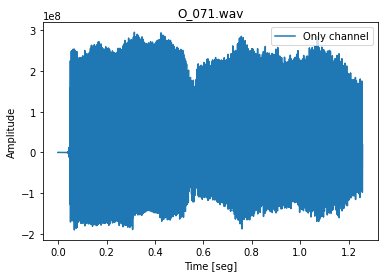

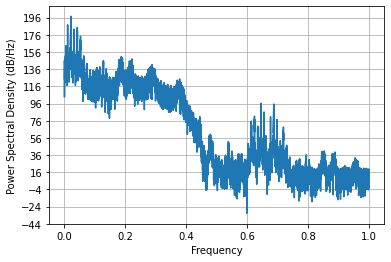

Duración:  1.2578333333333334
number of frames = 60376
number of channels = 1


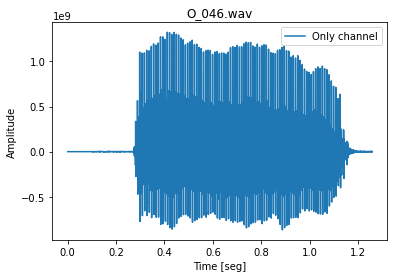

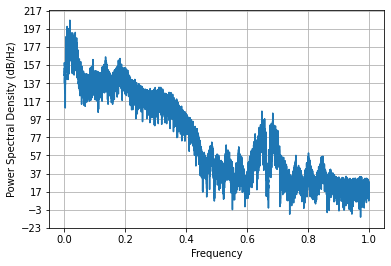

Duración:  1.2578333333333334
number of frames = 65928
number of channels = 1


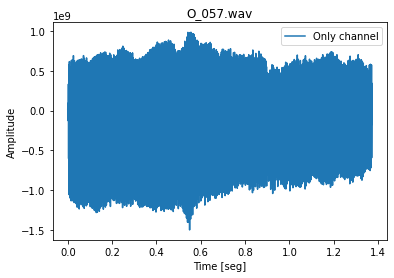

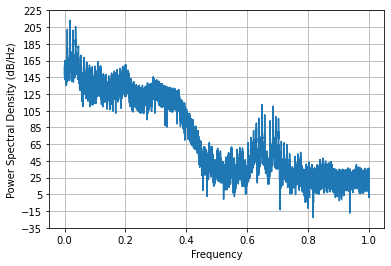

Duración:  1.3735
number of frames = 61128
number of channels = 1


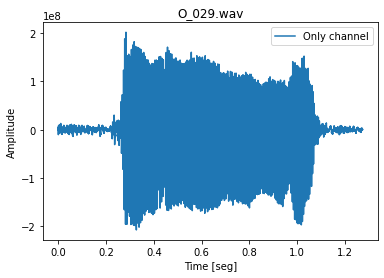

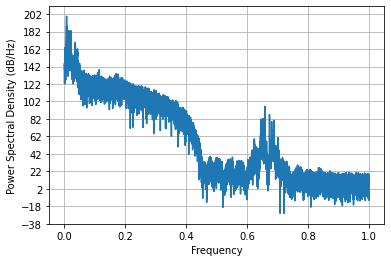

Duración:  1.2735
number of frames = 97816
number of channels = 1


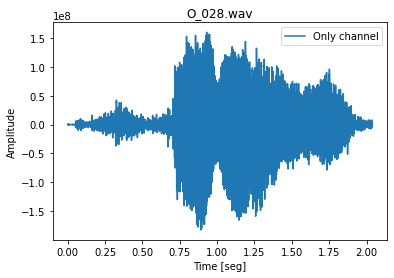

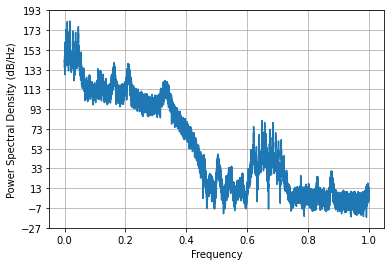

Duración:  2.0378333333333334
number of frames = 56536
number of channels = 1


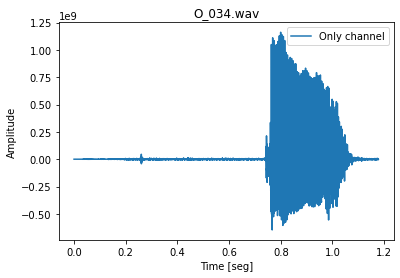

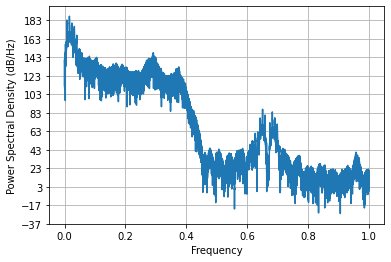

Duración:  1.1778333333333333
number of frames = 55576
number of channels = 1


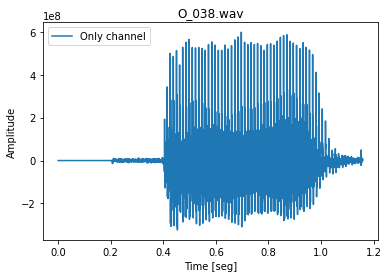

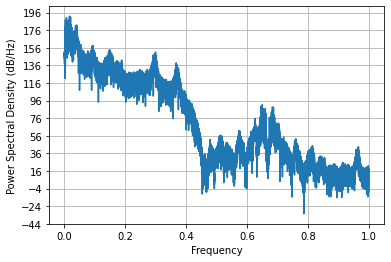

Duración:  1.1578333333333333
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not underst

In [24]:
for o in O_records:
    visualize_wav_info(path_O, o)

Visualizamos la información para las muestras de la clase **U**.

number of frames = 56536
number of channels = 2


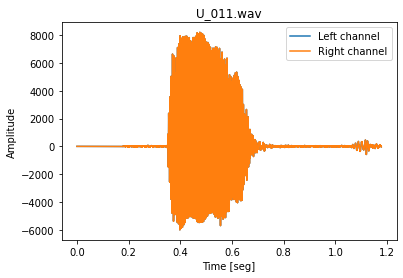

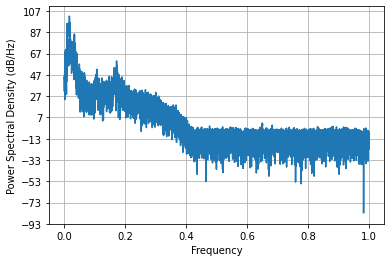

Duración:  1.1778333333333333
number of frames = 84707
number of channels = 2


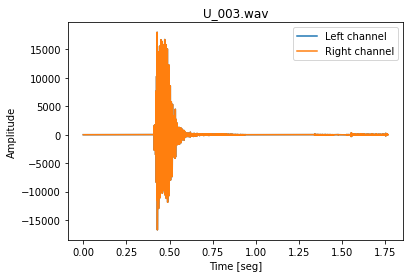

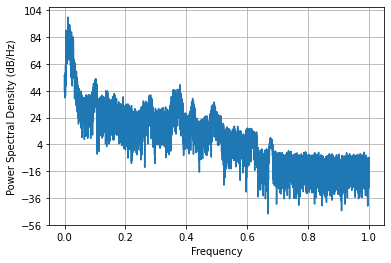

Duración:  1.7647291666666667
number of frames = 108113
number of channels = 2


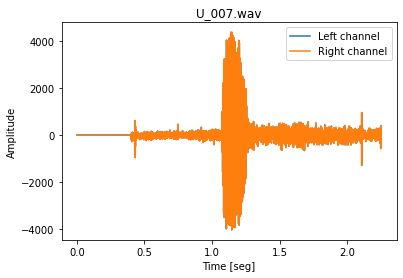

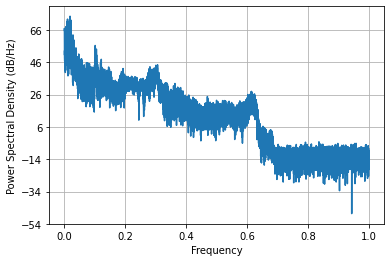

Duración:  2.2523541666666667
number of frames = 69981
number of channels = 1


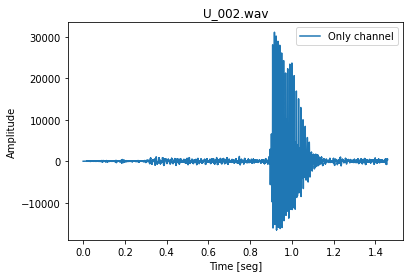

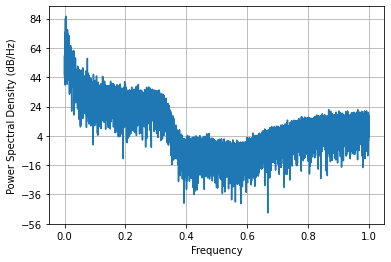

Duración:  1.4579375
number of frames = 187096
number of channels = 2


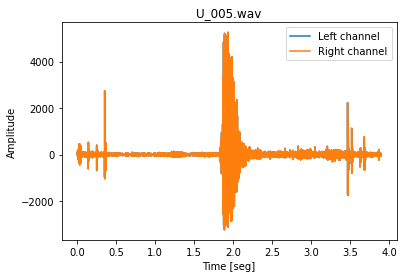

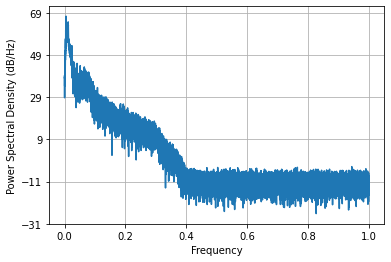

Duración:  3.8978333333333333
number of frames = 75736
number of channels = 2


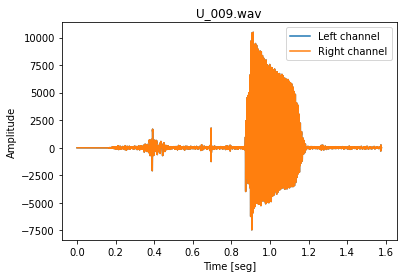

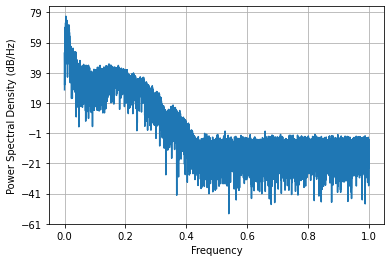

Duración:  1.5778333333333334
number of frames = 105883
number of channels = 2


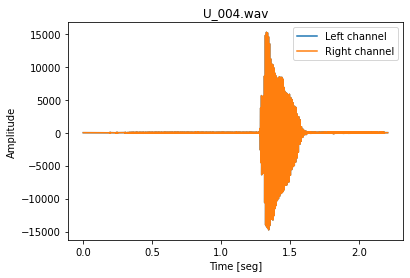

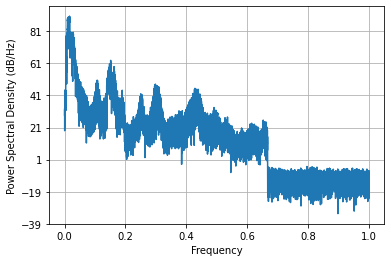

Duración:  2.2058958333333334
number of frames = 116736
number of channels = 2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: WavFileWarning: Chunk (non-data) not understood, skipping it.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


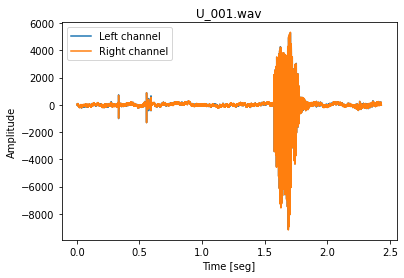

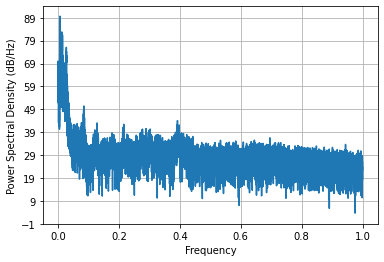

Duración:  2.432
number of frames = 55576
number of channels = 2


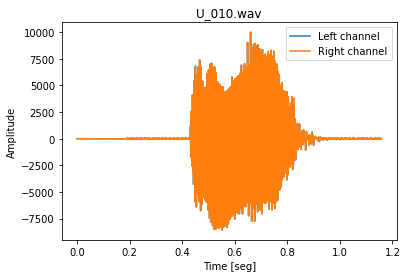

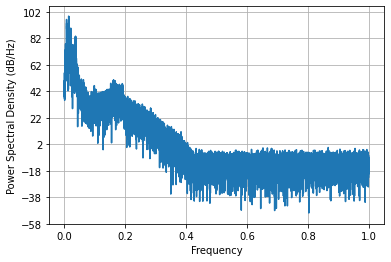

Duración:  1.1578333333333333
number of frames = 45016
number of channels = 2


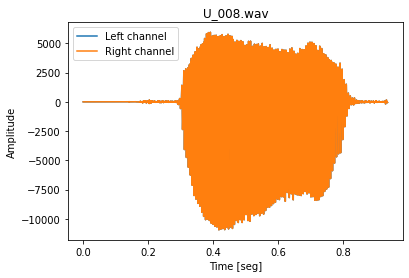

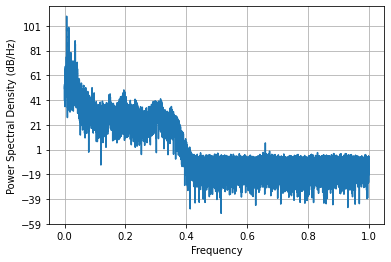

Duración:  0.9378333333333333
number of frames = 81363
number of channels = 2


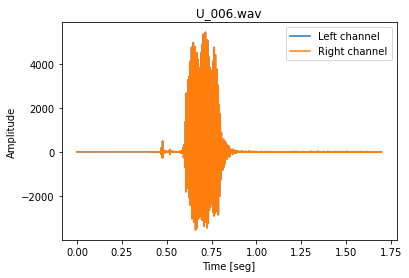

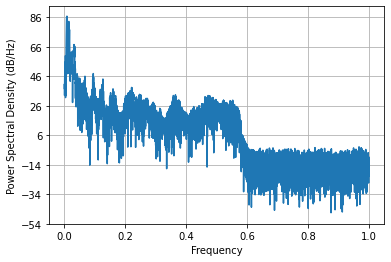

Duración:  1.6950625
number of frames = 77656
number of channels = 1


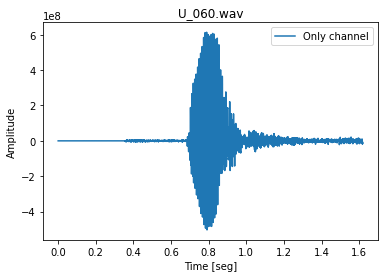

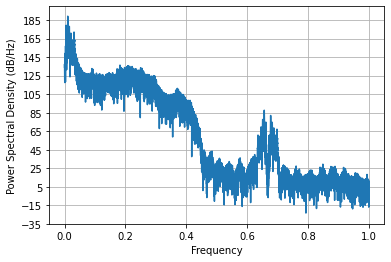

Duración:  1.6178333333333332
number of frames = 81288
number of channels = 1


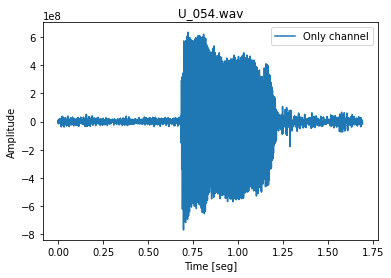

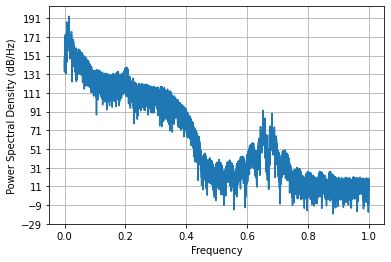

Duración:  1.6935
number of frames = 105496
number of channels = 1


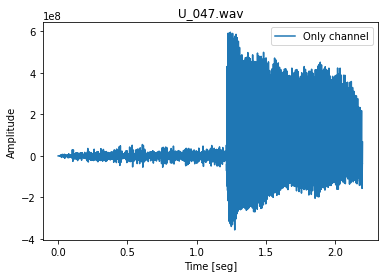

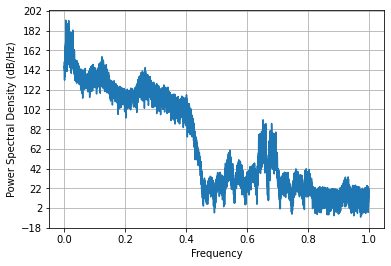

Duración:  2.1978333333333335
number of frames = 72648
number of channels = 1


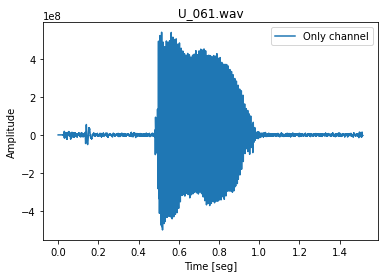

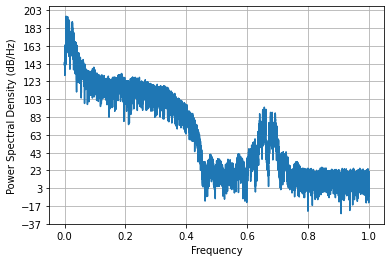

Duración:  1.5135
number of frames = 89176
number of channels = 1


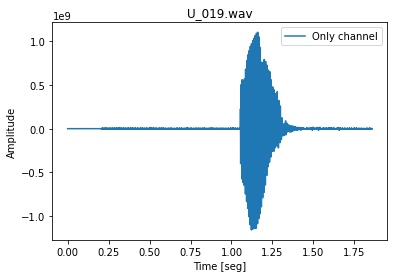

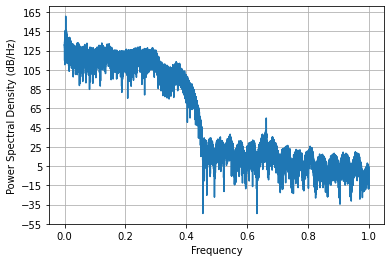

Duración:  1.8578333333333332
number of frames = 177288
number of channels = 1


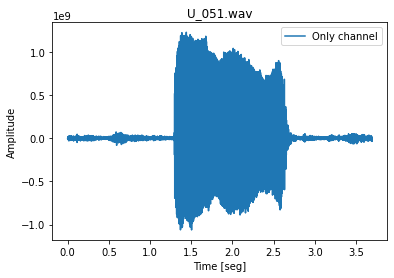

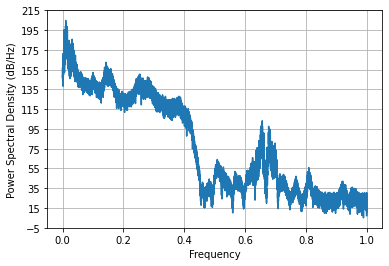

Duración:  3.6935
number of frames = 102616
number of channels = 1


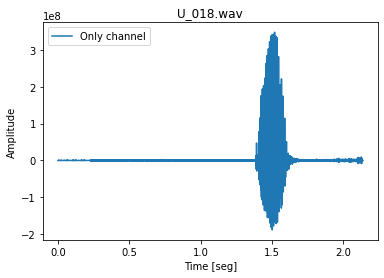

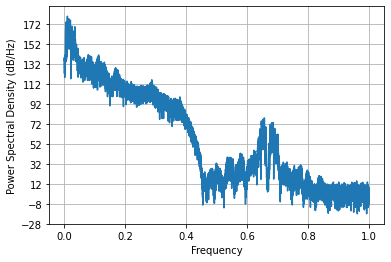

Duración:  2.1378333333333335
number of frames = 64216
number of channels = 1


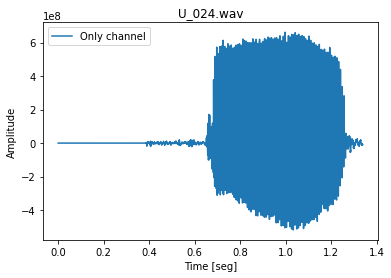

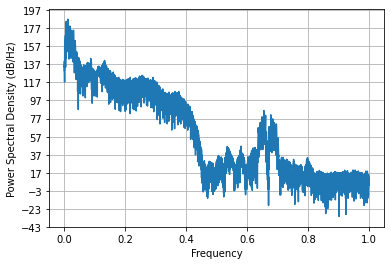

Duración:  1.3378333333333334
number of frames = 79368
number of channels = 1


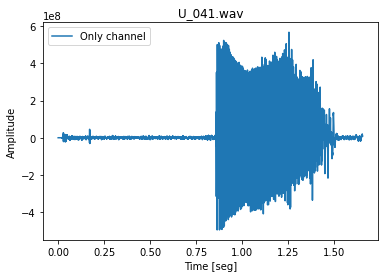

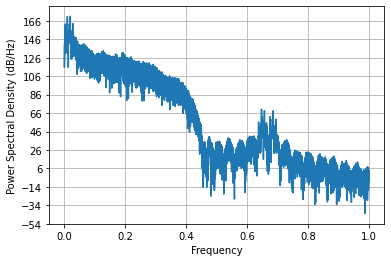

Duración:  1.6535
number of frames = 149656
number of channels = 1


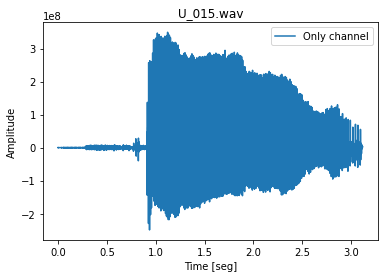

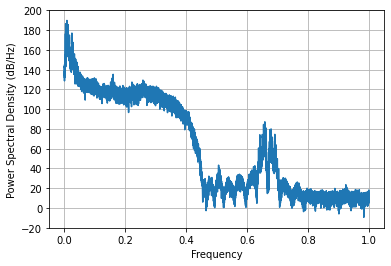

Duración:  3.1178333333333335
number of frames = 170568
number of channels = 1


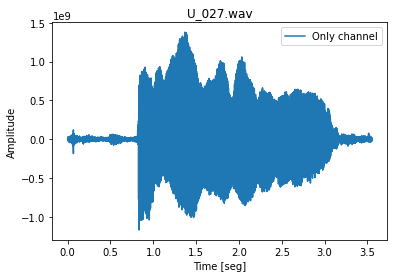

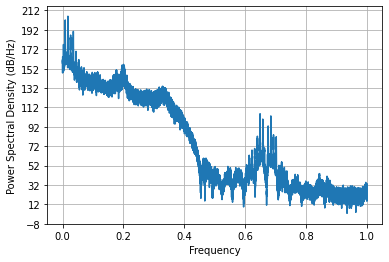

Duración:  3.5535
number of frames = 98568
number of channels = 1


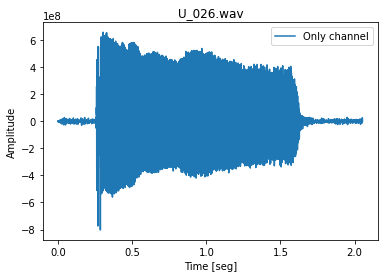

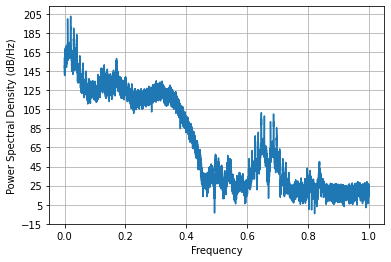

Duración:  2.0535
number of frames = 164056
number of channels = 1


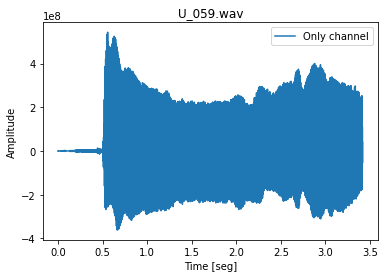

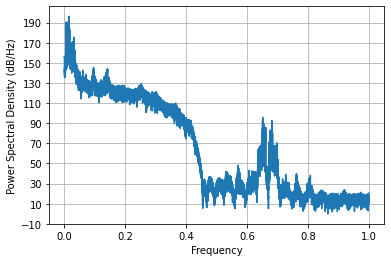

Duración:  3.4178333333333333
number of frames = 162136
number of channels = 1


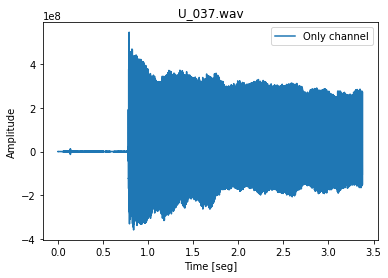

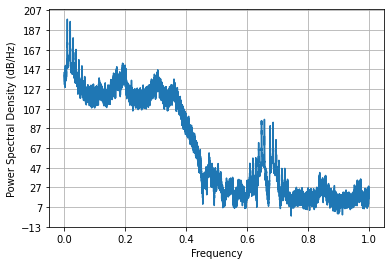

Duración:  3.3778333333333332
number of frames = 67848
number of channels = 1


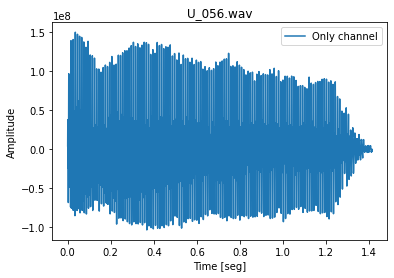

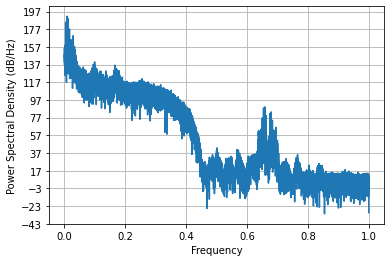

Duración:  1.4135
number of frames = 90136
number of channels = 1


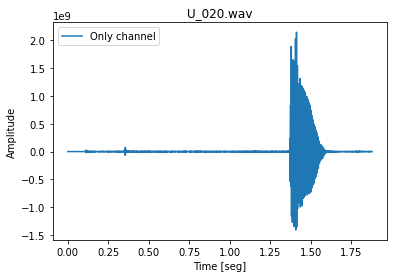

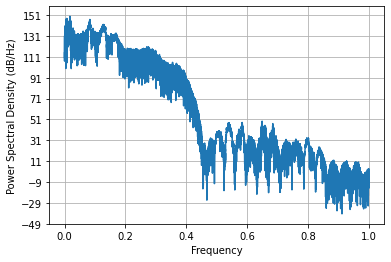

Duración:  1.8778333333333332
number of frames = 48856
number of channels = 1


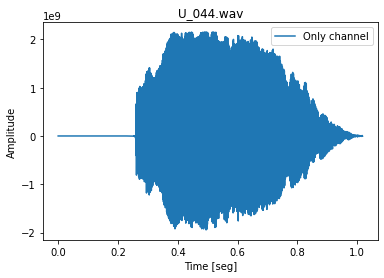

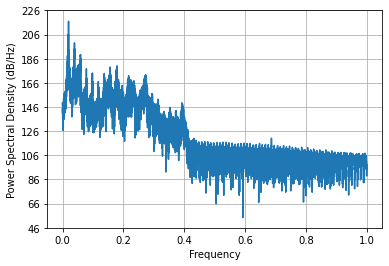

Duración:  1.0178333333333334
number of frames = 68056
number of channels = 2


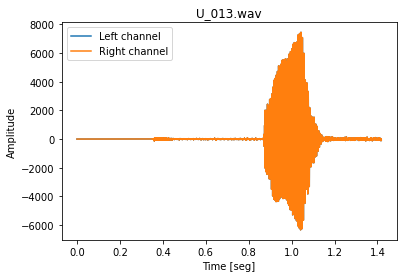

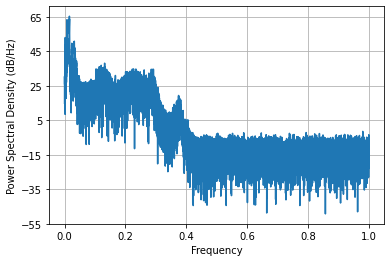

Duración:  1.4178333333333333
number of frames = 127576
number of channels = 1


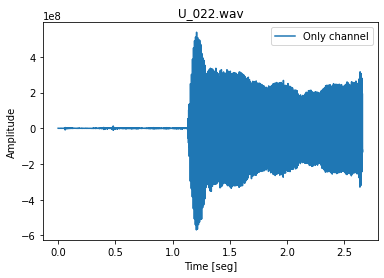

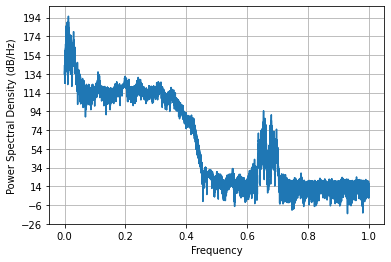

Duración:  2.6578333333333335
number of frames = 88216
number of channels = 1


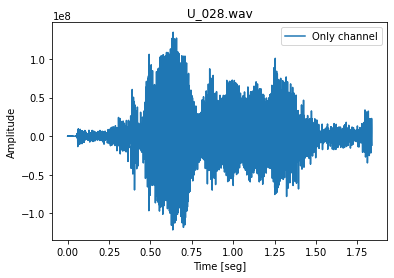

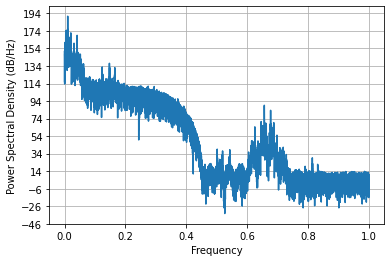

Duración:  1.8378333333333334
number of frames = 126616
number of channels = 1


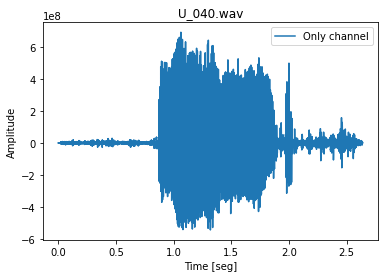

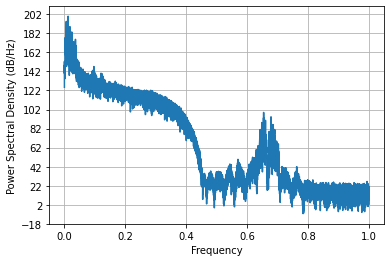

Duración:  2.6378333333333335
number of frames = 61336
number of channels = 1


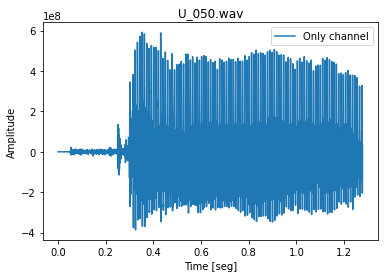

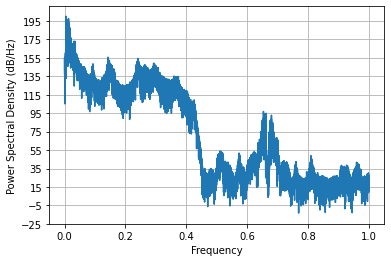

Duración:  1.2778333333333334
number of frames = 91096
number of channels = 1


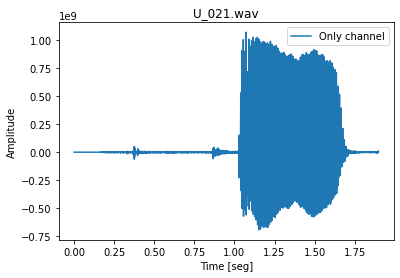

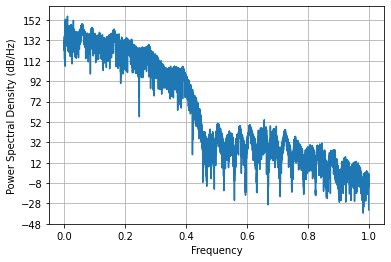

Duración:  1.8978333333333333
number of frames = 289920
number of channels = 1


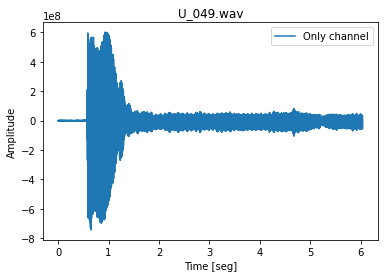

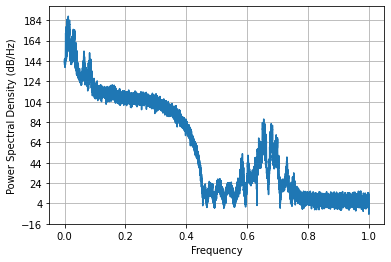

Duración:  6.04
number of frames = 70728
number of channels = 1


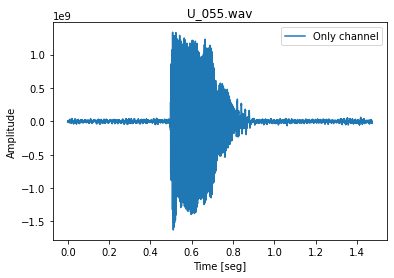

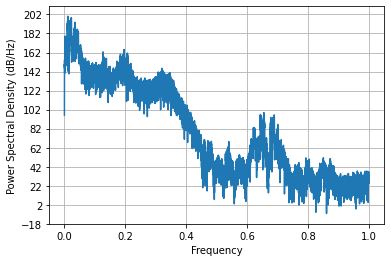

Duración:  1.4735
number of frames = 107416
number of channels = 1


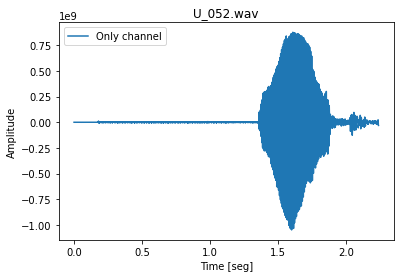

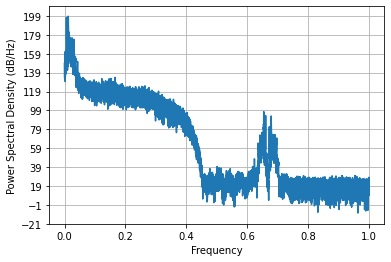

Duración:  2.237833333333333
number of frames = 96856
number of channels = 1


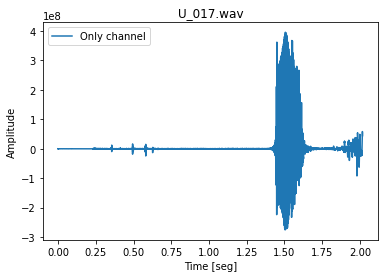

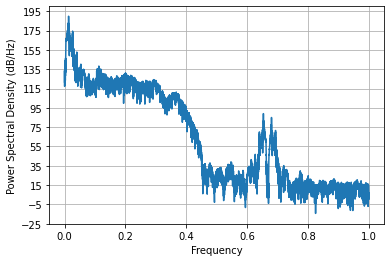

Duración:  2.0178333333333334
number of frames = 70936
number of channels = 1


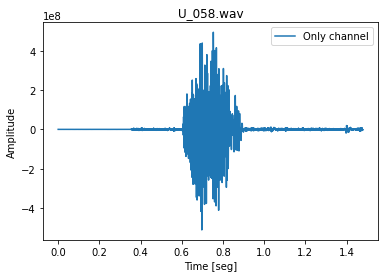

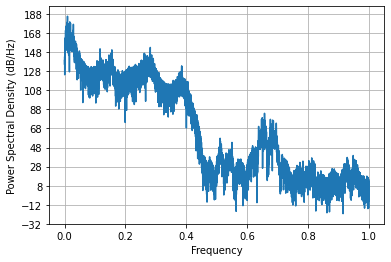

Duración:  1.4778333333333333
number of frames = 69976
number of channels = 2


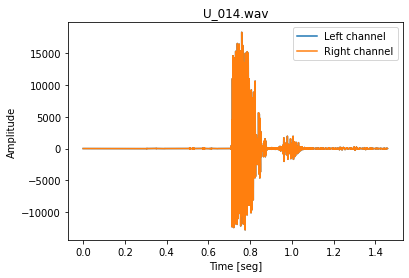

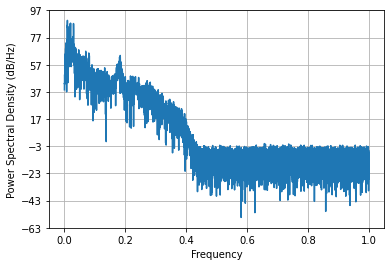

Duración:  1.4578333333333333
number of frames = 72856
number of channels = 1


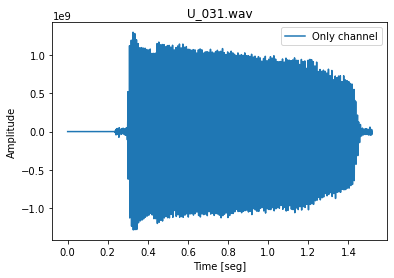

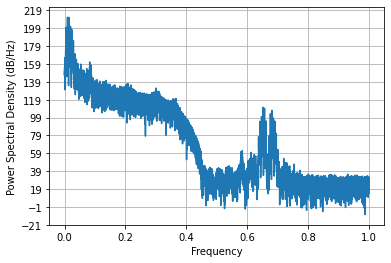

Duración:  1.5178333333333334
number of frames = 69768
number of channels = 1


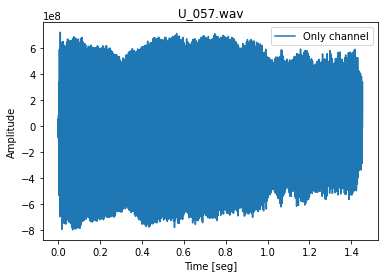

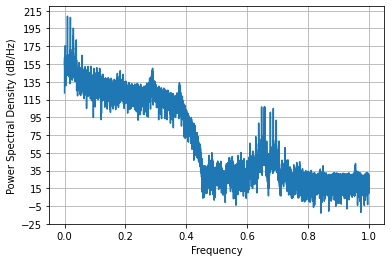

Duración:  1.4535
number of frames = 54616
number of channels = 1


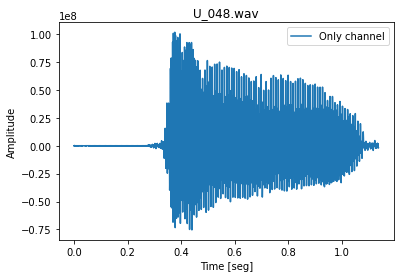

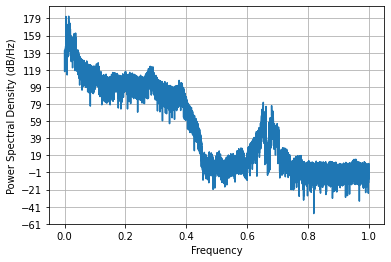

Duración:  1.1378333333333333
number of frames = 61336
number of channels = 1


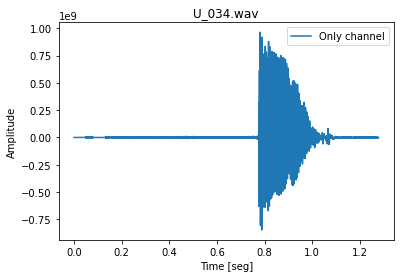

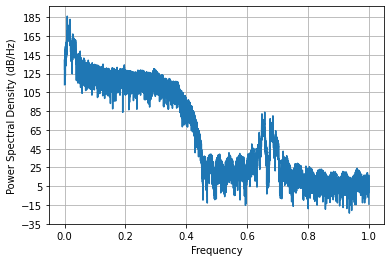

Duración:  1.2778333333333334
number of frames = 106248
number of channels = 1


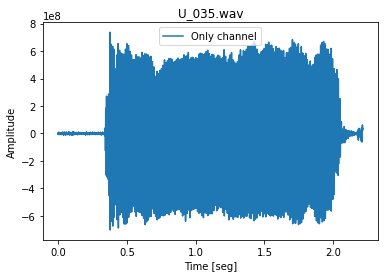

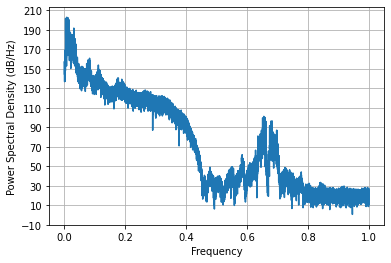

Duración:  2.2135
number of frames = 47896
number of channels = 1


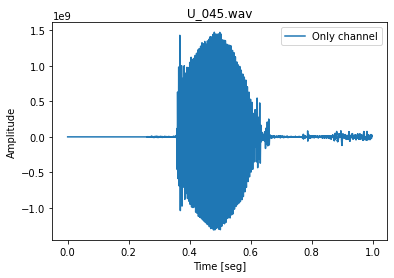

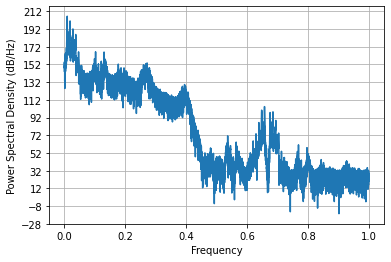

Duración:  0.9978333333333333
number of frames = 70936
number of channels = 2


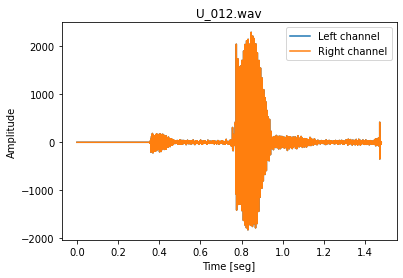

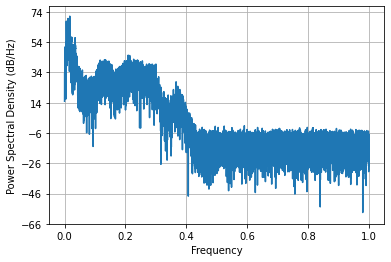

Duración:  1.4778333333333333
number of frames = 82248
number of channels = 1


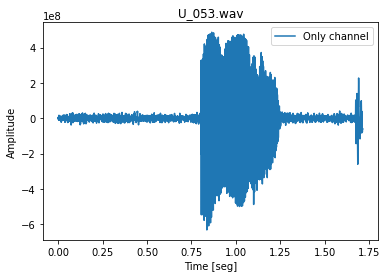

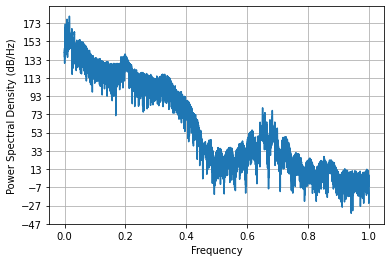

Duración:  1.7135
number of frames = 53656
number of channels = 1


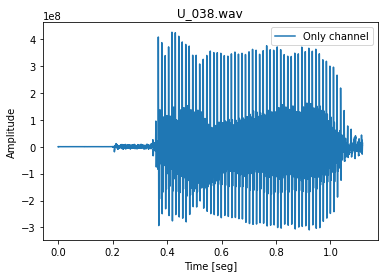

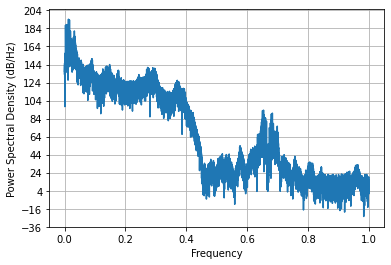

Duración:  1.1178333333333332
number of frames = 58248
number of channels = 1


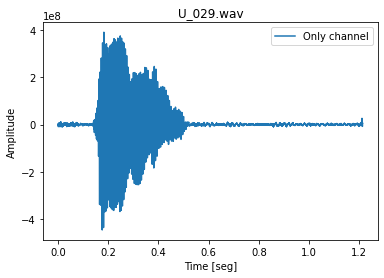

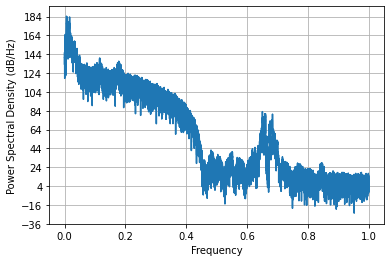

Duración:  1.2135
number of frames = 85128
number of channels = 1


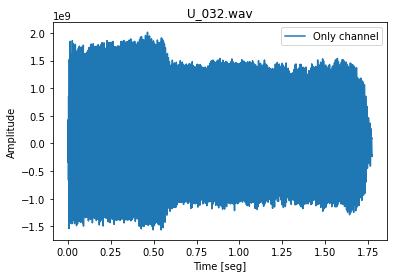

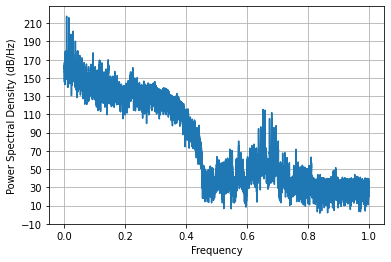

Duración:  1.7735
number of frames = 142936
number of channels = 1


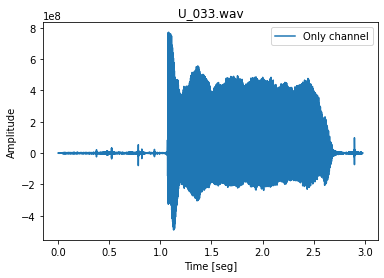

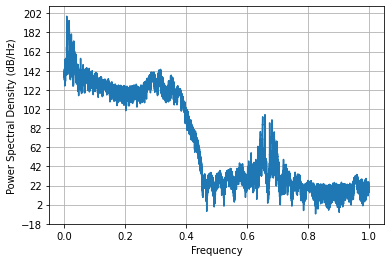

Duración:  2.9778333333333333
number of frames = 82456
number of channels = 1


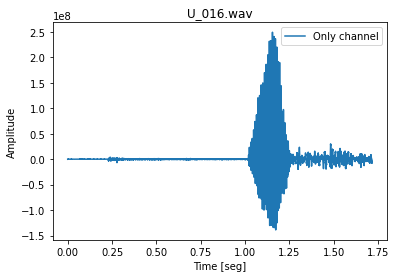

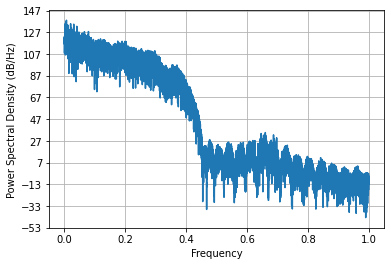

Duración:  1.7178333333333333
number of frames = 87256
number of channels = 1


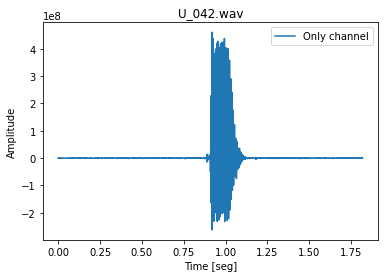

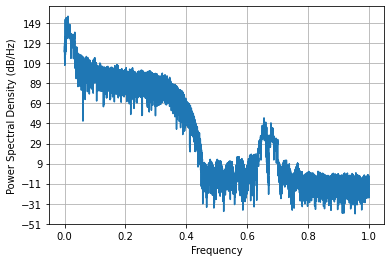

Duración:  1.8178333333333334
number of frames = 63256
number of channels = 1


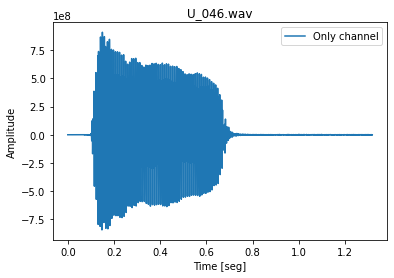

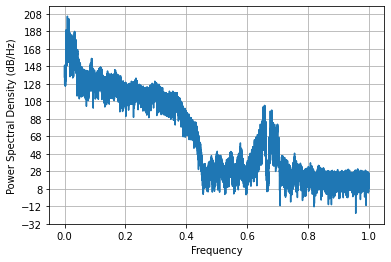

Duración:  1.3178333333333334
number of frames = 54616
number of channels = 1


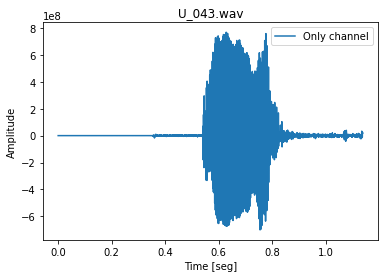

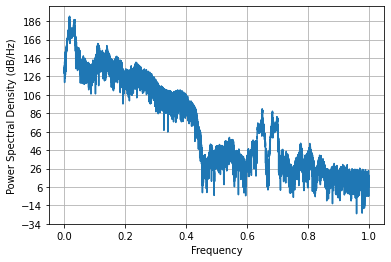

Duración:  1.1378333333333333
number of frames = 94728
number of channels = 1


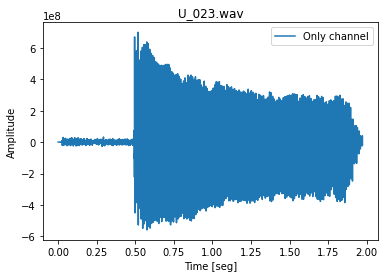

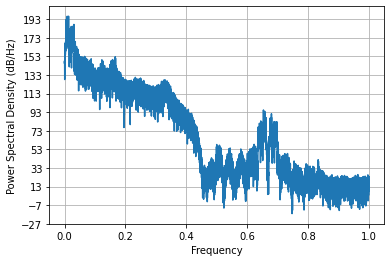

Duración:  1.9735
number of frames = 63256
number of channels = 1


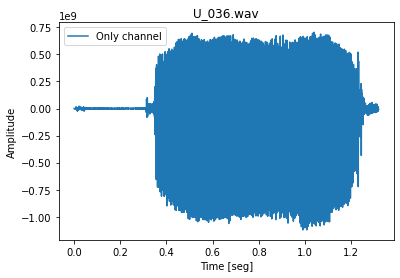

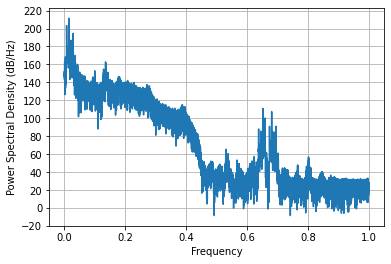

Duración:  1.3178333333333334
number of frames = 93016
number of channels = 1


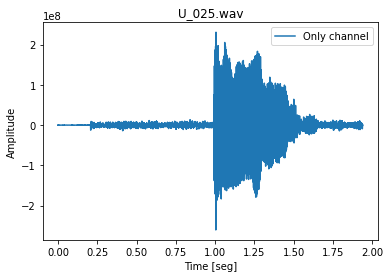

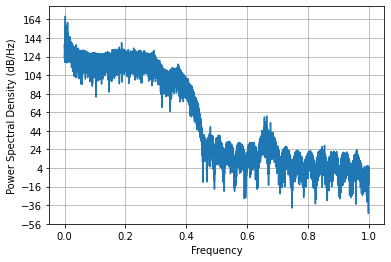

Duración:  1.9378333333333333
number of frames = 119896
number of channels = 1


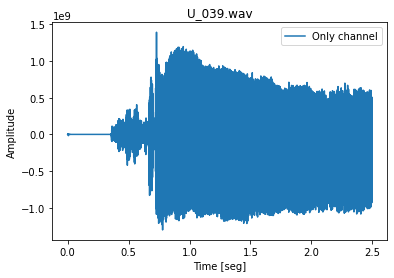

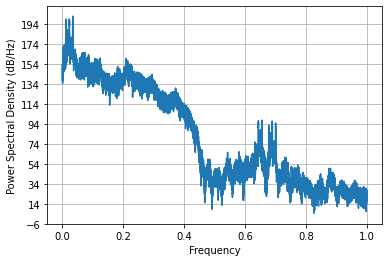

Duración:  2.4978333333333333
number of frames = 70728
number of channels = 1


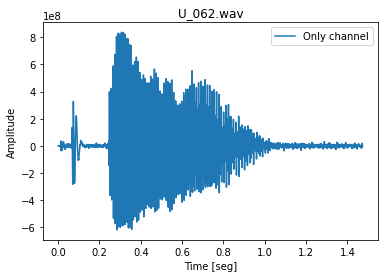

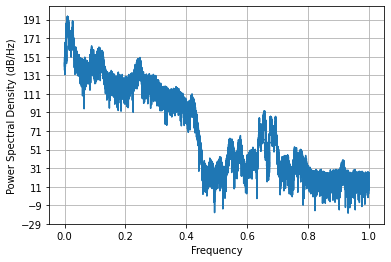

Duración:  1.4735
number of frames = 79576
number of channels = 1


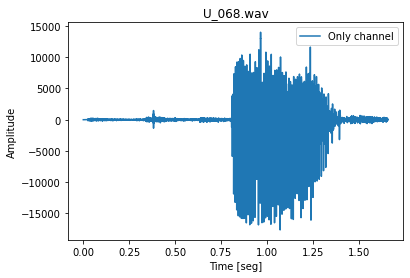

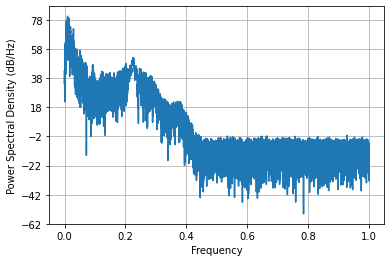

Duración:  1.6578333333333333
number of frames = 47896
number of channels = 1


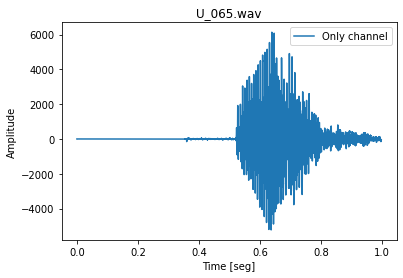

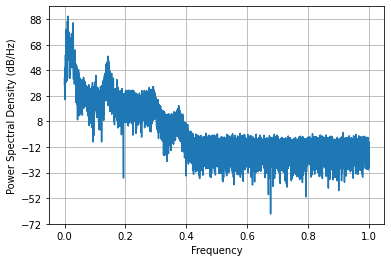

Duración:  0.9978333333333333
number of frames = 129496
number of channels = 1


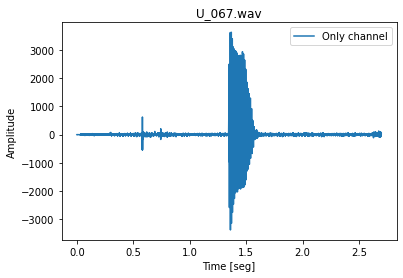

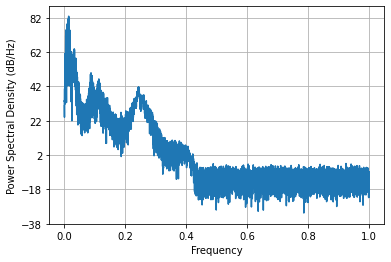

Duración:  2.6978333333333335
number of frames = 62296
number of channels = 1


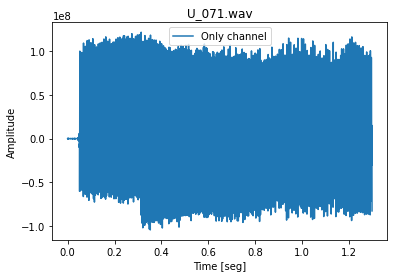

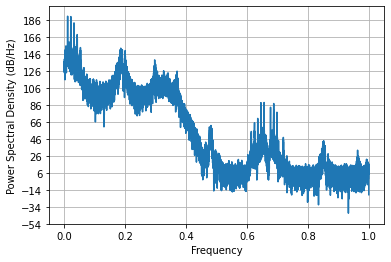

Duración:  1.2978333333333334
number of frames = 84376
number of channels = 1


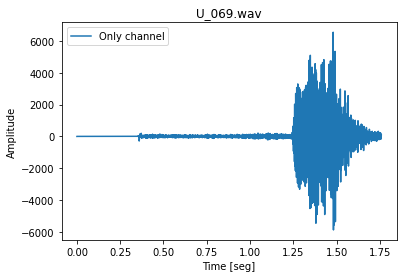

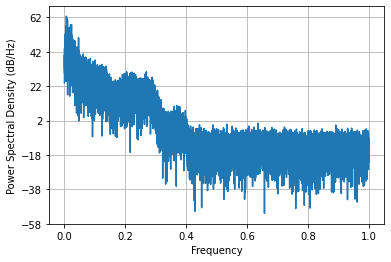

Duración:  1.7578333333333334
number of frames = 39189
number of channels = 1


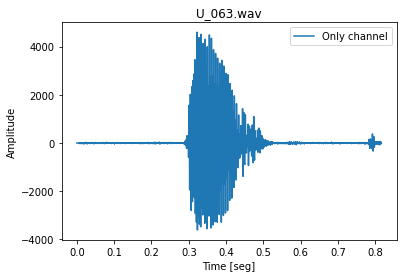

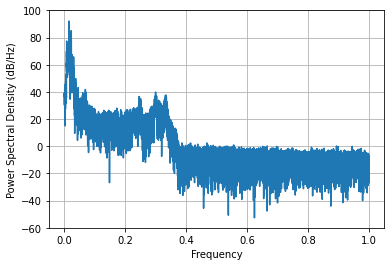

Duración:  0.8164375
number of frames = 76906
number of channels = 1


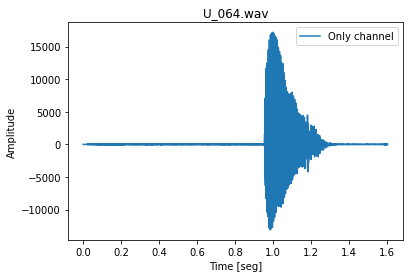

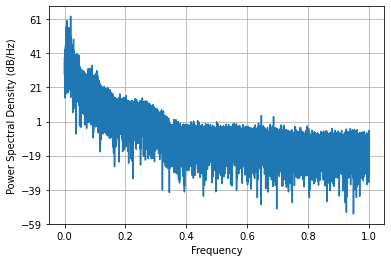

Duración:  1.6022083333333332
number of frames = 46936
number of channels = 1


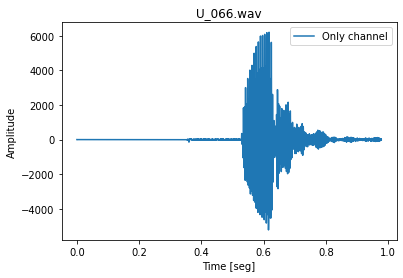

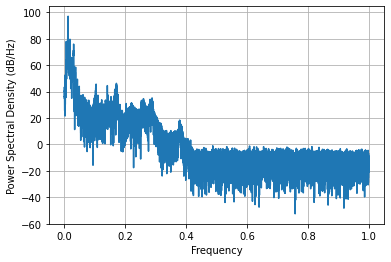

Duración:  0.9778333333333333
number of frames = 45976
number of channels = 1


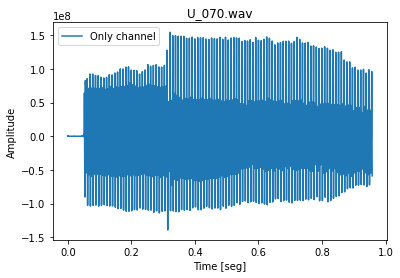

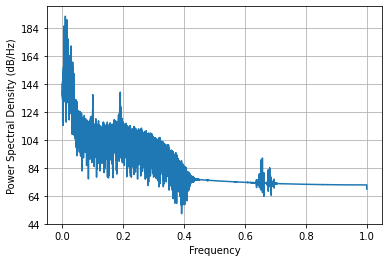

Duración:  0.9578333333333333
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not understood.
File format b'OggS'... not underst

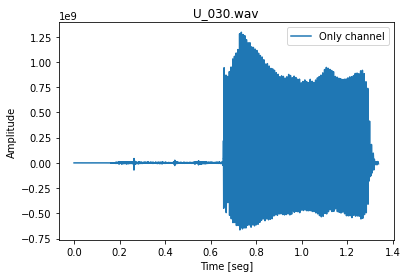

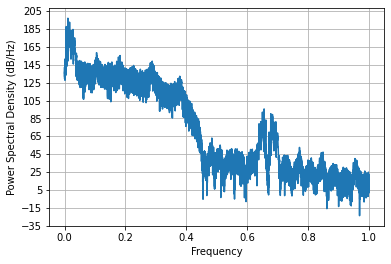

Duración:  1.3378333333333334


In [25]:
for u in U_records:
    visualize_wav_info(path_U, u)

Podemos notar algunas cosas que son importantes tener en cuenta:


1.   Algunas muestras de sonido corresponden a un **sonido estereo**, es decir, son una sucesión de valores para un altavoz izquierdo, y otro derecho. Pero, en realidad, solamente los registros del altavoz izquierdo son significativos, pues en el estereograma del canal derecho parece no existir. Esto puede detectarse facilmente en la información del archivo por medio de **shape**, ya que los sonidos estereos se caracterizan por **shape = (x, 2)**, mientras que los **mono auditivos** se caracterizan por **shape = (x,   )**. Esto también puede deducirse facilmente de los colores de las gráficas: cuando se trata de un **sonido estereo** hay dos curvas (azul y naranja), cuando no, solo una (azul).

2.   Las señales de sonido **no** están normalizadas.

3.   Visualmente, las señales de diferentes clases pueden parecerse mucho entre sí.

4.   No existe la misma cantidad de sonidos **estereo** que de sonidos **mono auditivos**.





In [103]:
def visualize_all_wave(path, wav_file):
    samplerate, data = wavfile.read(path+'/'+wav_file)
    if (isinstance(data[0], np.ndarray)):
        length = data.shape[0] / samplerate    
        time = np.linspace(0., length, data.shape[0])
        """plt.plot(time, data[:, 0], label="Left channel")
        plt.plot(time, data[:, 1], label="Right channel")
        plt.legend()
        plt.title(wav_file)
        plt.xlabel("Time [seg]")
        plt.ylabel("Amplitude")
        plt.show()"""
        plt.psd(data[:, 1], 2**5, scale_by_freq=True)
        #plt.show()
    else:
        length = len(data) / samplerate
        time = np.linspace(0., length, len(data))
        """plt.plot(time, data, label="Only channel")
        plt.legend()
        plt.title(wav_file)
        plt.xlabel("Time [seg]")
        plt.ylabel("Amplitude")
        plt.show()"""
        plt.psd(data, 2**5, scale_by_freq=True)
        #plt.show()
    print("Duración: ", length)

def visualize_all_psd(path, wav_file):
    try:
        #visualize_wav_meta(path, wav_file)
        visualize_wav_wave(path, wav_file)
    except Exception as e:
        print(e)

Duración:  3.7178333333333335
Duración:  1.6578333333333333
Duración:  2.1978333333333335
Duración:  1.0178333333333334
Duración:  1.9978333333333333
Duración:  2.4378333333333333
Duración:  1.6578333333333333
Duración:  1.8111666666666666
Duración:  1.1978333333333333
Duración:  1.7378333333333333
Duración:  2.3578333333333332
Duración:  2.0578333333333334
Duración:  1.6178333333333332
Duración:  2.737833333333333
Duración:  1.5778333333333334
Duración:  1.1178333333333332
Duración:  2.043375
Duración:  2.2735
Duración:  1.1179375
Duración:  1.6254166666666667
Duración:  1.55575
Duración:  2.1953125
Duración:  1.4378333333333333
Duración:  2.3578333333333332


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


Duración:  1.3735
Duración:  1.3378333333333334
Duración:  2.0535
Duración:  2.1342916666666665
Duración:  2.1378333333333335
Duración:  2.3578333333333332
Duración:  1.2378333333333333
Duración:  1.3135
Duración:  1.5535
Duración:  2.3978333333333333
Duración:  1.3378333333333334
Duración:  1.3935
Duración:  1.9378333333333333
Duración:  1.2978333333333334
Duración:  2.5135
Duración:  1.4535
Duración:  1.3578333333333332
Duración:  1.3378333333333334
Duración:  1.2578333333333334
Duración:  1.2578333333333334
Duración:  3.2535
Duración:  1.9335
Duración:  1.6978333333333333
Duración:  1.7178333333333333
Duración:  1.7578333333333334
Duración:  2.5735
Duración:  1.7178333333333333
Duración:  2.5578333333333334
Duración:  1.0178333333333334
Duración:  2.5578333333333334
Duración:  1.9778333333333333
Duración:  5.58
Duración:  3.4378333333333333
Duración:  3.4978333333333333
Duración:  1.0578333333333334
Duración:  1.3178333333333334
Duración:  2.297833333333333
Duración:  1.457833333333

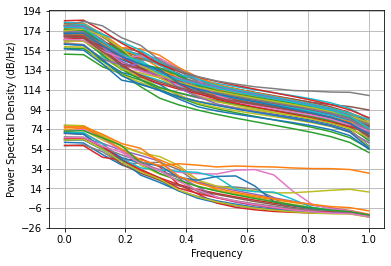

In [104]:
for a in A_records:
    visualize_all_psd(path_A, a)

Duración:  2.297833333333333
Duración:  1.2778333333333334
Duración:  2.113020833333333
Duración:  1.1778333333333333
Duración:  2.4978333333333333
Duración:  2.4578333333333333
Duración:  2.3979375
Duración:  1.1978333333333333
Duración:  1.3778333333333332
Duración:  2.3978333333333333
Duración:  1.6950625
Duración:  2.777833333333333
Duración:  2.7306666666666666
Duración:  1.6578333333333333
Duración:  1.0778333333333334


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


Duración:  3.3778333333333332
Duración:  1.7182916666666668
Duración:  1.7378333333333333
Duración:  1.1378333333333333
Duración:  1.3535
Duración:  1.6135
Duración:  1.8378333333333334
Duración:  1.2378333333333333
Duración:  4.2735
Duración:  1.6178333333333332
Duración:  1.3178333333333334
Duración:  2.4178333333333333
Duración:  1.3978333333333333
Duración:  1.7578333333333334
Duración:  2.1178333333333335
Duración:  2.4378333333333333
Duración:  2.3135
Duración:  1.4935
Duración:  2.0578333333333334
Duración:  1.9378333333333333
Duración:  1.2778333333333334
Duración:  2.3978333333333333
Duración:  2.2535
Duración:  1.6535
Duración:  2.4735
Duración:  3.6178333333333335
Duración:  1.1335
Duración:  1.5735
Duración:  1.1778333333333333
Duración:  1.6535
Duración:  2.3978333333333333
Duración:  3.6578333333333335
Duración:  1.6778333333333333
Duración:  1.5178333333333334
Duración:  2.4578333333333333
Duración:  1.5578333333333334
Duración:  2.3578333333333332
Duración:  1.305
Durac

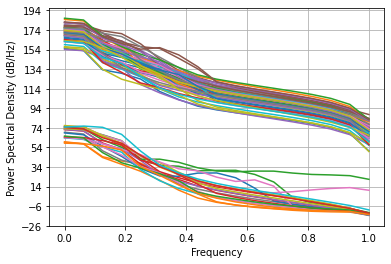

In [105]:
for e in E_records:
    visualize_all_psd(path_E, e)

Duración:  2.0178333333333334
Duración:  2.6335
Duración:  1.0378333333333334
Duración:  1.1778333333333333
Duración:  1.6778333333333333
Duración:  2.2178333333333335
Duración:  2.7735
Duración:  1.5578333333333334
Duración:  1.2978333333333334
Duración:  1.5778333333333334
Duración:  1.4778333333333333
Duración:  1.9578333333333333
Duración:  3.0978333333333334
Duración:  1.7378333333333333
Duración:  1.8379375
Duración:  1.7735
Duración:  2.337833333333333
Duración:  1.0178333333333334
Duración:  1.4578333333333333
Duración:  1.3778333333333332
Duración:  1.0578333333333334
Duración:  3.5578333333333334
Duración:  2.538666666666667
Duración:  1.9378333333333333
Duración:  1.1978333333333333
Duración:  1.8935
Duración:  2.757833333333333
Duración:  1.0378333333333334
Duración:  1.4978333333333333
Duración:  1.3378333333333334
Duración:  1.8778333333333332
Duración:  1.8808333333333334


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


Duración:  2.4178333333333333
Duración:  1.7778333333333334
Duración:  0.8978333333333334
Duración:  1.0578333333333334
Duración:  1.4378333333333333
Duración:  2.0135
Duración:  1.7978333333333334
Duración:  2.0378333333333334
Duración:  1.7378333333333333
Duración:  1.1378333333333333
Duración:  3.3778333333333332
Duración:  1.8535
Duración:  2.1594583333333333
Duración:  1.3135
Duración:  1.55575
Duración:  1.7378333333333333
Duración:  1.9272708333333333
Duración:  2.3578333333333332
Duración:  1.3935
Duración:  1.9535
Duración:  2.0378333333333334
Duración:  3.0778333333333334
Duración:  1.1978333333333333
Duración:  1.3692916666666666
Duración:  2.3578333333333332
Duración:  1.4978333333333333
Duración:  1.3335
Duración:  1.6735
Duración:  1.1178333333333332
Duración:  1.9778333333333333
Duración:  1.1335
Duración:  1.3335
Duración:  1.4778333333333333
Duración:  1.3578333333333332
Duración:  1.7735
Duración:  1.2978333333333334
Duración:  3.1735
Duración:  1.4578333333333333
Fil

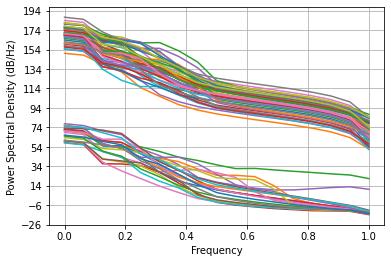

In [106]:
for i in I_records:
    visualize_all_psd(path_I, i)

Duración:  1.5978333333333334
Duración:  1.161
Duración:  2.0778333333333334
Duración:  1.2378333333333333
Duración:  1.7378333333333333
Duración:  1.4779375
Duración:  1.8935
Duración:  1.5535
Duración:  1.648625
Duración:  2.4106666666666667
Duración:  1.7978333333333334
Duración:  2.7735
Duración:  1.7778333333333334
Duración:  1.0378333333333334
Duración:  2.0178333333333334
Duración:  3.1578333333333335
Duración:  1.1778333333333333
Duración:  2.2523541666666667


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


Duración:  2.5978333333333334
Duración:  1.9378333333333333
Duración:  2.2058958333333334
Duración:  1.7778333333333334
Duración:  1.3778333333333332
Duración:  1.1378333333333333
Duración:  1.7978333333333334
Duración:  1.1978333333333333
Duración:  1.5378333333333334
Duración:  2.5978333333333334
Duración:  1.0978333333333334
Duración:  1.7335
Duración:  2.4778333333333333
Duración:  1.3735
Duración:  1.2978333333333334
Duración:  1.4178333333333333
Duración:  0.9378333333333333
Duración:  5.76
Duración:  1.3378333333333334
Duración:  0.9778333333333333
Duración:  1.0607083333333334
Duración:  2.4978333333333333
Duración:  1.2535
Duración:  1.3578333333333332
Duración:  3.1978333333333335
Duración:  1.6335
Duración:  1.0378333333333334
Duración:  1.3335
Duración:  2.237833333333333
Duración:  1.4935
Duración:  1.5578333333333334
Duración:  1.5178333333333334
Duración:  1.2578333333333334
Duración:  2.0535
Duración:  1.5578333333333334
Duración:  1.6778333333333333
Duración:  1.8335
D

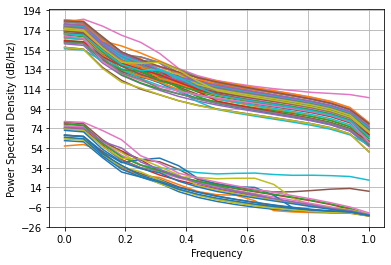

In [107]:
for o in O_records:
    visualize_all_psd(path_O, o)

Duración:  1.1778333333333333
Duración:  1.7647291666666667
Duración:  2.2523541666666667
Duración:  1.4579375
Duración:  3.8978333333333333
Duración:  1.5778333333333334
Duración:  2.2058958333333334
Duración:  2.432
Duración:  1.1578333333333333
Duración:  0.9378333333333333
Duración:  1.6950625
Duración:  1.6178333333333332


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: WavFileWarning: Chunk (non-data) not understood, skipping it.
  # This is added back by InteractiveShellApp.init_path()


Duración:  1.6935
Duración:  2.1978333333333335
Duración:  1.5135
Duración:  1.8578333333333332
Duración:  3.6935
Duración:  2.1378333333333335
Duración:  1.3378333333333334
Duración:  1.6535
Duración:  3.1178333333333335
Duración:  3.5535
Duración:  2.0535
Duración:  3.4178333333333333
Duración:  3.3778333333333332
Duración:  1.4135
Duración:  1.8778333333333332
Duración:  1.0178333333333334
Duración:  1.4178333333333333
Duración:  2.6578333333333335
Duración:  1.8378333333333334
Duración:  2.6378333333333335
Duración:  1.2778333333333334
Duración:  1.8978333333333333
Duración:  6.04
Duración:  1.4735
Duración:  2.237833333333333
Duración:  2.0178333333333334
Duración:  1.4778333333333333
Duración:  1.4578333333333333
Duración:  1.5178333333333334
Duración:  1.4535
Duración:  1.1378333333333333
Duración:  1.2778333333333334
Duración:  2.2135
Duración:  0.9978333333333333
Duración:  1.4778333333333333
Duración:  1.7135
Duración:  1.1178333333333332
Duración:  1.2135
Duración:  1.7735
D

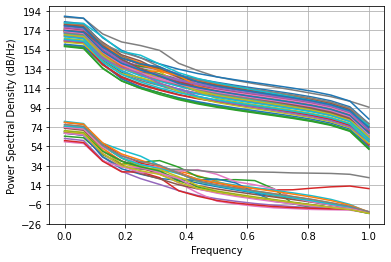

In [108]:
for u in U_records:
    visualize_all_psd(path_U, u)

#**Preprocesamiento de los datos**

In [ ]:
def obtain_wav_info(path, wav_file):
    try:
        samplerate, data = wavfile.read(path+'/'+wav_file)
        return (samplerate, data)
    except Exception as e:
        print(e)

In [ ]:
samplerate, data = obtain_wav_info(path_A, A_records[2])

[ 3.74472350e-01  3.84587659e-01 -6.79238735e-01 -1.45925326e+00
  2.38666560e-01 -2.93614418e-01 -9.79801396e-01 -1.72700214e+00
  8.01571098e-01  1.99404563e+00 -2.35519242e-01  1.81378673e-01
 -6.08336147e-01 -1.19970856e+00  2.36000107e+00  5.11107952e-01
  3.65896460e-01  6.67724143e-01 -2.06200056e+00 -4.52126908e-01
 -1.08949922e+00 -2.41617256e-01  4.99563631e-01  7.75786454e-01
 -1.93137831e-01 -8.49459606e-02  2.16983507e+00  2.13393940e-01
 -3.46188603e-01  1.03264358e+00 -2.15677997e+00 -1.35828993e+00
 -5.82032151e-02  3.41198602e-01  1.10674430e+00  4.40690123e-01
  1.52992234e-01  2.70749629e-02  6.35191795e-01  8.55562475e-01
 -1.50252464e-01  1.21195621e+00  1.09718412e+00  1.07428894e+00
 -1.06476743e+00  6.83719357e-01  6.69536715e-01  2.20879823e-01
  4.31137739e-01  8.85412372e-01 -1.14898252e+00  9.94747887e-02
 -3.86596497e-01  6.15636021e-01 -1.21535223e+00 -8.67820723e-01
 -4.58338823e-01 -6.28241801e-01 -4.36484475e-01 -8.24081687e-01
 -1.51487150e-01  6.40303

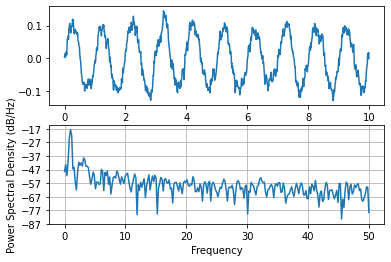

In [29]:
dt = 0.01
t = np.arange(0, 10, dt)
nse = np.random.randn(len(t))
print(nse)
r = np.exp(-t / 0.05)
print(r)

cnse = np.convolve(nse, r) * dt
cnse = cnse[:len(t)]
s = 0.1 * np.sin(2 * np.pi * t) + cnse

plt.subplot(211)
plt.plot(t, s)
plt.subplot(212)
plt.psd(s, 512, 1 / dt)
plt.show()